#Import Libraries

In [54]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    {"figure.figsize": (6, 4)},
    style='ticks',
    color_codes=True,
    font_scale=0.8
)

import numpy as np
import pandas as pd

import sklearn
sklearn.set_config(transform_output="pandas")

from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    cross_validate,
    GridSearchCV,
    RandomizedSearchCV
)

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, PredictionErrorDisplay
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.datasets import make_regression

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import (
    OneHotEncoder,
    TargetEncoder,
    MinMaxScaler,
    StandardScaler,
    PolynomialFeatures
)
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA

import shap
shap.initjs()

#Load The Dataset

In [55]:
import pandas as pd

# Load the dataset
data = pd.read_csv('UK-HPI-full-file-2025-01.csv')
data.head()

,Date,RegionName,AreaCode,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,...,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume
0,01/01/2004,Aberdeenshire,S12000034,84638,41.1,NaN,NaN,NaN,NaN,388.0,...,112843.0,40.7,NaN,NaN,103.0,81273.0,41.0,NaN,NaN,285.0
1,01/02/2004,Aberdeenshire,S12000034,84623,41.1,NaN,0.0,NaN,NaN,326.0,...,113061.0,40.8,0.2,NaN,107.0,81194.0,40.9,-0.1,NaN,219.0
2,01/03/2004,Aberdeenshire,S12000034,86536,42.1,NaN,2.3,NaN,NaN,453.0,...,115218.0,41.6,1.9,NaN,140.0,83137.0,41.9,2.4,NaN,313.0
3,01/04/2004,Aberdeenshire,S12000034,87373,42.5,NaN,1.0,NaN,NaN,571.0,...,115247.0,41.6,0.0,NaN,180.0,84241.0,42.5,1.3,NaN,391.0
4,01/05/2004,Aberdeenshire,S12000034,89493,43.5,NaN,2.4,NaN,NaN,502.0,...,117377.0,42.4,1.8,NaN,167.0,86466.0,43.6,2.6,NaN,335.0


#Data Description and Pre-Processing


In [56]:
data.describe()

,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,...,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume
count,1.446300e+05,144630.000000,5079.000000,144177.000000,139770.000000,5079.000000,140163.000000,1.379610e+05,137961.000000,137566.000000,...,1.373300e+05,137330.000000,136934.000000,132602.000000,134486.000000,1.375340e+05,137534.000000,137138.000000,132806.000000,137522.000000
mean,1.793452e+05,58.572787,60.851408,0.539273,6.225136,165313.150817,1253.302426,3.347920e+05,58.672297,0.473515,...,2.149562e+05,60.333411,0.532164,6.369753,136.589697,1.810149e+05,58.786321,0.483581,6.175643,1137.273978
std,1.288240e+05,26.001222,24.388636,1.947591,8.709213,92869.020846,7712.318146,3.357551e+05,24.540543,1.709034,...,1.313555e+05,25.671468,1.799024,8.062173,848.371788,1.285551e+05,24.870250,1.739430,8.496662,6962.464401
min,2.553000e+03,0.800000,13.900000,-30.300000,-35.800000,39008.000000,2.000000,4.011700e+04,9.400000,-19.600000,...,2.244300e+04,8.000000,-29.800000,-28.900000,1.000000,2.271600e+04,9.000000,-30.600000,-30.300000,2.000000
25%,9.862350e+04,36.300000,45.000000,-0.400000,1.200000,113751.000000,141.000000,1.758050e+05,39.700000,-0.500000,...,1.250432e+05,40.600000,-0.500000,1.800000,10.000000,1.004072e+05,39.025000,-0.500000,1.100000,126.000000
50%,1.514940e+05,60.300000,61.500000,0.500000,5.300000,150794.000000,215.000000,2.551250e+05,59.200000,0.500000,...,1.944100e+05,60.800000,0.500000,5.500000,21.000000,1.518565e+05,60.000000,0.500000,5.200000,193.000000
75%,2.252180e+05,78.400000,78.950000,1.500000,10.300000,203269.500000,378.000000,3.863830e+05,77.900000,1.400000,...,2.712620e+05,80.600000,1.500000,10.300000,47.000000,2.255762e+05,77.700000,1.400000,10.400000,344.000000
max,1.656986e+06,153.100000,107.400000,35.300000,98.400000,574627.000000,183609.000000,5.820174e+06,147.000000,34.800000,...,1.414204e+06,149.600000,34.900000,96.200000,21097.000000,1.665089e+06,152.700000,35.600000,98.600000,166098.000000


In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 54 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Date                    144630 non-null  object 
 1   RegionName              144630 non-null  object 
 2   AreaCode                144630 non-null  object 
 3   AveragePrice            144630 non-null  int64  
 4   Index                   144630 non-null  float64
 5   IndexSA                 5079 non-null    float64
 6   1m%Change               144177 non-null  float64
 7   12m%Change              139770 non-null  float64
 8   AveragePriceSA          5079 non-null    float64
 9   SalesVolume             140163 non-null  float64
 10  DetachedPrice           137961 non-null  float64
 11  DetachedIndex           137961 non-null  float64
 12  Detached1m%Change       137566 non-null  float64
 13  Detached12m%Change      133245 non-null  float64
 14  SemiDetachedPrice   

In [58]:
data['RegionName'].nunique()


405

In [59]:
data.isnull().sum()

,0
Date,0
RegionName,0
AreaCode,0
AveragePrice,0
Index,0
IndexSA,139551
1m%Change,453
12m%Change,4860
AveragePriceSA,139551
SalesVolume,4467


In [60]:
data['RegionName'].value_counts()

,count
RegionName,
Scotland,682
East Midlands,682
England,682
Northern Ireland,682
United Kingdom,682
...,...
Mid Ulster,241
Newry Mourne and Down,241
Derry City and Strabane,241


In [61]:
# 1. check % of nulls
df = data.copy()

null_pct = df.isna().mean() * 100

# 2. drop columns with too many nulls (>70%)
drop_cols = null_pct[null_pct > 70].index.tolist()

# Always drop 'IndexSA' and 'AveragePriceSA' (too sparse)
drop_cols += ['IndexSA', 'AveragePriceSA']

df = df.drop(columns=list(set(drop_cols)))

print("Dropped columns:", drop_cols)

# 3. Handle categoricals
# RegionName = keep (important, later can filter 'London')
# AreaCode = drop if redundant (it’s just another identifier)
df = df.drop(columns=['AreaCode'])

# 4. Encode RegionName
# Option A: If you only plan to filter 'London' → keep as string
# Option B: For modeling across all UK → encode

Dropped columns: ['IndexSA', 'AveragePriceSA', 'IndexSA', 'AveragePriceSA']


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 51 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Date                    144630 non-null  object 
 1   RegionName              144630 non-null  object 
 2   AveragePrice            144630 non-null  int64  
 3   Index                   144630 non-null  float64
 4   1m%Change               144177 non-null  float64
 5   12m%Change              139770 non-null  float64
 6   SalesVolume             140163 non-null  float64
 7   DetachedPrice           137961 non-null  float64
 8   DetachedIndex           137961 non-null  float64
 9   Detached1m%Change       137566 non-null  float64
 10  Detached12m%Change      133245 non-null  float64
 11  SemiDetachedPrice       137961 non-null  float64
 12  SemiDetachedIndex       137961 non-null  float64
 13  SemiDetached1m%Change   137566 non-null  float64
 14  SemiDetached12m%Chan

In [63]:
df.isnull().sum()

,0
Date,0
RegionName,0
AveragePrice,0
Index,0
1m%Change,453
12m%Change,4860
SalesVolume,4467
DetachedPrice,6669
DetachedIndex,6669
Detached1m%Change,7064


In [64]:
# 1. Drop high-null columns
high_null_cols = [
    'CashPrice','CashIndex','Cash1m%Change','Cash12m%Change','CashSalesVolume',
    'MortgagePrice','MortgageIndex','Mortgage1m%Change','Mortgage12m%Change','MortgageSalesVolume',
    'FTBPrice','FTBIndex','FTB1m%Change','FTB12m%Change',
    'FOOPrice','FOOIndex','FOO1m%Change','FOO12m%Change'
]
df = df.drop(columns=high_null_cols, errors='ignore')

print("Dropped:", high_null_cols)

# 2. Interpolate numeric features (time-based fill)
num_cols = df.select_dtypes(include=['float64','int64']).columns
df[num_cols] = df[num_cols].interpolate(method='linear')

# 3. If still missing, backfill/forward fill
df[num_cols] = df[num_cols].fillna(method='bfill').fillna(method='ffill')


Dropped: ['CashPrice', 'CashIndex', 'Cash1m%Change', 'Cash12m%Change', 'CashSalesVolume', 'MortgagePrice', 'MortgageIndex', 'Mortgage1m%Change', 'Mortgage12m%Change', 'MortgageSalesVolume', 'FTBPrice', 'FTBIndex', 'FTB1m%Change', 'FTB12m%Change', 'FOOPrice', 'FOOIndex', 'FOO1m%Change', 'FOO12m%Change']


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 33 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Date                    144630 non-null  object 
 1   RegionName              144630 non-null  object 
 2   AveragePrice            144630 non-null  int64  
 3   Index                   144630 non-null  float64
 4   1m%Change               144630 non-null  float64
 5   12m%Change              144630 non-null  float64
 6   SalesVolume             144630 non-null  float64
 7   DetachedPrice           144630 non-null  float64
 8   DetachedIndex           144630 non-null  float64
 9   Detached1m%Change       144630 non-null  float64
 10  Detached12m%Change      144630 non-null  float64
 11  SemiDetachedPrice       144630 non-null  float64
 12  SemiDetachedIndex       144630 non-null  float64
 13  SemiDetached1m%Change   144630 non-null  float64
 14  SemiDetached12m%Chan

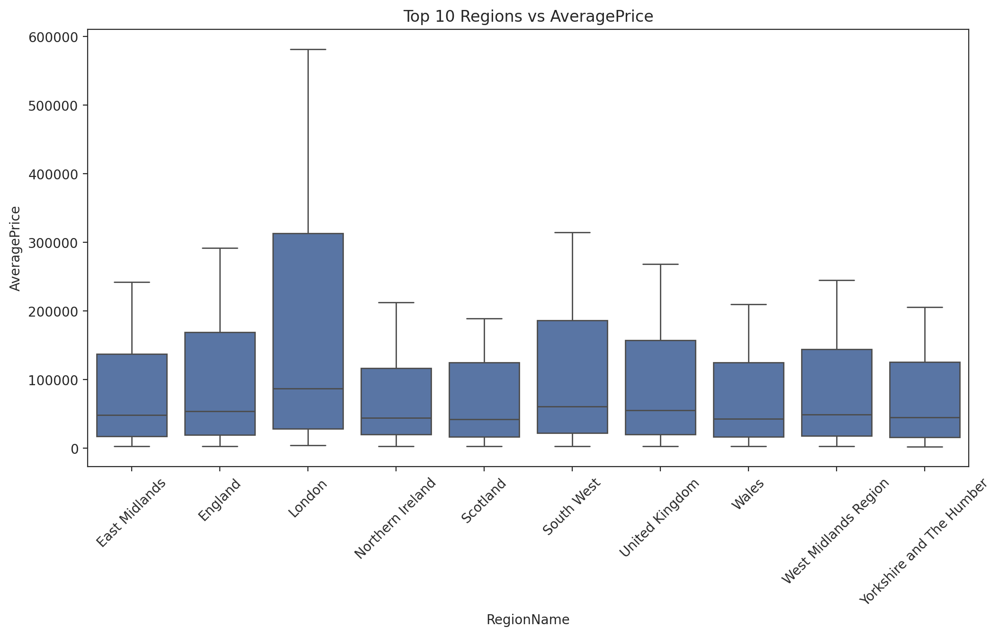

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate counts per region
region_counts = data['RegionName'].value_counts()

# Select top 10 regions by count
top_regions = region_counts.head(10).index.tolist()

# Filter data for these regions only
UkHPI_top = data[data['RegionName'].isin(top_regions)]

plt.figure(figsize=(12, 6))
sns.boxplot(data=UkHPI_top, x='RegionName', y='AveragePrice')
plt.xticks(rotation=45)
plt.title('Top 10 Regions vs AveragePrice')
plt.show()


In [67]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(data['Index'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# p-value < 0.05, the data is stationary

ADF Statistic: -38.806844636822056
p-value: 0.0


In [68]:
# Convert Date to datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

df["Year"] = df["Date"].dt.year
df["Month"] = df["Date"].dt.month
df["Quarter"] = df["Date"].dt.quarter


In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 36 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Date                    144630 non-null  datetime64[ns]
 1   RegionName              144630 non-null  object        
 2   AveragePrice            144630 non-null  int64         
 3   Index                   144630 non-null  float64       
 4   1m%Change               144630 non-null  float64       
 5   12m%Change              144630 non-null  float64       
 6   SalesVolume             144630 non-null  float64       
 7   DetachedPrice           144630 non-null  float64       
 8   DetachedIndex           144630 non-null  float64       
 9   Detached1m%Change       144630 non-null  float64       
 10  Detached12m%Change      144630 non-null  float64       
 11  SemiDetachedPrice       144630 non-null  float64       
 12  SemiDetachedIndex       144630

In [70]:
# Step 2: Create a single, composite numerical column
# This column is a combination of year and quarter
df['Year_Quarter_Numeric'] = df['Year'] + (df['Quarter']-1 ) / 4



print("DataFrame with a Single Composite Time Feature:")
print(df[['Year', 'Quarter', 'Year_Quarter_Numeric']].head(10))

DataFrame with a Single Composite Time Feature:
   Year  Quarter  Year_Quarter_Numeric
0  2004        1                2004.0
1  2004        1                2004.0
2  2004        1                2004.0
3  2004        1                2004.0
4  2004        1                2004.0
5  2004        1                2004.0
6  2004        1                2004.0
7  2004        1                2004.0
8  2004        1                2004.0
9  2004        1                2004.0


In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Date                    144630 non-null  datetime64[ns]
 1   RegionName              144630 non-null  object        
 2   AveragePrice            144630 non-null  int64         
 3   Index                   144630 non-null  float64       
 4   1m%Change               144630 non-null  float64       
 5   12m%Change              144630 non-null  float64       
 6   SalesVolume             144630 non-null  float64       
 7   DetachedPrice           144630 non-null  float64       
 8   DetachedIndex           144630 non-null  float64       
 9   Detached1m%Change       144630 non-null  float64       
 10  Detached12m%Change      144630 non-null  float64       
 11  SemiDetachedPrice       144630 non-null  float64       
 12  SemiDetachedIndex       144630

#Feature Engineering and Importance

In [73]:
UkHPI = df.copy()

In [74]:
numeric_cols = UkHPI.select_dtypes(exclude=['object', 'datetime64[ns]']).columns.tolist()
UkHPI[numeric_cols] = UkHPI[numeric_cols].fillna(0)
UkHPI[numeric_cols] = UkHPI[numeric_cols].astype('int64')

In [75]:
UkHPI.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 37 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Date                    144630 non-null  datetime64[ns]
 1   RegionName              144630 non-null  object        
 2   AveragePrice            144630 non-null  int64         
 3   Index                   144630 non-null  int64         
 4   1m%Change               144630 non-null  int64         
 5   12m%Change              144630 non-null  int64         
 6   SalesVolume             144630 non-null  int64         
 7   DetachedPrice           144630 non-null  int64         
 8   DetachedIndex           144630 non-null  int64         
 9   Detached1m%Change       144630 non-null  int64         
 10  Detached12m%Change      144630 non-null  int64         
 11  SemiDetachedPrice       144630 non-null  int64         
 12  SemiDetachedIndex       144630

In [88]:
df_london = UkHPI[UkHPI['RegionName'] == 'London'].copy()
df_london.sort_values('Date', inplace=True)

In [89]:
df_london.head(3)



,Date,RegionName,AveragePrice,Index,1m%Change,12m%Change,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,...,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume,Year,Month,Quarter,Year_Quarter_Numeric
70332,1968-01-04,London,4730,0,0,7,369,363130,105,0,...,8,174114,106,1,5,363,1968,1,1,1968
70333,1968-01-05,London,4730,0,1,7,391,362549,105,0,...,10,173820,105,1,5,384,1968,1,1,1968
70334,1968-01-06,London,4730,0,2,6,414,361969,104,0,...,12,173526,105,1,5,404,1968,1,1,1968


In [90]:
df_london.tail(3)

,Date,RegionName,AveragePrice,Index,1m%Change,12m%Change,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,...,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume,Year,Month,Quarter,Year_Quarter_Numeric
71011,2024-01-11,London,551252,96,-1,0,4143,1106720,94,-2,...,18,549976,95,-1,0,4125,2024,1,1,2024
71012,2024-01-12,London,551281,96,0,0,2816,1118925,95,1,...,12,381472,69,-1,0,2804,2024,1,1,2024
71013,2025-01-01,London,563899,98,2,2,1490,1146821,97,2,...,6,212968,42,-1,0,1483,2025,1,1,2025


In [86]:
df_london.info()

<class 'pandas.core.frame.DataFrame'>
Index: 682 entries, 70332 to 71013
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    682 non-null    datetime64[ns]
 1   RegionName              682 non-null    object        
 2   AveragePrice            682 non-null    int64         
 3   Index                   682 non-null    float64       
 4   1m%Change               682 non-null    float64       
 5   12m%Change              682 non-null    float64       
 6   SalesVolume             682 non-null    float64       
 7   DetachedPrice           682 non-null    float64       
 8   DetachedIndex           682 non-null    float64       
 9   Detached1m%Change       682 non-null    float64       
 10  Detached12m%Change      682 non-null    float64       
 11  SemiDetachedPrice       682 non-null    float64       
 12  SemiDetachedIndex       682 non-null    float64  

In [94]:
# 2. Create features BEFORE train-test split
target = 'AveragePrice'

def create_features(data):
    lags = [1, 2, 4, 8]
    for lag in lags:
        data[f'{target}_Lag{lag}'] = data[target].shift(lag)
    for window in [4, 8]:
        data[f'RollingMean_{window}'] = data[target].shift(1).rolling(window).mean()
        data[f'RollingStd_{window}'] = data[target].shift(1).rolling(window).std()
    return data

# Apply feature engineering on full London data (still sorted)
df_london = create_features(df_london)

# 3. Drop rows with NaNs from shifting/rolling
df_london.dropna(inplace=True)



In [92]:
split_date = df_london['Date'].quantile(0.8)
train = df_london[df_london['Date'] <= split_date]
test  = df_london[df_london['Date'] > split_date]

# Then apply lag/rolling
train = create_features(train)
test = create_features(test)


Top 10 Important Features (Train Set):
              feature  importance_mean  importance_std
0               Index     40055.788547     1164.744475
12      TerracedPrice     34617.182883     1820.833052
4       DetachedPrice      9194.132981      269.373903
16          FlatPrice      5710.414817      292.549268
17          FlatIndex      5663.540842      308.286156
37  AveragePrice_Lag8      4218.831174      225.572073
3         SalesVolume      3345.295407      108.710082
34  AveragePrice_Lag1      3186.663132      161.991386
8   SemiDetachedPrice      3048.913034      108.307757
9   SemiDetachedIndex      2532.495407      200.905153


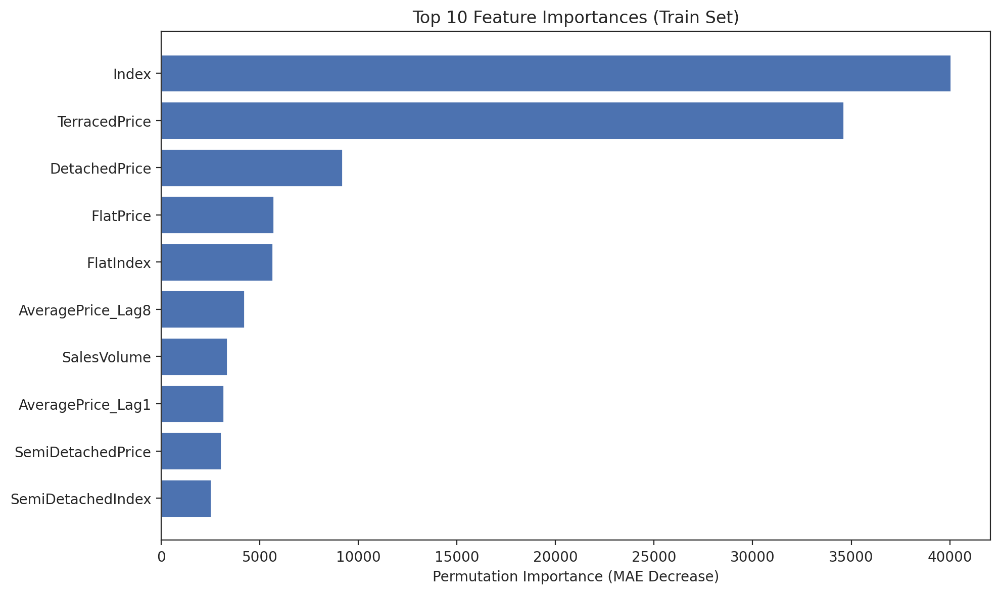

In [95]:
# ----------------------------
# 5. Train XGBoost model
# ----------------------------
model = XGBRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# ----------------------------
# 6. Permutation importance on train set
# ----------------------------
result = permutation_importance(
    model, X_train, y_train,
    scoring='neg_mean_absolute_error',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# ----------------------------
# 7. Display top features
# ----------------------------
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance_mean': result.importances_mean,
    'importance_std': result.importances_std
}).sort_values(by='importance_mean', ascending=False)

print("Top 10 Important Features (Train Set):")
print(importance_df.head(10))

# ----------------------------
# 8. Optional: Plot
# ----------------------------
plt.figure(figsize=(10, 6))
plt.barh(importance_df.head(10)['feature'], importance_df.head(10)['importance_mean'])
plt.xlabel('Permutation Importance (MAE Decrease)')
plt.title('Top 10 Feature Importances (Train Set)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

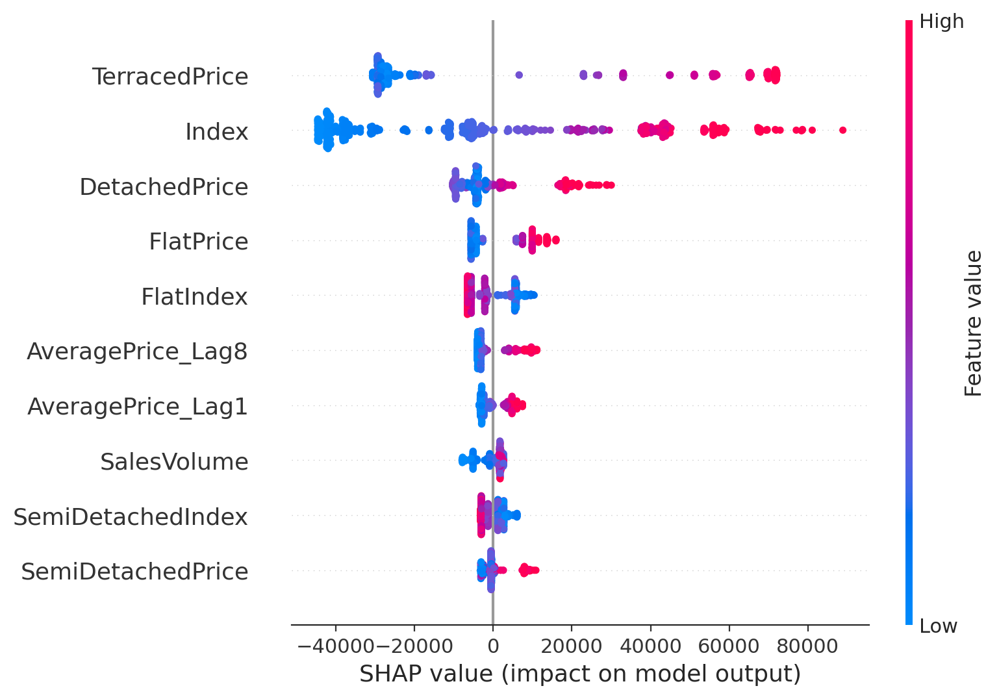

In [96]:
import shap

# ----------------------------
# 1. Load SHAP Explainer
# ----------------------------
explainer = shap.Explainer(model, X_train)

# ----------------------------
# 2. Calculate SHAP values
# ----------------------------
shap_values = explainer(X_train)

# ----------------------------
# 3. Summary Plot (Top Features)
# ----------------------------
shap.summary_plot(shap_values, X_train, max_display=10)


#Xgboost Model

In [125]:
# Sort full dataset
df.sort_values('Date', inplace=True)

# Correct split date: use end of 2023 for training
split_date = pd.to_datetime("2023-12-31")

# Split BEFORE filtering for region
train_full = df[df['Date'] <= split_date].copy()
test_full = df[df['Date'] > split_date].copy()

# Filter for London
train = train_full[train_full['RegionName'] == 'London'].copy()
test = test_full[test_full['RegionName'] == 'London'].copy()


In [126]:
def create_features(data, target='AveragePrice'):
    lags = [1, 2, 4, 8]
    for lag in lags:
        data[f'{target}_Lag{lag}'] = data[target].shift(lag)
    for window in [4, 8]:
        data[f'RollingMean_{window}'] = data[target].shift(1).rolling(window).mean()
        data[f'RollingStd_{window}'] = data[target].shift(1).rolling(window).std()
    return data

# Apply and drop NaNs (due to shift/rolling)
train = create_features(train).dropna()
test = create_features(test).dropna()


In [127]:
from sklearn.inspection import permutation_importance

# Example: Fit model
model = xgb.XGBRegressor()
X_train = train.drop(columns=['Date', 'RegionName', 'AveragePrice'])
y_train = train['AveragePrice']
model.fit(X_train, y_train)

# Get permutation importances
results = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=42)


In [118]:
import xgboost as xgb
from sklearn.model_selection import train_test_split

# Drop unused or target columns
features = train.drop(columns=['Date', 'RegionName', 'AveragePrice'])
target = train['AveragePrice']

# Fit model
model = xgb.XGBRegressor(random_state=42)
model.fit(features, target)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

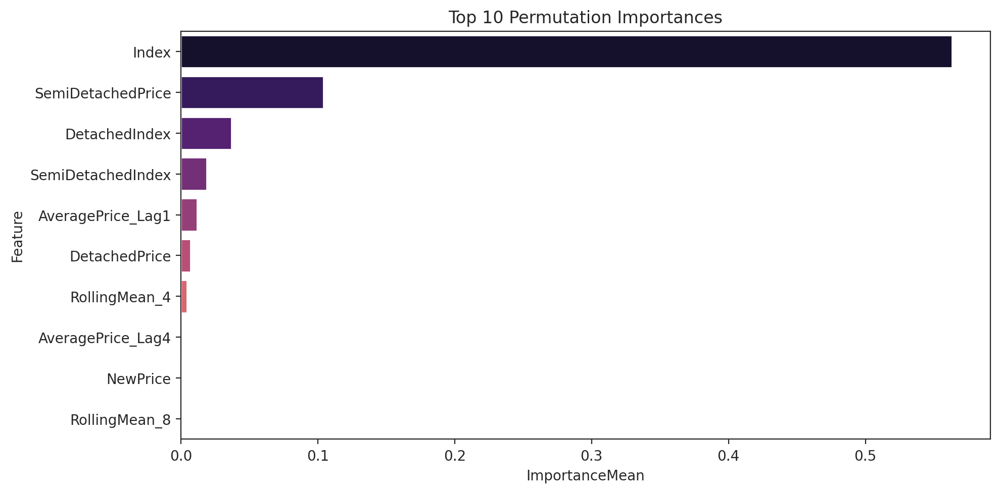

In [128]:
from sklearn.inspection import permutation_importance

perm = permutation_importance(model, features, target, n_repeats=10, random_state=2)
perm_df = pd.DataFrame({
    'Feature': features.columns,
    'ImportanceMean': perm.importances_mean,
    'ImportanceStd': perm.importances_std
}).sort_values(by='ImportanceMean', ascending=False).head(10)

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x='ImportanceMean', y='Feature', data=perm_df, palette='magma')
plt.title('Top 10 Permutation Importances')
plt.tight_layout()
plt.show()


In [129]:
top_features = importance_df.head(10)['feature'].tolist()
X_train_top = features[top_features]
model_top = xgb.XGBRegressor(random_state=42)
model_top.fit(X_train_top, target)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [130]:
# Top 10 important features you identified
top_features = [
    "Index",
    "SemiDetachedPrice",
    "DetachedIndex",
    "SemiDetachedIndex",
    "AveragePrice_Lag1",
    "DetachedPrice",
    "RollingMean_4",
    "AveragePrice_Lag4",
    "NewPrice",
    "RollingMean_8"
]

# Define inputs and targets
X_train = train[top_features]
y_train = train['AveragePrice']

X_test = test[top_features]
y_test = test['AveragePrice']



In [131]:
from xgboost import XGBRegressor

# Train
model = XGBRegressor(random_state=42)
model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [133]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Predict
y_pred = model.predict(X_test)

# Metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
r2 = r2_score(y_test, y_pred)

# Print
print(f"📊 XGBoost Evaluation Metrics (Test Set):")
print(f"MAE:  {mae:,.2f}")
print(f"RMSE: {rmse:,.2f}")
print(f"MAPE: {mape:.2f}%")
print(f"R² Score: {r2:.4f} ({r2*100:.2f}% accuracy)")


📊 XGBoost Evaluation Metrics (Test Set):
MAE:  2,484.82
RMSE: 2,712.02
MAPE: 0.44%
R² Score: 0.8518 (85.18% accuracy)


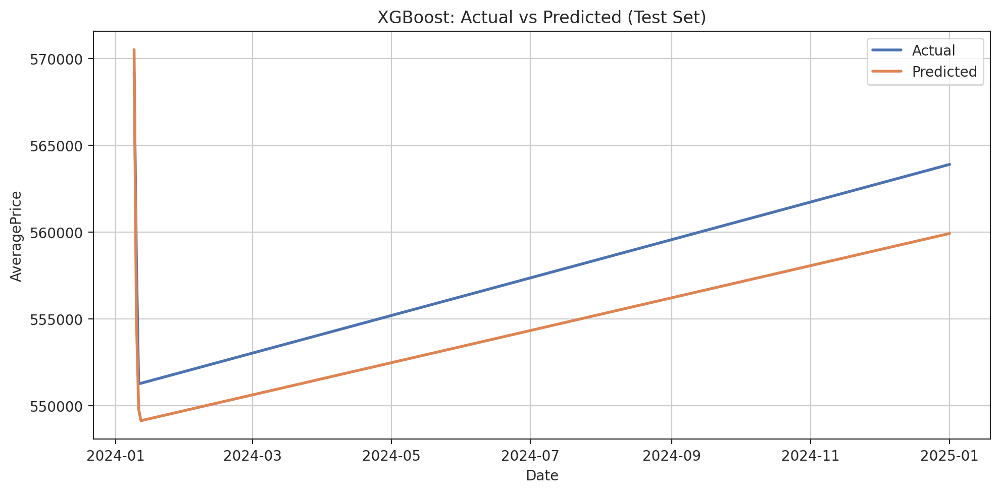

In [134]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(test['Date'], y_test.values, label='Actual', linewidth=2)
plt.plot(test['Date'], y_pred, label='Predicted', linewidth=2)
plt.xlabel('Date')
plt.ylabel('AveragePrice')
plt.title('XGBoost: Actual vs Predicted (Test Set)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#LSTM model

Epoch 1/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - loss: 0.0251 - val_loss: 3.5826e-04
Epoch 2/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 3.0130e-04 - val_loss: 2.4246e-04
Epoch 3/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 3.5006e-04 - val_loss: 2.2946e-04
Epoch 4/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 4.2607e-04 - val_loss: 2.4136e-04
Epoch 5/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 3.3999e-04 - val_loss: 2.2282e-04
Epoch 6/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 2.9260e-04 - val_loss: 8.6737e-04
Epoch 7/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 4.0865e-04 - val_loss: 2.2376e-04
Epoch 8/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 6.6948e-04 - val_loss: 4.0931e-04
Epoch 9/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 6.3367e-04 - val_loss: 2.3387e-04
Epoch 10/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 3.3130e-04 - val_loss: 2.7739e-04
Epoch 11/15
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step

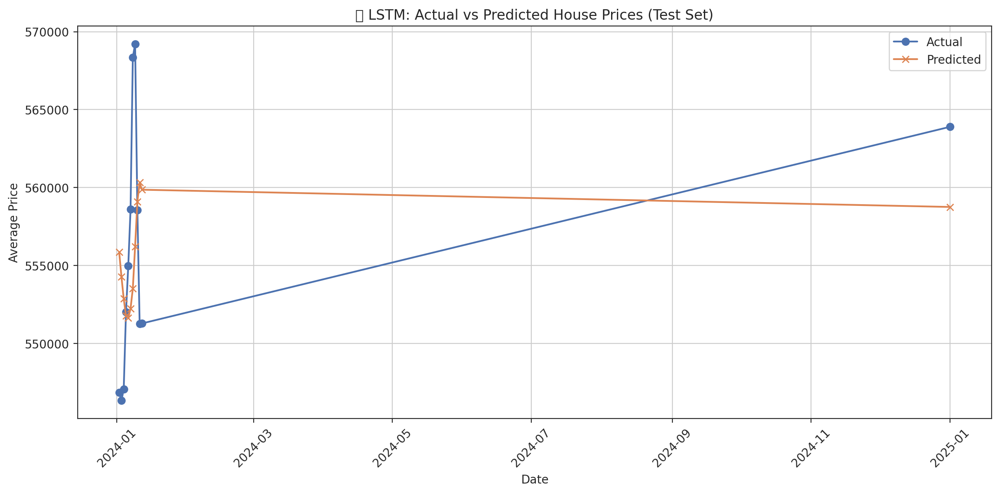

In [136]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Prepare the data (London only)
df_london = df[df['RegionName'] == 'London'].copy()
df_london.sort_values('Date', inplace=True)
df_london.reset_index(drop=True, inplace=True)

# 2. Use target and extract month
data = df_london[['Date', 'AveragePrice']].copy()
data['Month'] = pd.to_datetime(data['Date']).dt.month

# 3. Scale features
scaler_price = MinMaxScaler()
data['ScaledPrice'] = scaler_price.fit_transform(data[['AveragePrice']])

scaler_month = MinMaxScaler()
data['ScaledMonth'] = scaler_month.fit_transform(data[['Month']])

# 4. Create sequences including month
def create_sequences(df, lookback=12):
    X, y = [], []
    for i in range(lookback, len(df)):
        seq_x = df[i-lookback:i, :]
        seq_y = df[i, 0]  # target is price
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

lookback = 12
feature_array = data[['ScaledPrice', 'ScaledMonth']].values
X, y = create_sequences(feature_array, lookback)

# 5. Train/test split (last 12 months for testing)
test_size = 12
X_train, X_test = X[:-test_size], X[-test_size:]
y_train, y_test = y[:-test_size], y[-test_size:]

# 6. Build LSTM model
model = Sequential()
model.add(LSTM(128, activation='tanh', return_sequences=True, input_shape=(lookback, X_train.shape[2])))
model.add(LSTM(64, activation='tanh'))
model.add(Dense(1))
model.compile(optimizer=Adam(0.001), loss='mse')

# Early stopping
es = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# 7. Train model
history = model.fit(
    X_train, y_train,
    epochs=15,
    batch_size=4,
    validation_data=(X_test, y_test),
    callbacks=[es],
    verbose=1
)

# 8. Predict and inverse scale
y_pred = model.predict(X_test)
y_pred_inv = scaler_price.inverse_transform(y_pred)
y_test_inv = scaler_price.inverse_transform(y_test.reshape(-1, 1))

# 9. Evaluation
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
mape = np.mean(np.abs((y_test_inv - y_pred_inv) / y_test_inv)) * 100
r2 = r2_score(y_test_inv, y_pred_inv)

print("📊 LSTM Evaluation (Test Set)")
print(f"MAE:  {mae:,.2f}")
print(f"RMSE: {rmse:,.2f}")
print(f"MAPE: {mape:.2f}%")
print(f"R² Score: {r2:.4f} ({r2*100:.2f}% accuracy)")

# 10. Plot predictions
dates_test = data['Date'].iloc[-test_size:].reset_index(drop=True)

plt.figure(figsize=(12,6))
plt.plot(dates_test, y_test_inv, label='Actual', marker='o')
plt.plot(dates_test, y_pred_inv, label='Predicted', marker='x')
plt.title("🏠 LSTM: Actual vs Predicted House Prices (Test Set)")
plt.xlabel("Date")
plt.ylabel("Average Price")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#Arima model


In [20]:
data_arima = df.copy()

In [21]:
data_arima.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144630 entries, 0 to 144629
Data columns (total 36 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   RegionName              144630 non-null  object 
 1   AveragePrice            144630 non-null  int64  
 2   Index                   144630 non-null  float64
 3   1m%Change               144630 non-null  float64
 4   12m%Change              144630 non-null  float64
 5   SalesVolume             144630 non-null  float64
 6   DetachedPrice           144630 non-null  float64
 7   DetachedIndex           144630 non-null  float64
 8   Detached1m%Change       144630 non-null  float64
 9   Detached12m%Change      144630 non-null  float64
 10  SemiDetachedPrice       144630 non-null  float64
 11  SemiDetachedIndex       144630 non-null  float64
 12  SemiDetached1m%Change   144630 non-null  float64
 13  SemiDetached12m%Change  144630 non-null  float64
 14  TerracedPrice       

In [ ]:
#data_arima = data_arima.astype('int64')

In [38]:
%pip install pmdarima

In [27]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Use the new recommended method for PeriodIndex
data_arima['Year_Quarter'] = pd.PeriodIndex.from_fields(year=data_arima['Year'], quarter=data_arima['Quarter'])

# Dictionary to store forecasts
forecasts = {}
arima_models = {}

target_col = 'AveragePrice'  # <-- replace with your actual target column name

# Loop over each region
for region in data_arima['RegionName'].unique():
    # Aggregate target per quarter for this region
    ts = data_arima[df['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()  # Convert to Timestamp for ARIMA

    # Fit ARIMA manually (tune order if needed)
    model = ARIMA(ts, order=(1,1,1), seasonal_order=(1,1,1,4))
    fit = model.fit()

    arima_models[region] = fit
    forecasts[region] = fit.forecast(steps=4)  # Forecast next 4 quarters

    # Plot historical + forecast
    plt.figure(figsize=(8,4))
    plt.plot(ts.index, ts.values, label='Historical')
    plt.plot(forecasts[region].index, forecasts[region].values, label='Forecast', color='red')
    plt.title(f'ARIMA Forecast for {region}')
    plt.xlabel('Year-Quarter')
    plt.ylabel(target_col)
    plt.legend()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [30]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed

target_col = 'AveragePrice'  # Replace with your target column

# Ensure quarterly PeriodIndex
data_arima['Year_Quarter'] = pd.PeriodIndex.from_fields(year=data_arima['Year'], quarter=data_arima['Quarter'])

def arima_region(region, data_arima, target_col='Price', train_ratio=0.8, plot=False):
    # Aggregate target per quarter
    ts = data_arima[data_arima['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()

    # Train-test split
    train_size = int(len(ts) * train_ratio)
    train, test = ts[:train_size], ts[train_size:]

    # Fit ARIMA
    model = ARIMA(train, order=(1,1,1), seasonal_order=(1,1,1,4))
    fit = model.fit()

    # Forecast test period
    n_test = len(test)
    pred = fit.forecast(steps=n_test)

    # Compute metrics
    rmse = np.sqrt(mean_squared_error(test, pred))
    mae = mean_absolute_error(test, pred)
    mape = np.mean(np.abs((test - pred) / test)) * 100

    # Optional plot
    if plot:
        plt.figure(figsize=(8,4))
        plt.plot(train.index, train.values, label='Train')
        plt.plot(test.index, test.values, label='Test')
        plt.plot(pred.index, pred.values, label='Forecast', color='red')
        plt.title(f'ARIMA Forecast for {region}')
        plt.xlabel('Year-Quarter')
        plt.ylabel(target_col)
        plt.legend()
        plt.show()

    return {'RegionName': region, 'model': fit, 'forecast': pred,
            'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

# Get all unique regions
regions = data_arima['RegionName'].unique()

# Parallel processing for all regions
results = Parallel(n_jobs=-1)(
    delayed(arima_region)(region, data_arima, target_col, train_ratio=0.8, plot=False)
    for region in regions
)

# Convert results to DataFrame
scores_df = pd.DataFrame(results).drop(columns=['model','forecast'])
print(scores_df.head(15))

# Optional: Access individual ARIMA models or forecasts
region_model = results[0]['model']
region_forecast = results[0]['forecast']

                             RegionName          RMSE           MAE       MAPE
0                         Aberdeenshire  36704.234644  35518.262734  17.490460
1                                  Adur  23645.839961  20609.587720   5.956787
2                          Amber Valley  20628.105312  17298.050691   8.021575
3                                 Angus  14254.215295  14051.011958   8.800293
4               Antrim and Newtownabbey   9751.649421   7796.897247   4.432363
5                   Ards and North Down  15673.904442  14244.053499   7.273718
6                       Argyll and Bute  26593.139304  25995.470872  15.253436
7   Armagh City Banbridge and Craigavon   9178.379475   7215.115418   4.531890
8                                  Arun  16233.392132  14436.597957   4.712134
9                              Ashfield  20996.484585  17636.219936   9.757075
10                              Ashford  16686.647511  14706.916812   4.580364
11                              Babergh  22267.76647

London ARIMA results (final tweak):
RMSE: 60405.49, MAE: 56592.25, MAPE: 11.10%


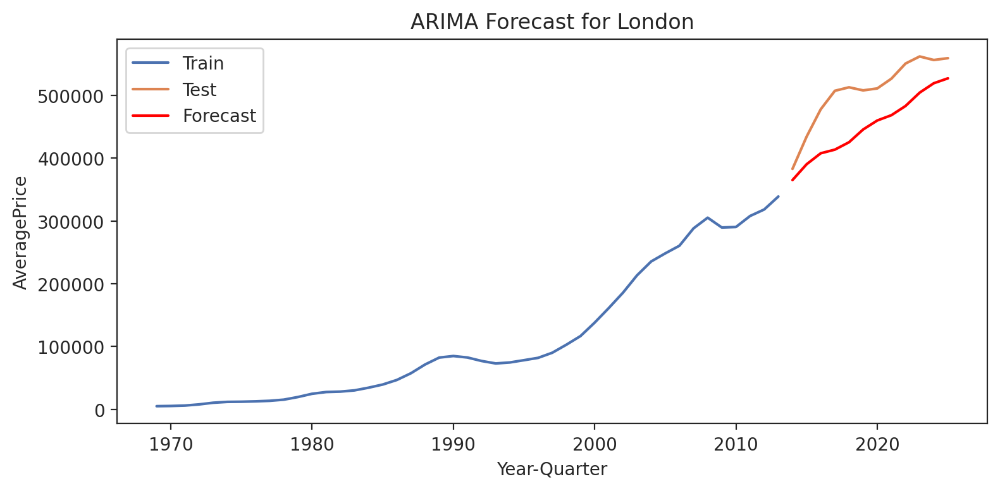

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

target_col = 'AveragePrice'

# Filter London only
london_data = data_arima[data_arima['RegionName'] == 'London'].copy()

# Ensure quarterly PeriodIndex
london_data['Year_Quarter'] = pd.PeriodIndex.from_fields(
    year=london_data['Year'], quarter=london_data['Quarter'])

# Aggregate per quarter
ts = london_data.groupby('Year_Quarter')[target_col].mean()
ts.index = ts.index.to_timestamp()

# Apply 2-point rolling smoothing
ts_smooth = ts.rolling(window=2, center=False).mean().dropna()

# Train-test split
train_size = int(len(ts_smooth) * 0.8)
train, test = ts_smooth[:train_size], ts_smooth[train_size:]

# Final tweak: simpler MA term
model = ARIMA(train, order=(2,1,1), seasonal_order=(1,1,1,4))
fit = model.fit()

# Forecast
n_test = len(test)
pred = fit.forecast(steps=n_test)

# Metrics
rmse = np.sqrt(mean_squared_error(test, pred))
mae = mean_absolute_error(test, pred)
mape = np.mean(np.abs((test - pred) / test)) * 100

print(f"London ARIMA results (final tweak):\nRMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")

# Plot
plt.figure(figsize=(8, 4))
plt.plot(train.index, train.values, label='Train')
plt.plot(test.index, test.values, label='Test')
plt.plot(pred.index, pred.values, label='Forecast', color='red')
plt.title('ARIMA Forecast for London (2-pt smoothing, final tweak)')
plt.xlabel('Year-Quarter')
plt.ylabel(target_col)
plt.legend()
plt.tight_layout()
plt.show()


Manchester ARIMA results :
RMSE: 32357.59, MAE: 28430.80, MAPE: 12.43%


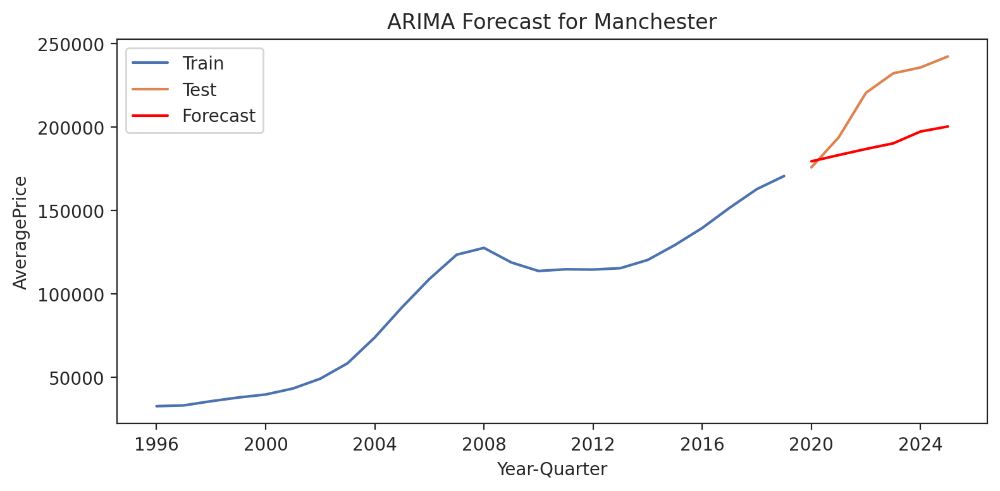

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

target_col = 'AveragePrice'

# Filter Manchester only
manchester_data = data_arima[data_arima['RegionName'] == 'Manchester'].copy()

# Ensure quarterly PeriodIndex
manchester_data['Year_Quarter'] = pd.PeriodIndex.from_fields(
    year=manchester_data['Year'], quarter=manchester_data['Quarter'])

# Aggregate per quarter
ts = manchester_data.groupby('Year_Quarter')[target_col].mean()
ts.index = ts.index.to_timestamp()

# Apply 2-point rolling smoothing
ts_smooth = ts.rolling(window=2).mean().dropna()

# Train-test split
train_size = int(len(ts_smooth) * 0.8)
train, test = ts_smooth[:train_size], ts_smooth[train_size:]

# Tuned ARIMA model (same as London best)
model = ARIMA(train, order=(2,1,2), seasonal_order=(1,1,1,4))
fit = model.fit()

# Forecast
n_test = len(test)
pred = fit.forecast(steps=n_test)

# Metrics
rmse = np.sqrt(mean_squared_error(test, pred))
mae = mean_absolute_error(test, pred)
mape = np.mean(np.abs((test - pred) / test)) * 100

print(f"Manchester ARIMA results :\nRMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")

# Plot
plt.figure(figsize=(8, 4))
plt.plot(train.index, train.values, label='Train')
plt.plot(test.index, test.values, label='Test')
plt.plot(pred.index, pred.values, label='Forecast', color='red')
plt.title('ARIMA Forecast for Manchester')
plt.xlabel('Year-Quarter')
plt.ylabel(target_col)
plt.legend()
plt.tight_layout()
plt.show()


In [47]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Use smoothed or raw ts depending on which worked better
ts = london_data.groupby('Year_Quarter')[target_col].mean()
ts.index = ts.index.to_timestamp()
ts_smooth = ts.rolling(window=2).mean().dropna()

train_size = int(len(ts_smooth) * 0.8)
train, test = ts_smooth[:train_size], ts_smooth[train_size:]

model = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=4)
fit = model.fit()

pred = fit.forecast(steps=len(test))

rmse = np.sqrt(mean_squared_error(test, pred))
mae = mean_absolute_error(test, pred)
mape = np.mean(np.abs((test - pred) / test)) * 100

print(f"London ETS results:\nRMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")


London ETS results:
RMSE: 46949.20, MAE: 40264.54, MAPE: 8.14%


#Sarima

Best ARIMA order: (2, 0, 0), Seasonal order: (0, 1, 1)
RMSE: 31883.59
MAE: 28290.35
MAPE: 5.45%


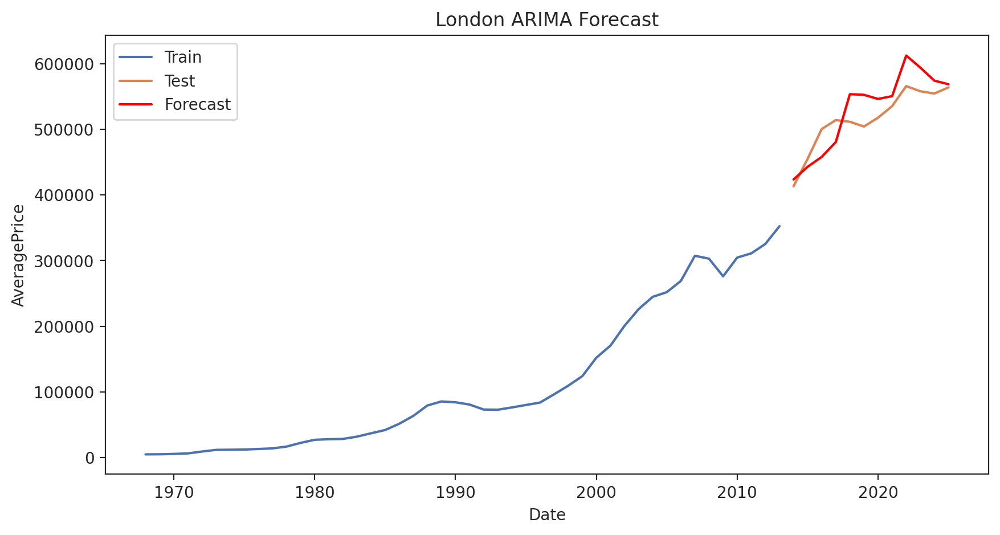

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ---------------------------
# Prepare the data
# ---------------------------
target_col = 'AveragePrice'
region = 'London'

# Ensure quarterly PeriodIndex
data_arima['Year_Quarter'] = pd.PeriodIndex.from_fields(year=data_arima['Year'], quarter=data_arima['Quarter'])
ts = data_arima[data_arima['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
ts.index = ts.index.to_timestamp()

# Log-transform to stabilize variance
ts_log = np.log(ts)

# Train-test split
train_ratio = 0.8
train_size = int(len(ts_log) * train_ratio)
train, test = ts_log[:train_size], ts_log[train_size:]

# ---------------------------
# Grid search for best ARIMA/SARIMA
# ---------------------------
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
s = 4  # quarterly seasonality

best_mape = float('inf')
best_order = None
best_seasonal_order = None
best_model = None

for i in p:
    for j in d:
        for k in q:
            for I in P:
                for J in D:
                    for K in Q:
                        try:
                            model = SARIMAX(train,
                                            order=(i,j,k),
                                            seasonal_order=(I,J,K,s),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
                            fit = model.fit(disp=False)
                            pred_log = fit.forecast(steps=len(test))
                            # Convert back from log
                            pred = np.exp(pred_log)
                            mape = np.mean(np.abs((np.exp(test) - pred) / np.exp(test))) * 100
                            if mape < best_mape:
                                best_mape = mape
                                best_order = (i,j,k)
                                best_seasonal_order = (I,J,K)
                                best_model = fit
                        except:
                            continue

# ---------------------------
# Forecast and metrics
# ---------------------------
forecast_log = best_model.forecast(steps=len(test))
forecast = np.exp(forecast_log)  # back-transform

rmse = np.sqrt(mean_squared_error(np.exp(test), forecast))
mae = mean_absolute_error(np.exp(test), forecast)
mape = np.mean(np.abs((np.exp(test) - forecast) / np.exp(test))) * 100

print(f"Best ARIMA order: {best_order}, Seasonal order: {best_seasonal_order}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

# ---------------------------
# Plot
# ---------------------------
plt.figure(figsize=(10,5))
plt.plot(train.index, np.exp(train), label='Train')
plt.plot(test.index, np.exp(test), label='Test')
plt.plot(test.index, forecast, color='red', label='Forecast')
plt.title(f'London ARIMA Forecast')
plt.xlabel('Date')
plt.ylabel(target_col)
plt.legend()
plt.show()


Best ARIMA order: (1, 0, 0), Seasonal order: (0, 1, 0)
RMSE: 9276.74
MAE: 7745.66
MAPE: 3.65%


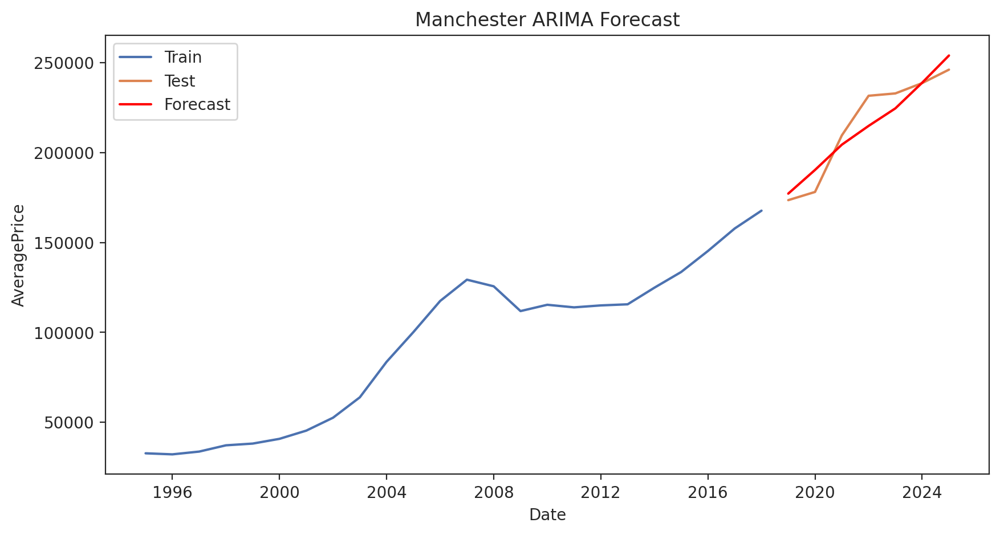

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ---------------------------
# Prepare the data
# ---------------------------
target_col = 'AveragePrice'
region = 'Manchester'

# Ensure quarterly PeriodIndex
data_arima['Year_Quarter'] = pd.PeriodIndex.from_fields(year=data_arima['Year'], quarter=data_arima['Quarter'])
ts = data_arima[data_arima['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
ts.index = ts.index.to_timestamp()

# Log-transform to stabilize variance
ts_log = np.log(ts)

# Train-test split
train_ratio = 0.8
train_size = int(len(ts_log) * train_ratio)
train, test = ts_log[:train_size], ts_log[train_size:]

# ---------------------------
# Grid search for best ARIMA/SARIMA
# ---------------------------
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
s = 4  # quarterly seasonality

best_mape = float('inf')
best_order = None
best_seasonal_order = None
best_model = None

for i in p:
    for j in d:
        for k in q:
            for I in P:
                for J in D:
                    for K in Q:
                        try:
                            model = SARIMAX(train,
                                            order=(i,j,k),
                                            seasonal_order=(I,J,K,s),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
                            fit = model.fit(disp=False)
                            pred_log = fit.forecast(steps=len(test))
                            # Convert back from log
                            pred = np.exp(pred_log)
                            mape = np.mean(np.abs((np.exp(test) - pred) / np.exp(test))) * 100
                            if mape < best_mape:
                                best_mape = mape
                                best_order = (i,j,k)
                                best_seasonal_order = (I,J,K)
                                best_model = fit
                        except:
                            continue

# ---------------------------
# Forecast and metrics
# ---------------------------
forecast_log = best_model.forecast(steps=len(test))
forecast = np.exp(forecast_log)  # back-transform

rmse = np.sqrt(mean_squared_error(np.exp(test), forecast))
mae = mean_absolute_error(np.exp(test), forecast)
mape = np.mean(np.abs((np.exp(test) - forecast) / np.exp(test))) * 100

print(f"Best ARIMA order: {best_order}, Seasonal order: {best_seasonal_order}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

# ---------------------------
# Plot
# ---------------------------
plt.figure(figsize=(10,5))
plt.plot(train.index, np.exp(train), label='Train')
plt.plot(test.index, np.exp(test), label='Test')
plt.plot(test.index, forecast, color='red', label='Forecast')
plt.title(f'Manchester ARIMA Forecast')
plt.xlabel('Date')
plt.ylabel(target_col)
plt.legend()
plt.show()


In [32]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Combine all region forecasts into one series
all_preds = []
all_actuals = []

for res in results:
    pred = res['forecast']
    region = res['RegionName']
    ts = data_arima[data_arima['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()
    train_size = int(len(ts) * 0.8)
    test = ts[train_size:]

    all_preds.append(pred)
    all_actuals.append(test)

# Concatenate all regions
y_pred = pd.concat(all_preds)
y_true = pd.concat(all_actuals)

# Compute metrics
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
accuracy_percent = 100 - mape  # optional "score-like" percentage

print("Global ARIMA Performance:")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"MAPE: {mape:.2f}%")
print(f"ARIMA Accuracy Score: {accuracy_percent:.2f}%")

Global ARIMA Performance:
RMSE: 39074.951
MAE: 23398.415
MAPE: 7.85%
ARIMA Accuracy Score: 92.15%


#Feature Engineering and importance

In [ ]:
import pandas as pd
import numpy as np

# Assume df_model already has 'Year_Quarter_Num' and is sorted by Date & RegionName
# For safety:

df_model = df.copy()
df_model.index.name = 'Date'
df_model.sort_values(by=['RegionName', 'Date'], inplace=True)

# Target column
target = 'AveragePrice'

# --- Lag features ---
# Common seasonal lags: 1 quarter (immediate past) and 4 quarters (1 year ago)
df_model['AveragePrice_Lag1'] = df_model.groupby('RegionName')[target].shift(1)
df_model['AveragePrice_Lag4'] = df_model.groupby('RegionName')[target].shift(4)

# Additional lags for richer context
df_model['AveragePrice_Lag2'] = df_model.groupby('RegionName')[target].shift(2)
df_model['AveragePrice_Lag8'] = df_model.groupby('RegionName')[target].shift(8)

# --- Rolling mean features ---
df_model['RollingMean_4'] = df_model.groupby('RegionName')[target].shift(1).rolling(window=4).mean()
df_model['RollingMean_8'] = df_model.groupby('RegionName')[target].shift(1).rolling(window=8).mean()

# --- Rolling standard deviation features ---
df_model['RollingStd_4'] = df_model.groupby('RegionName')[target].shift(1).rolling(window=4).std()
df_model['RollingStd_8'] = df_model.groupby('RegionName')[target].shift(1).rolling(window=8).std()

# Drop rows with NaN from lags/rolls
df_model.dropna(inplace=True)

print(df_model.head(15)[[
    'RegionName', 'Year_Quarter_Numeric',
    'AveragePrice', 'AveragePrice_Lag1', 'AveragePrice_Lag4',
    'RollingMean_4', 'RollingStd_4'
]])

         RegionName  Year_Quarter_Numeric  AveragePrice  AveragePrice_Lag1  \
Date                                                                         
8     Aberdeenshire                2004.0        102220           101315.0   
9     Aberdeenshire                2004.0        102655           102220.0   
10    Aberdeenshire                2004.0        103013           102655.0   
11    Aberdeenshire                2004.0        104124           103013.0   
12    Aberdeenshire                2005.0        105489           104124.0   
13    Aberdeenshire                2005.0        101145           105489.0   
14    Aberdeenshire                2005.0         98196           101145.0   
15    Aberdeenshire                2005.0         99302            98196.0   
16    Aberdeenshire                2005.0        105412            99302.0   
17    Aberdeenshire                2005.0        110561           105412.0   
18    Aberdeenshire                2005.0        112337         

In [ ]:
UKHPI = df_model.copy()
UKHPI = UKHPI.drop(columns=['RegionName'])


In [ ]:
UKHPI = UKHPI.astype('int64')
UKHPI.info()

<class 'pandas.core.frame.DataFrame'>
Index: 141390 entries, 8 to 144629
Data columns (total 44 columns):
 #   Column                  Non-Null Count   Dtype
---  ------                  --------------   -----
 0   AveragePrice            141390 non-null  int64
 1   Index                   141390 non-null  int64
 2   1m%Change               141390 non-null  int64
 3   12m%Change              141390 non-null  int64
 4   SalesVolume             141390 non-null  int64
 5   DetachedPrice           141390 non-null  int64
 6   DetachedIndex           141390 non-null  int64
 7   Detached1m%Change       141390 non-null  int64
 8   Detached12m%Change      141390 non-null  int64
 9   SemiDetachedPrice       141390 non-null  int64
 10  SemiDetachedIndex       141390 non-null  int64
 11  SemiDetached1m%Change   141390 non-null  int64
 12  SemiDetached12m%Change  141390 non-null  int64
 13  TerracedPrice           141390 non-null  int64
 14  TerracedIndex           141390 non-null  int64
 15  Terra

#Feature Importance(SHap & Permutation)

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import pandas as pd

# Features & target
y = UKHPI['AveragePrice']
X = UKHPI  #

# Time-based split (example: all data before 2024 for training)
train_mask = UKHPI['Year'] < 2024
X_train, X_test = X[train_mask], X[~train_mask]
y_train, y_test = y[train_mask], y[~train_mask]

# Train XGBoost
model = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
model.fit(X_train, y_train)

# Get feature importances
importances = pd.Series(model.feature_importances_, index=X.columns)
importances = importances.sort_values(ascending=False)
print(importances.head(20))

AveragePrice_Lag1       0.334568
AveragePrice            0.274442
OldPrice                0.249504
AveragePrice_Lag2       0.029784
RegionName_TE           0.017194
RollingMean_8           0.015001
RollingMean_4           0.014061
FlatPrice               0.010178
RollingStd_8            0.007131
NewPrice                0.007091
DetachedIndex           0.006440
AveragePrice_Lag8       0.004084
FlatIndex               0.003226
DetachedPrice           0.003094
SemiDetachedIndex       0.002687
Year_Quarter_Numeric    0.002515
AveragePrice_Lag4       0.002336
TerracedIndex           0.002107
NewSalesVolume          0.001683
Year                    0.001674
dtype: float32


In [ ]:
%pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 44.9 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


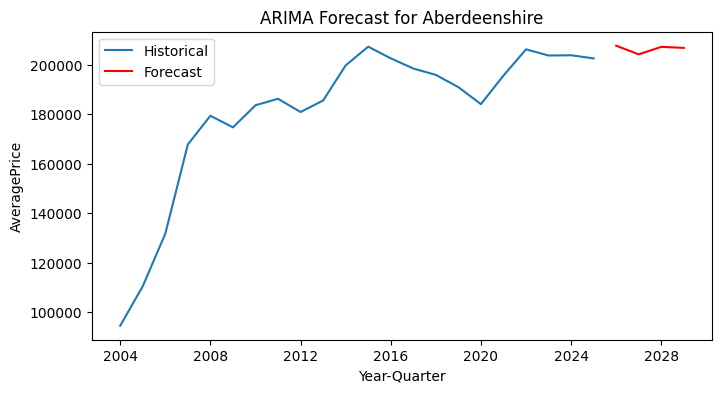

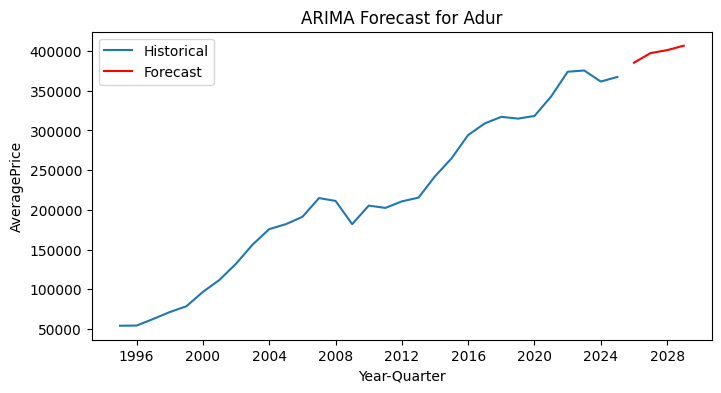

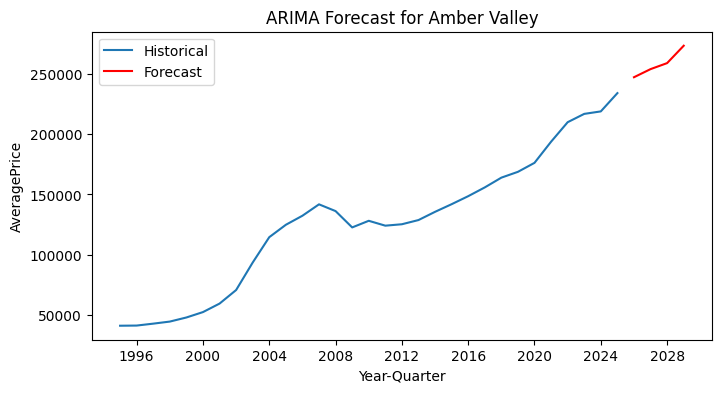

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


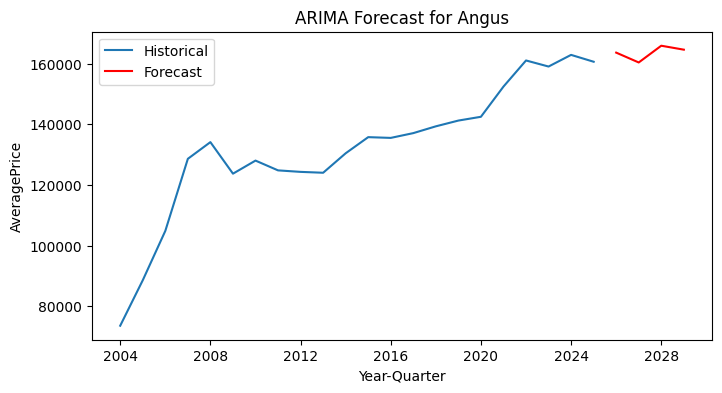

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


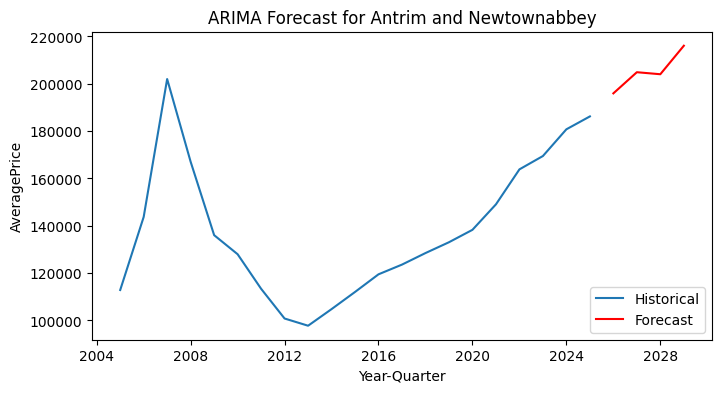

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


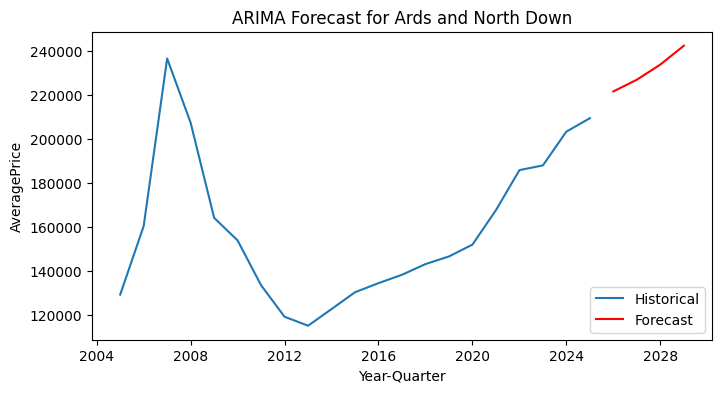

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


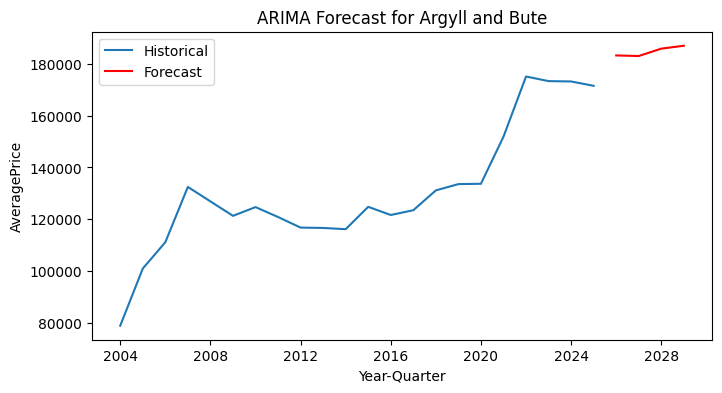

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


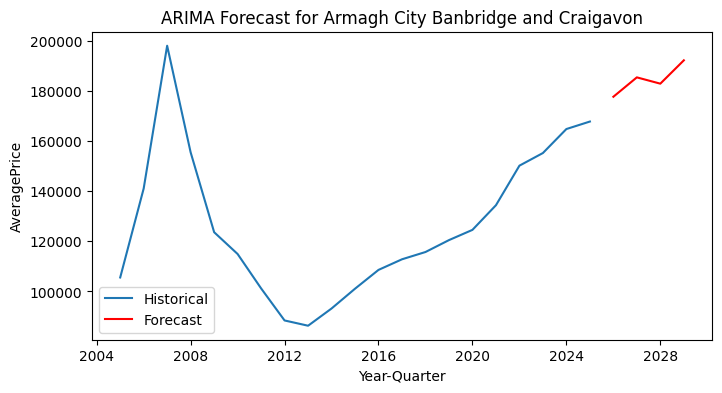

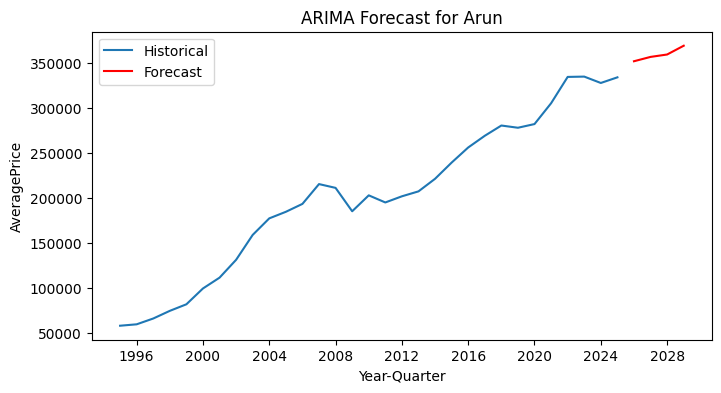

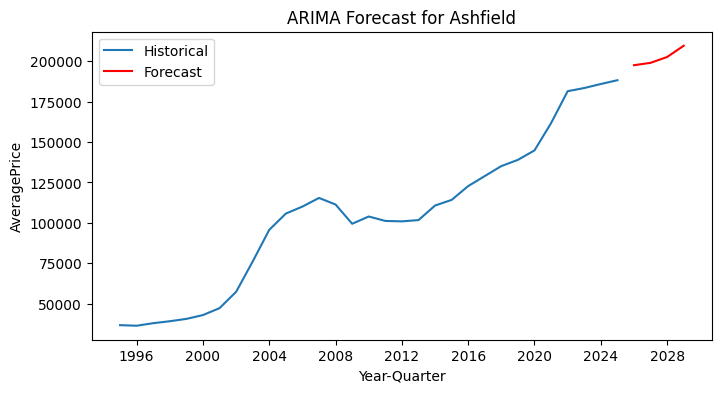

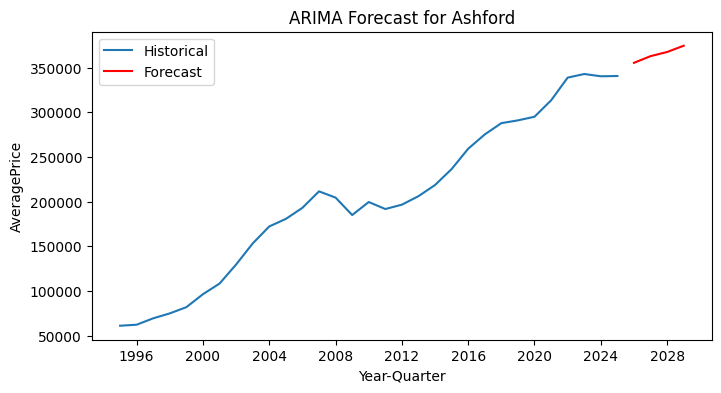

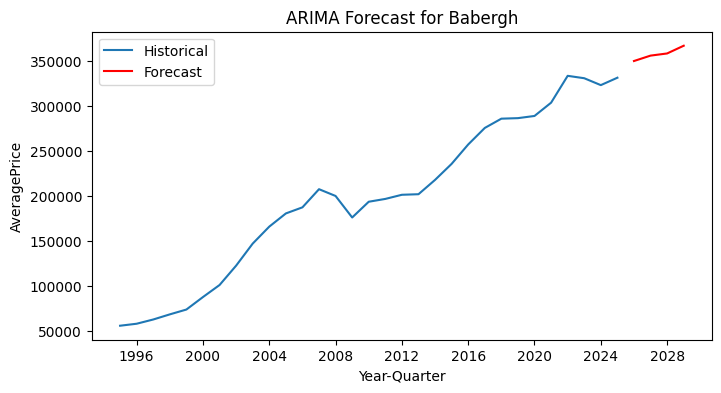

...

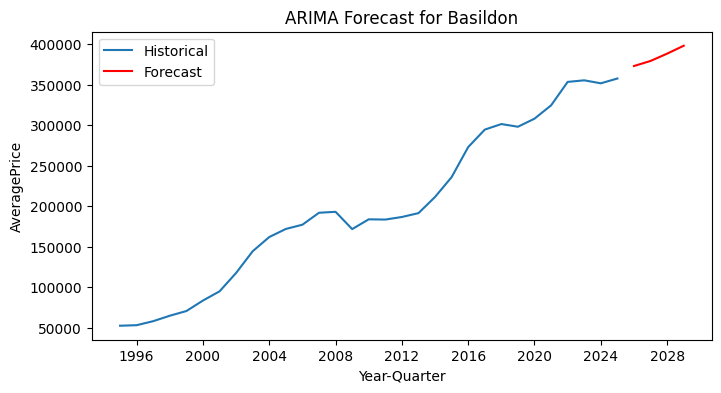

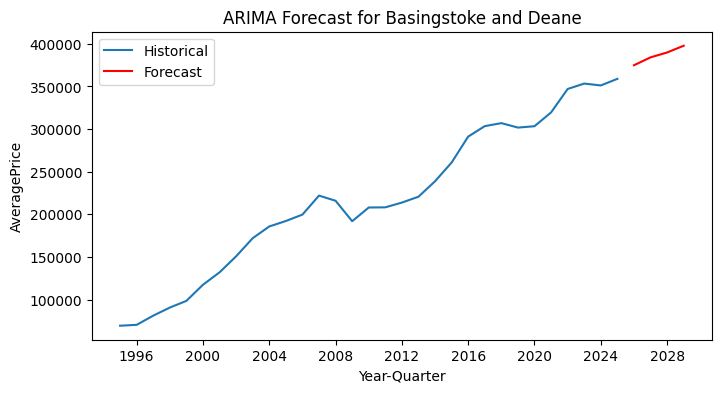

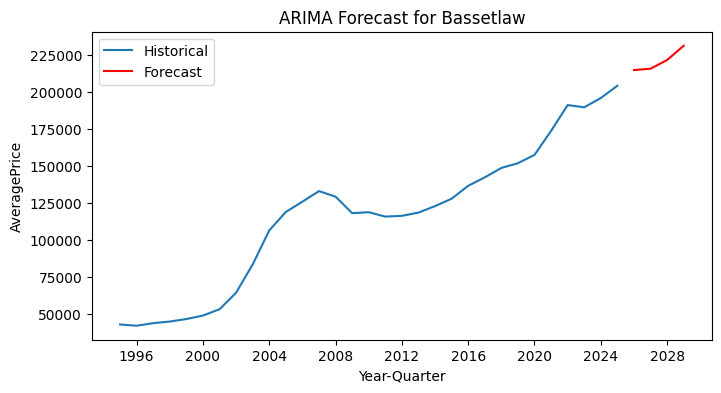

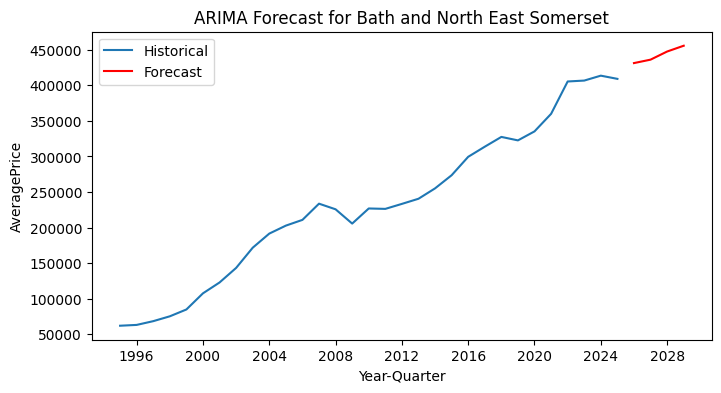

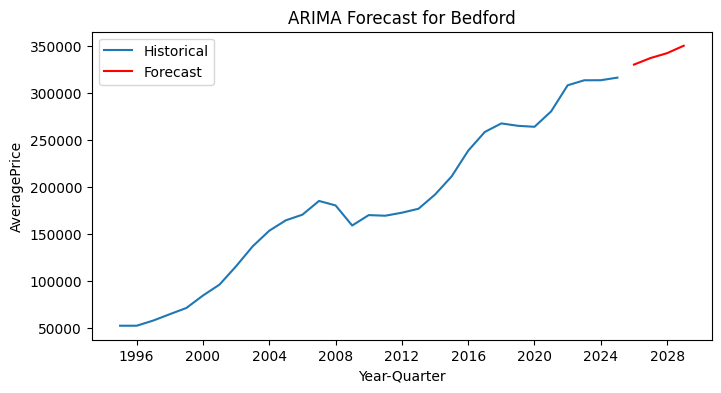

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


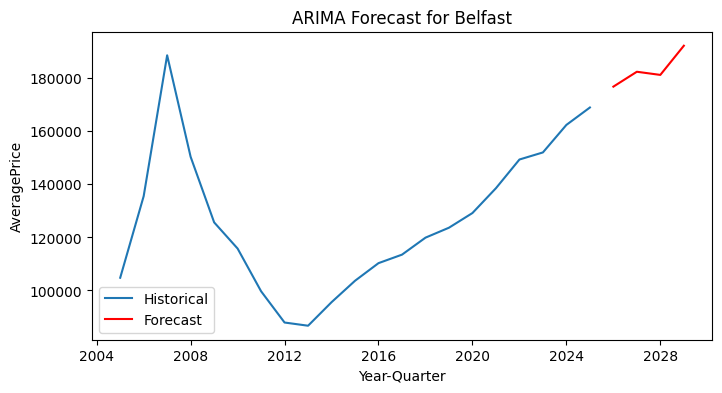

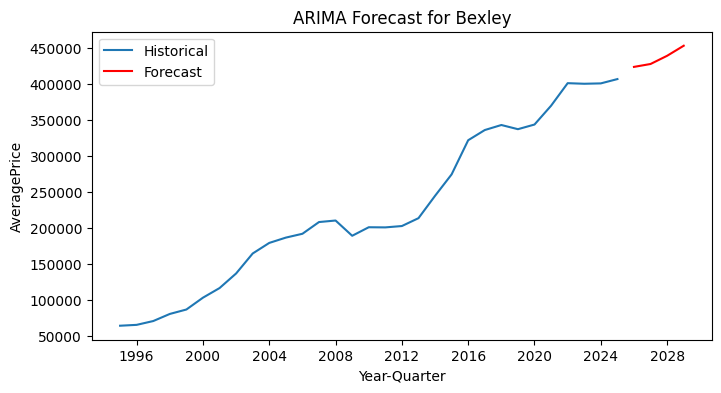

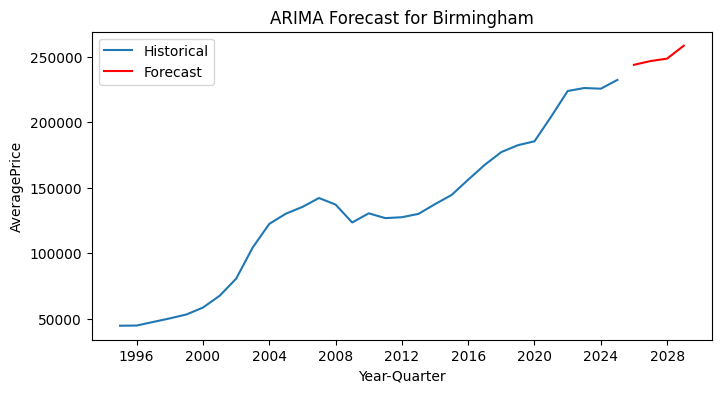

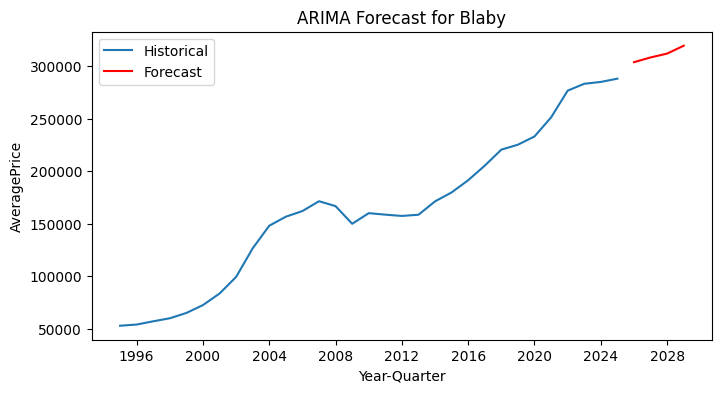

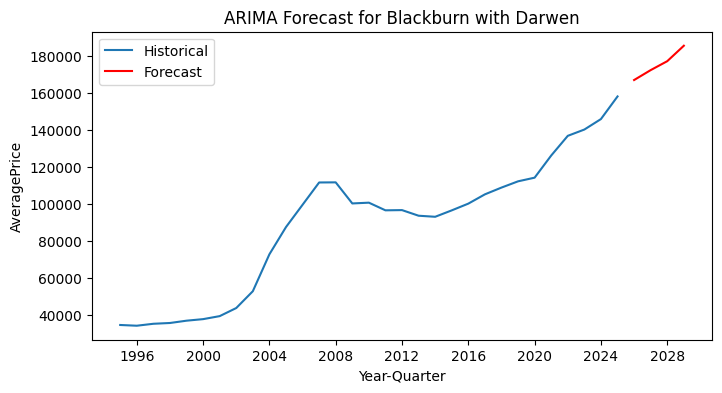

...

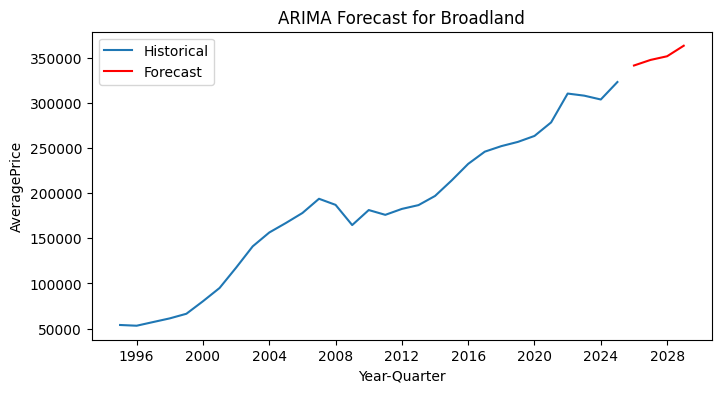

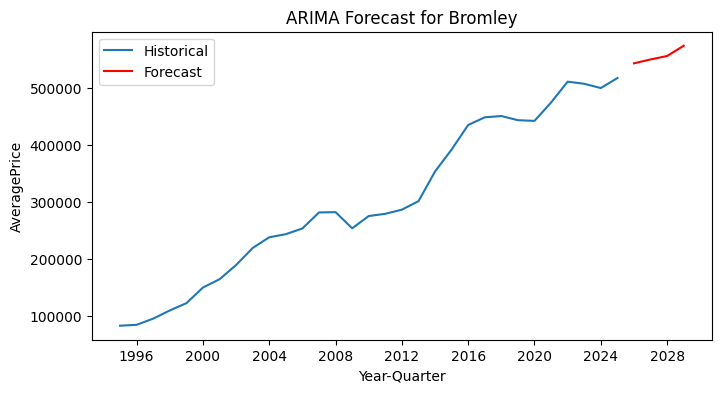

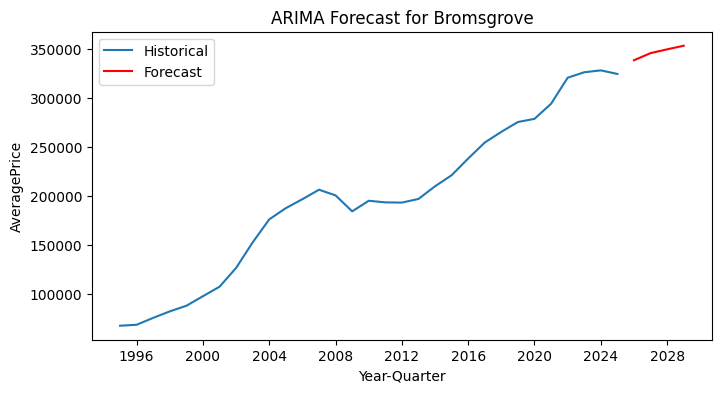

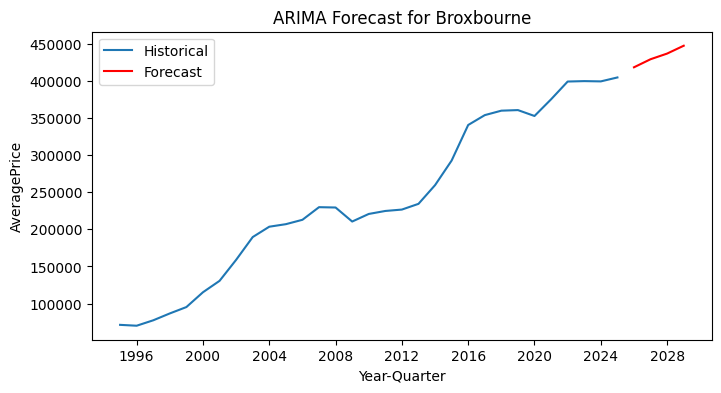

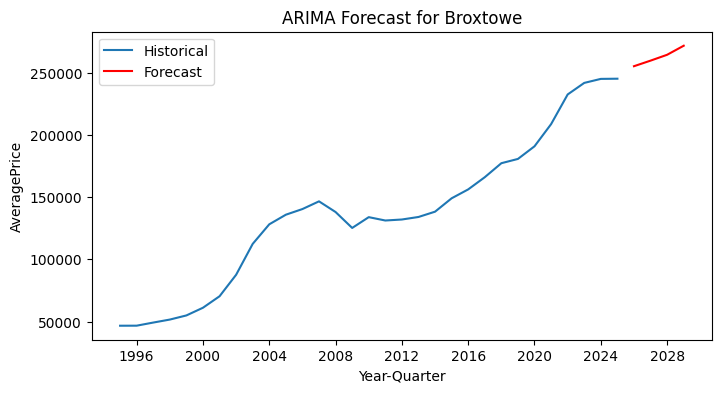

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


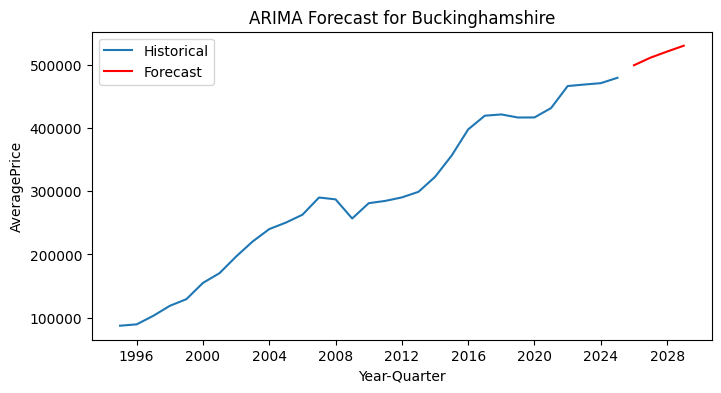

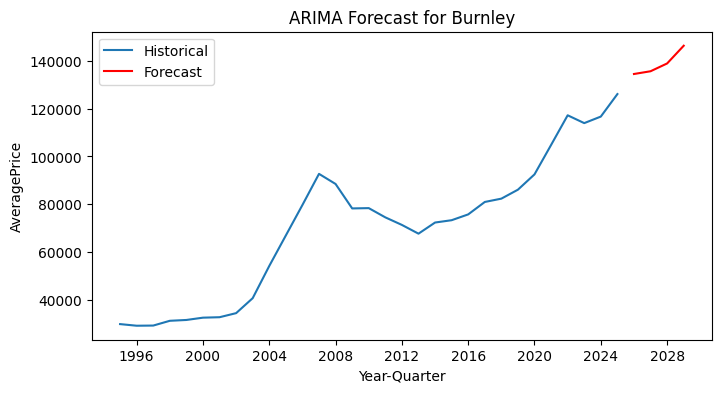

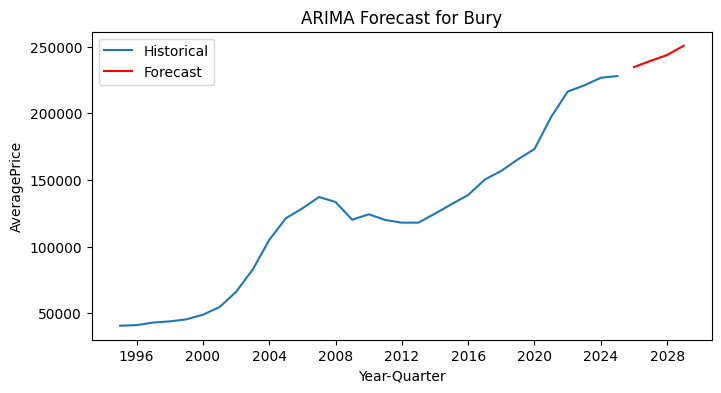

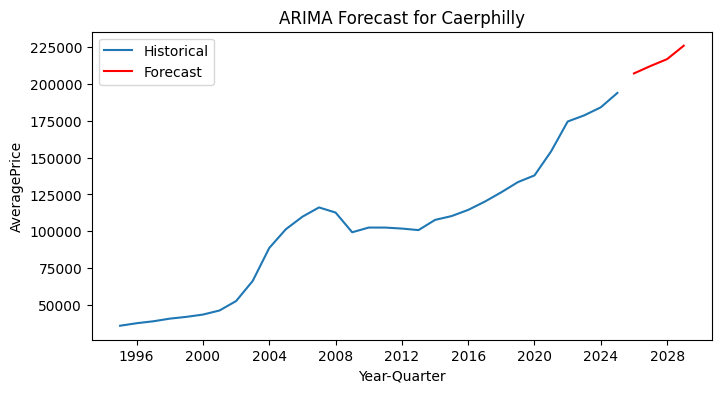

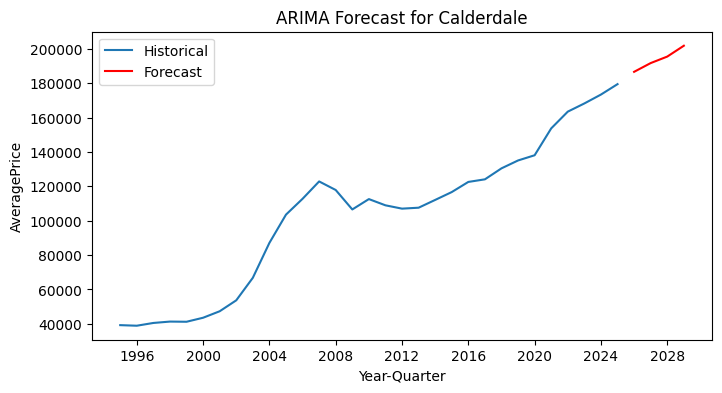

...

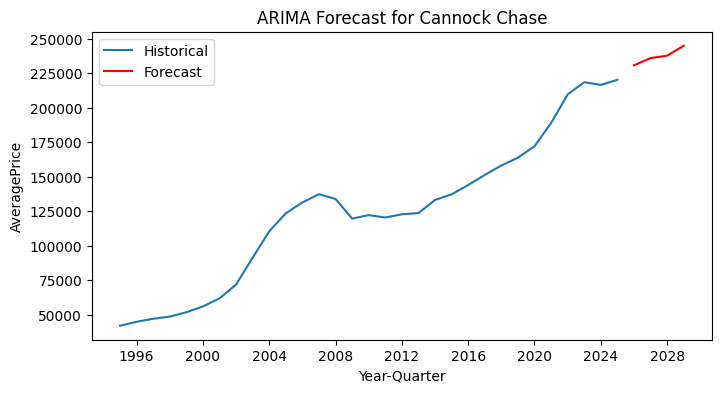

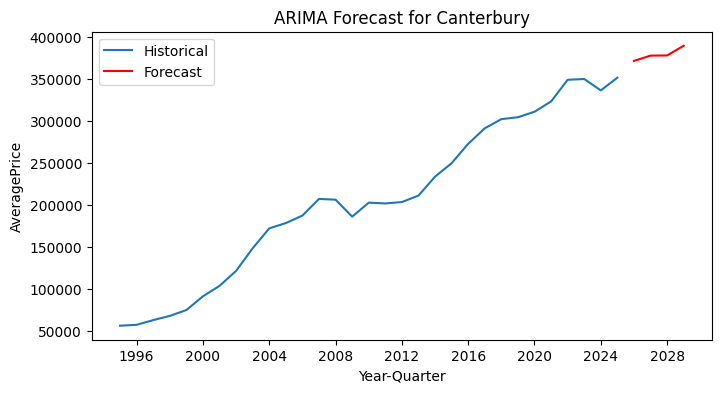

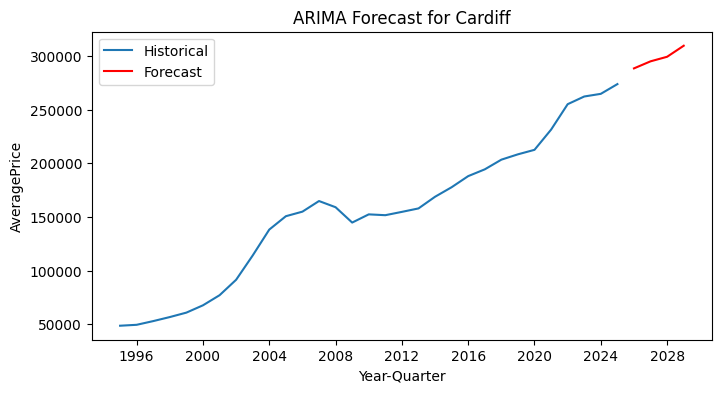

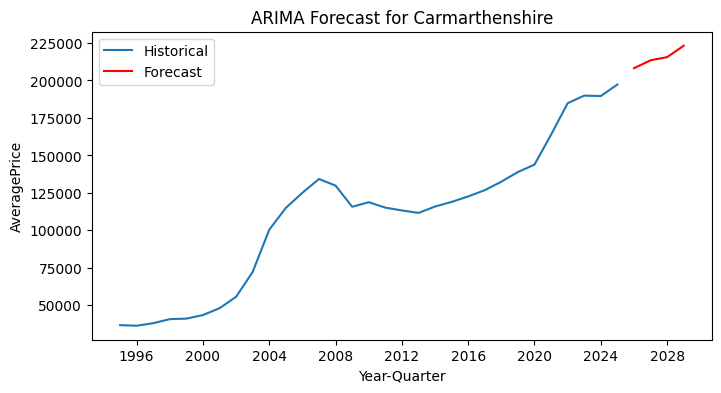

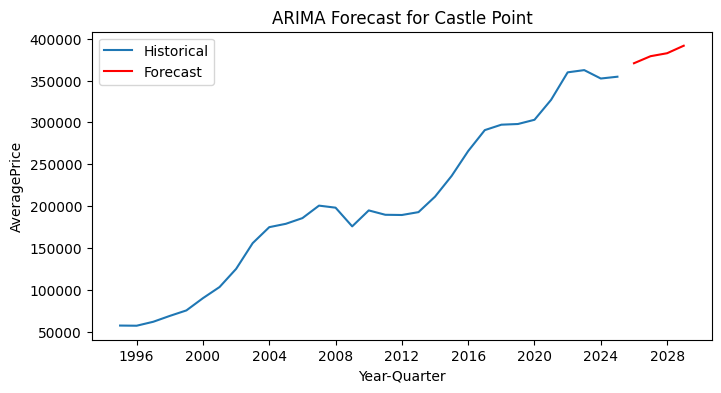

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


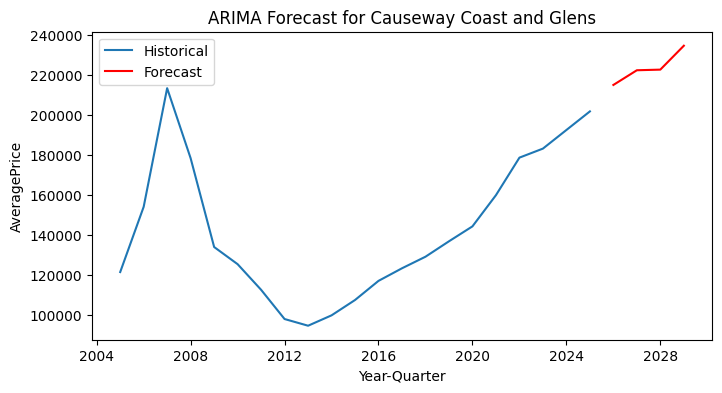

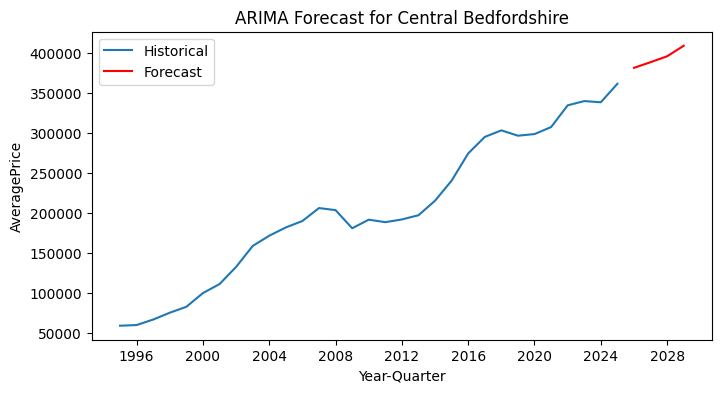

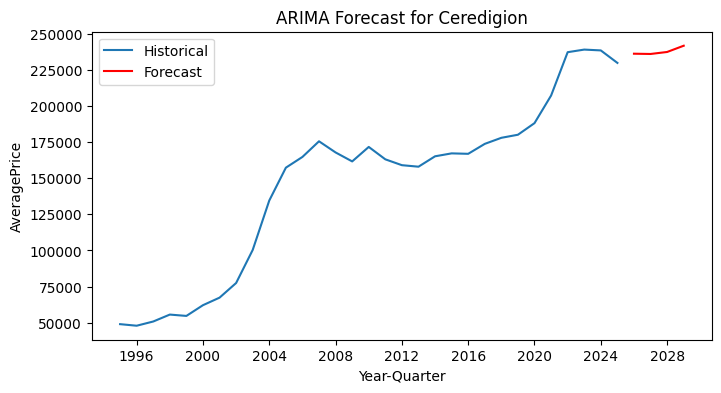

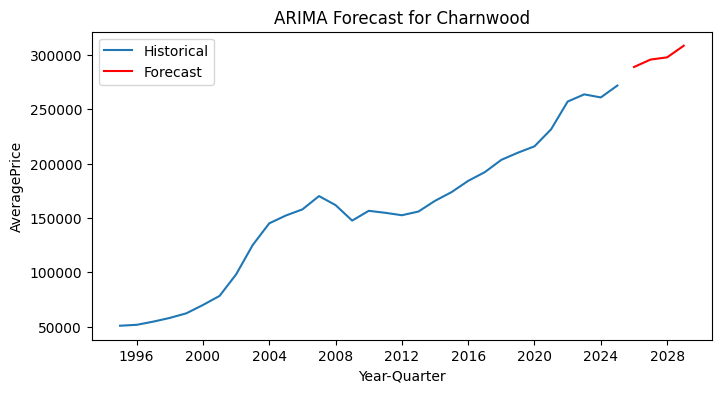

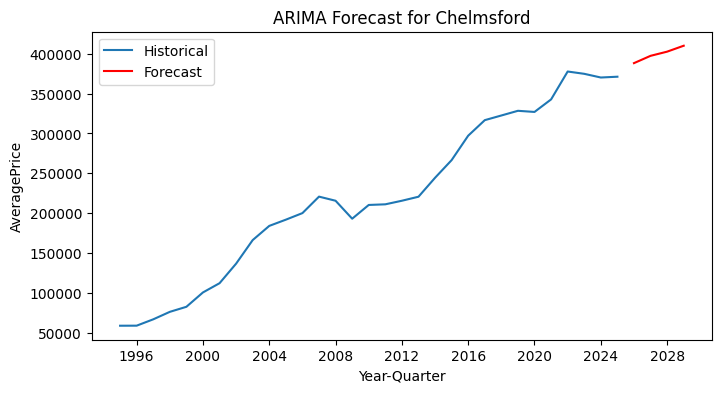

...

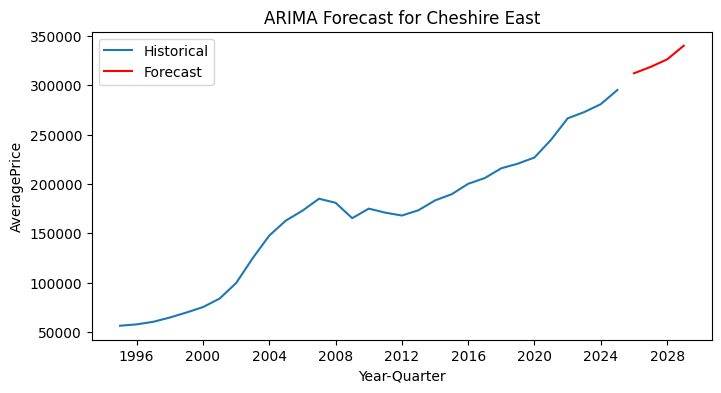

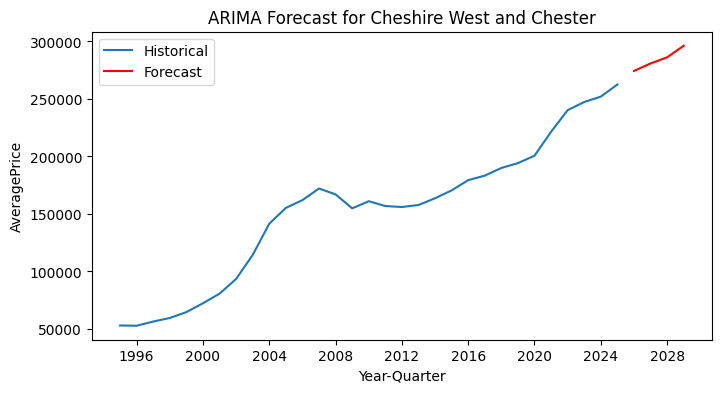

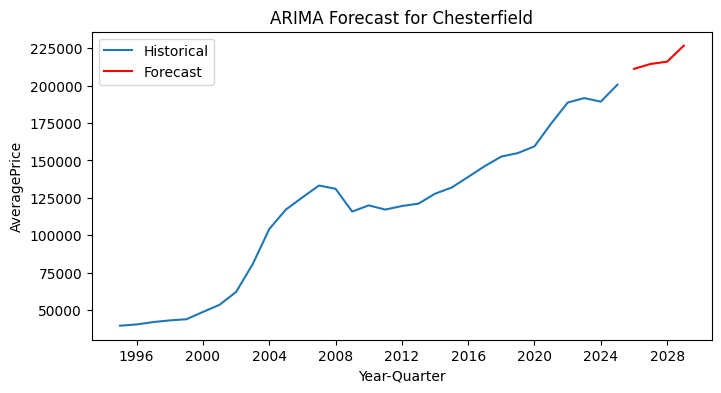

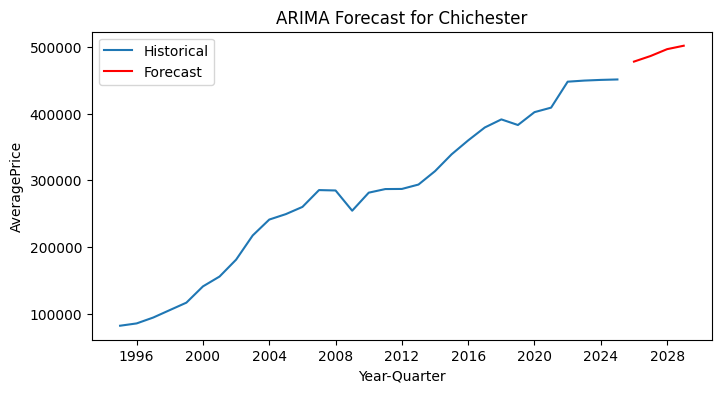

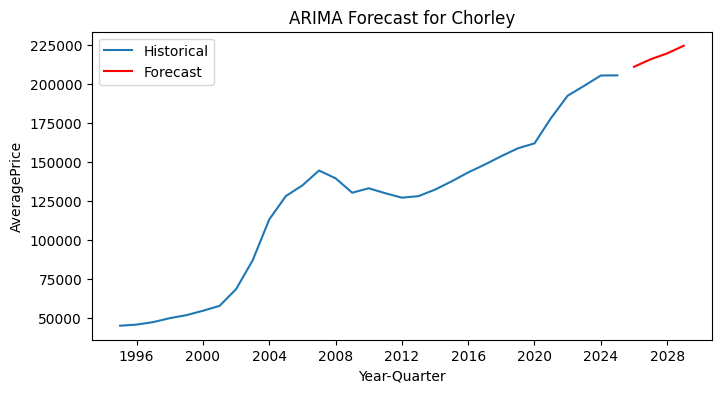

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


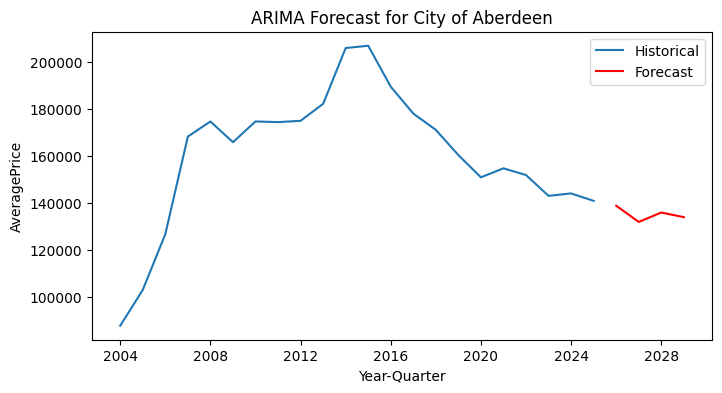

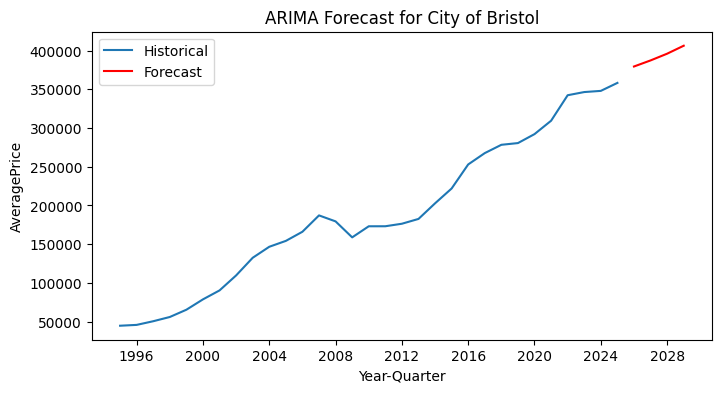

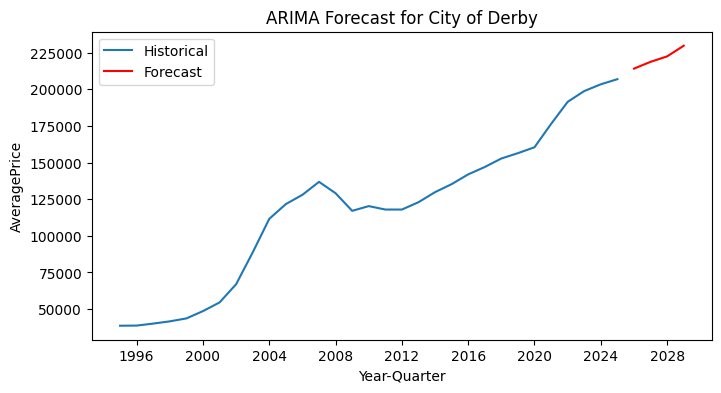

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


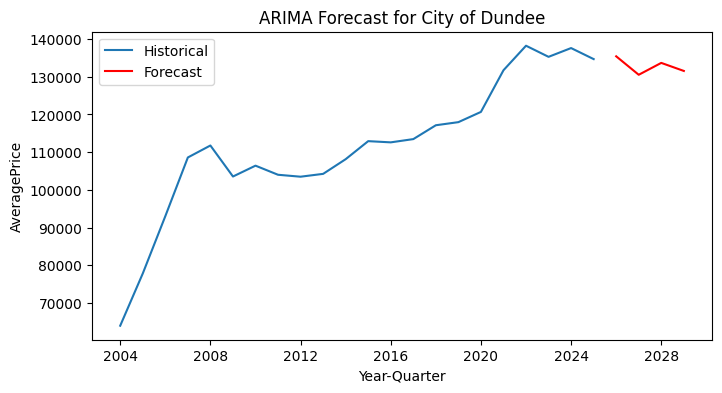

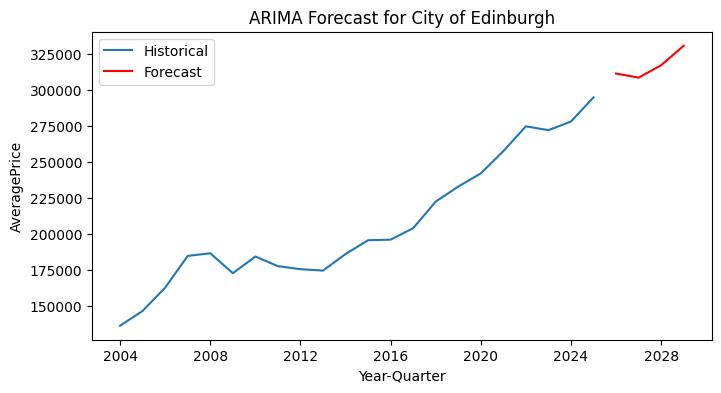

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


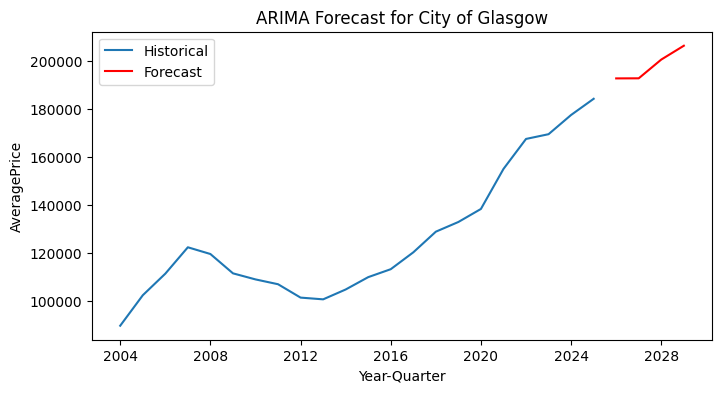

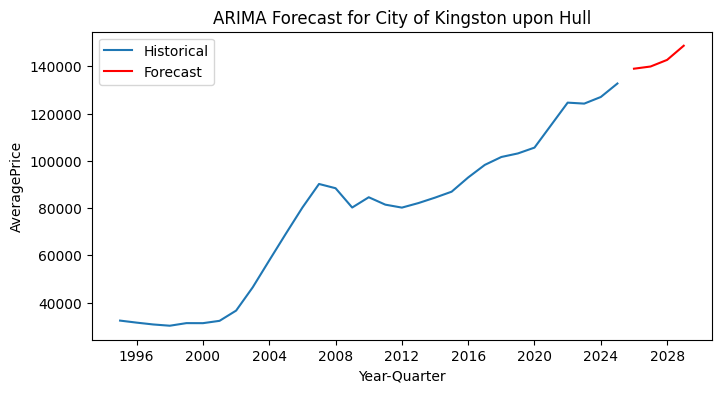

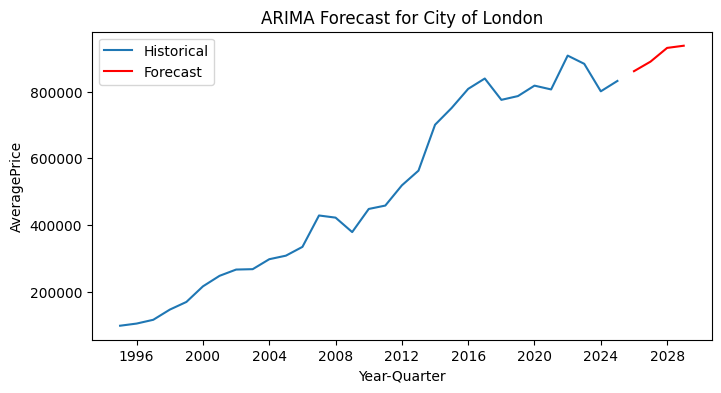

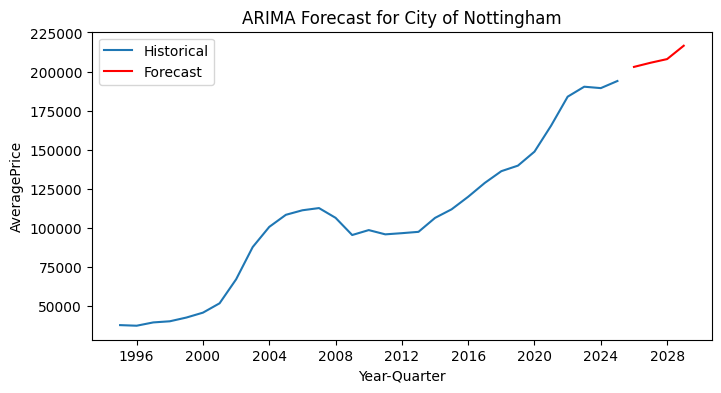

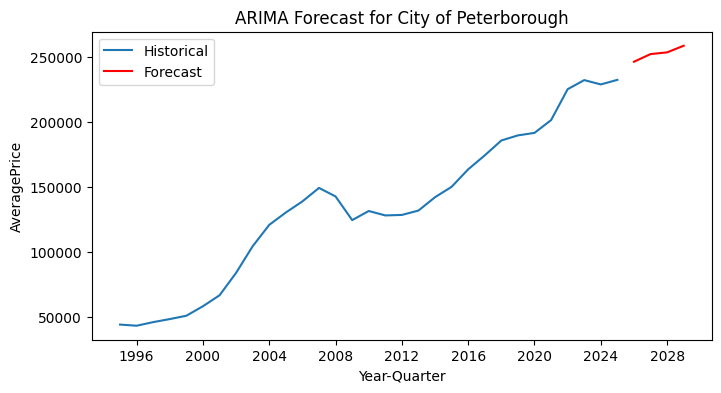

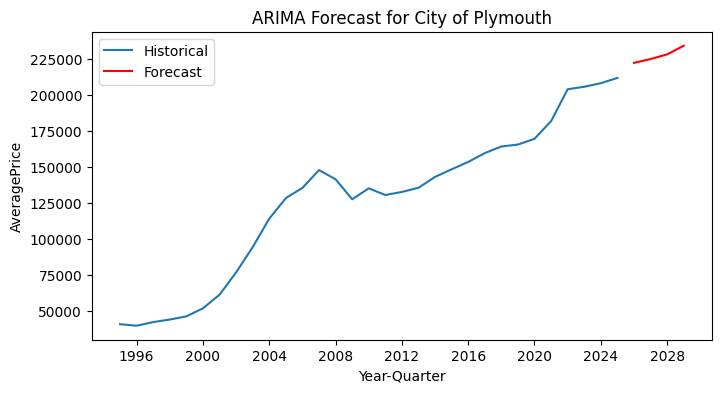

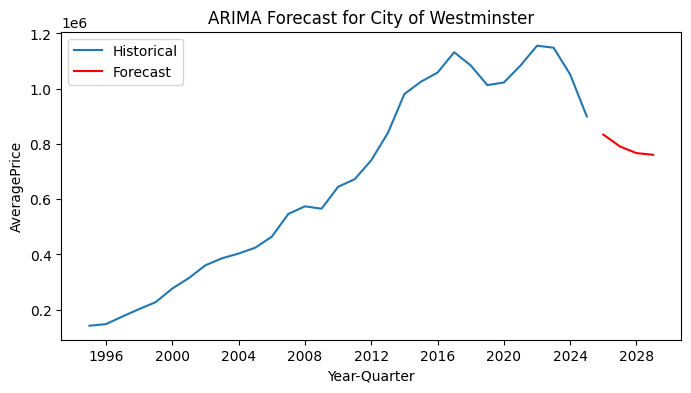

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


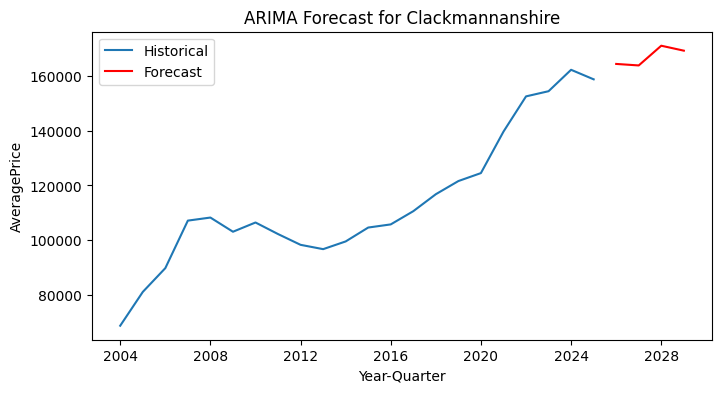

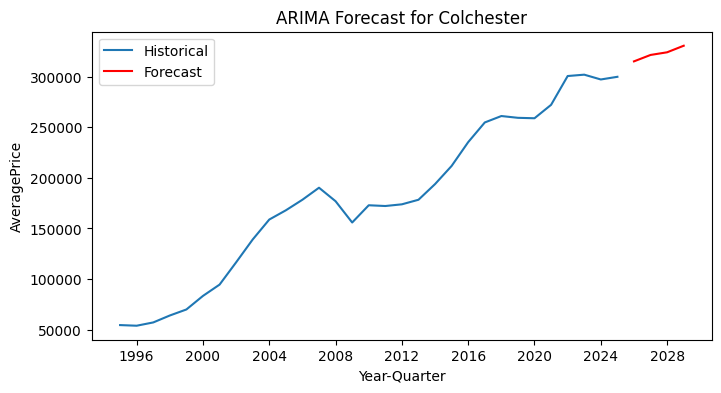

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


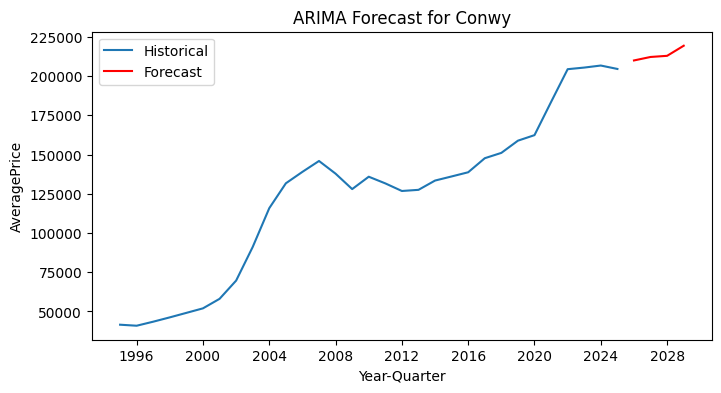

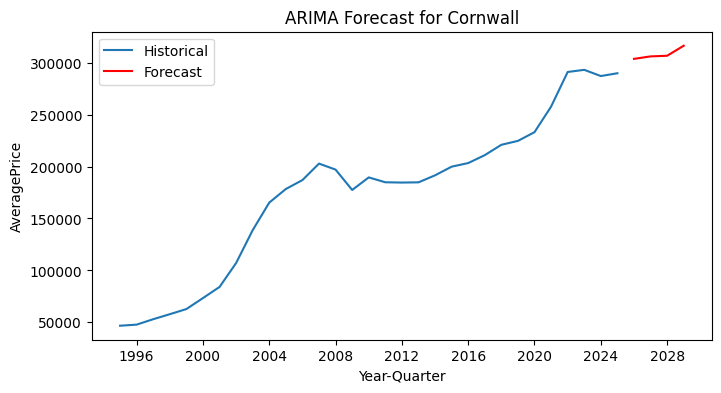

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


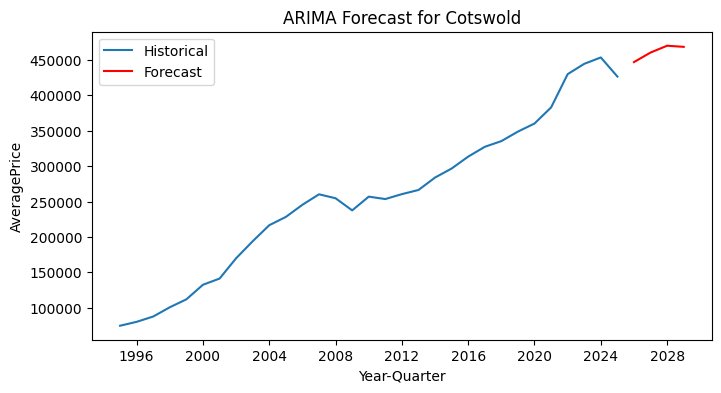

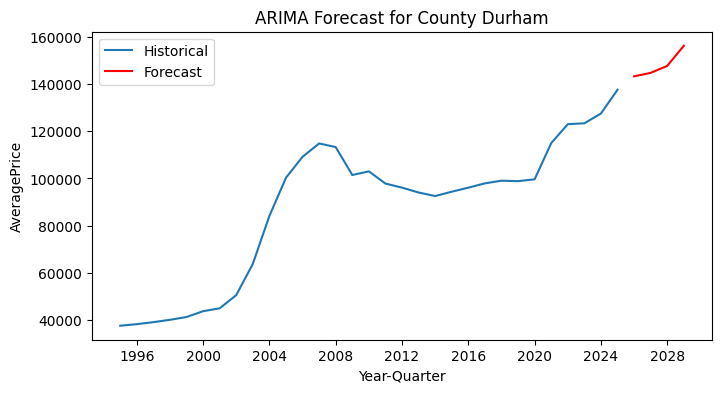

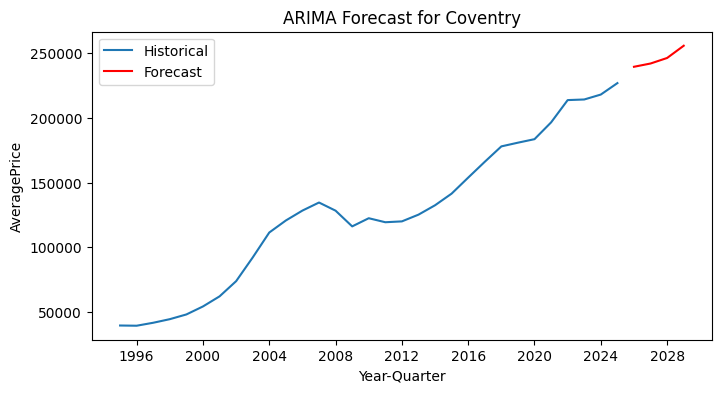

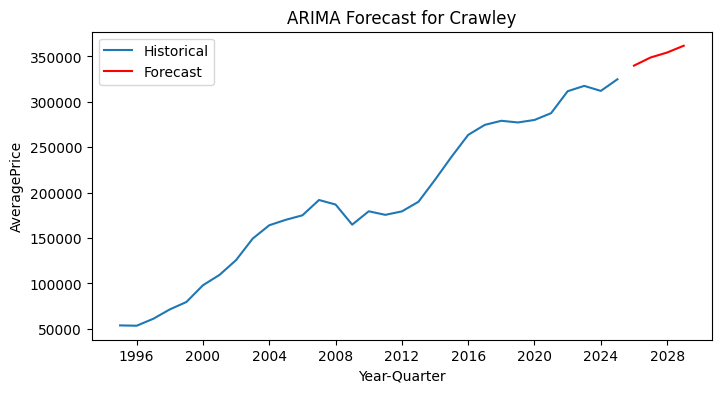

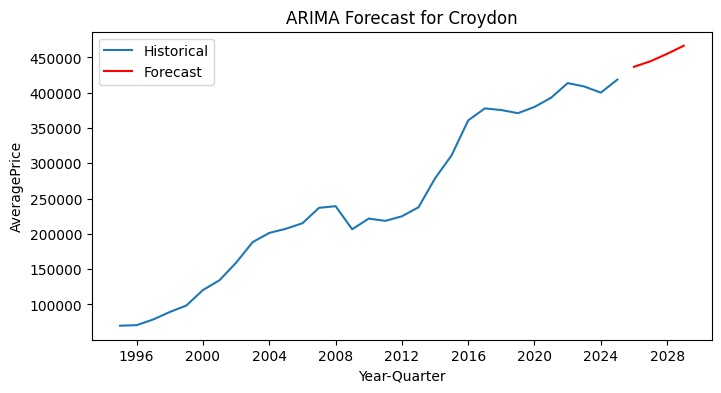

...

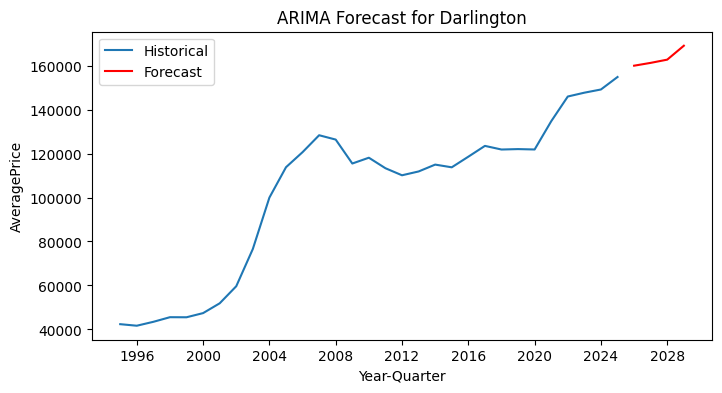

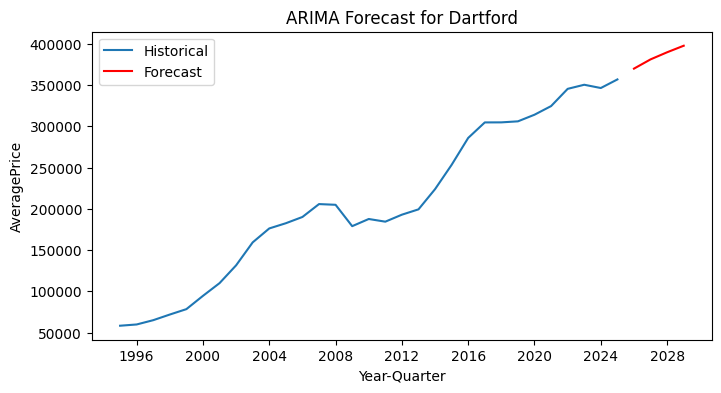

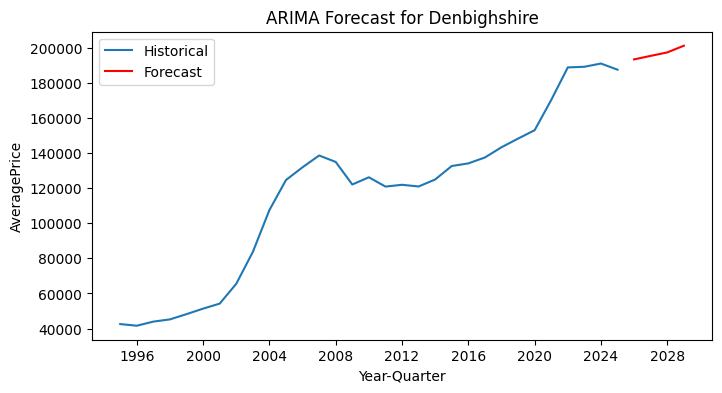

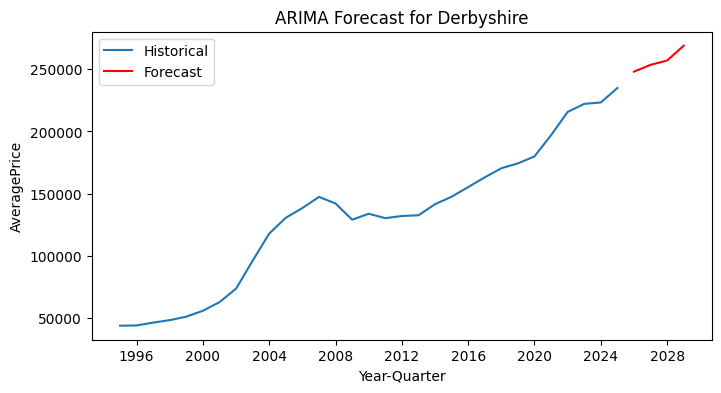

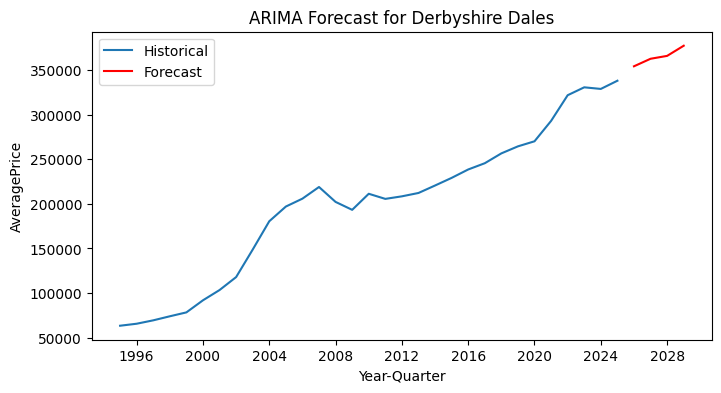

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


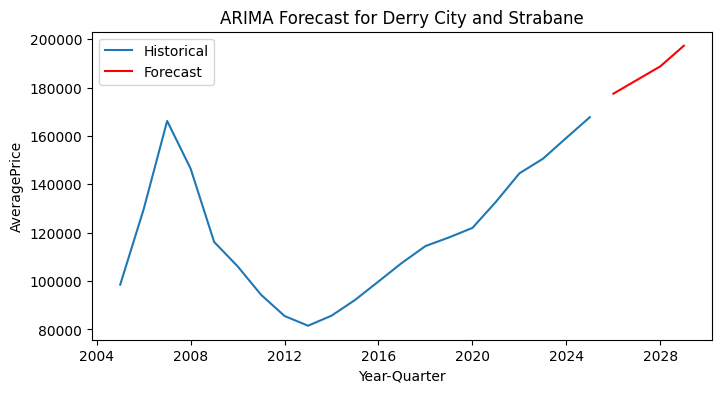

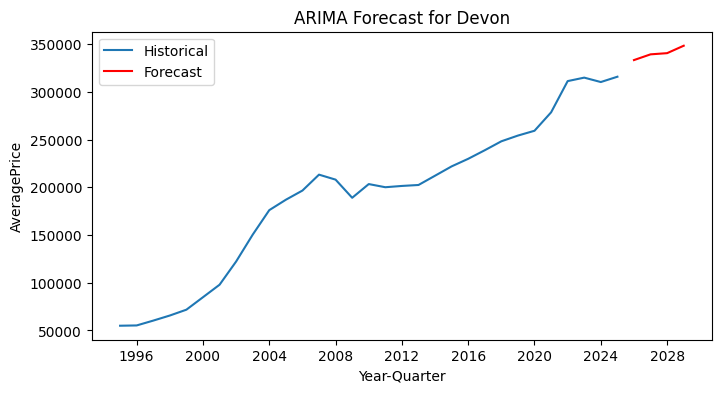

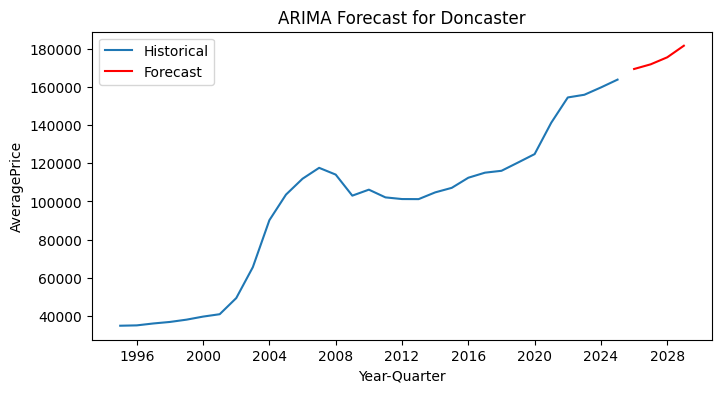

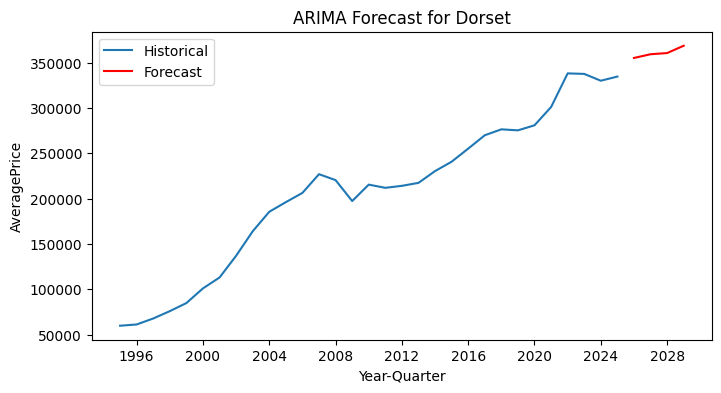

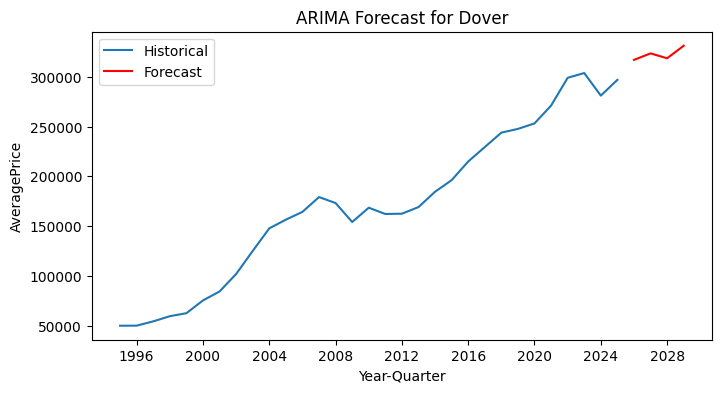

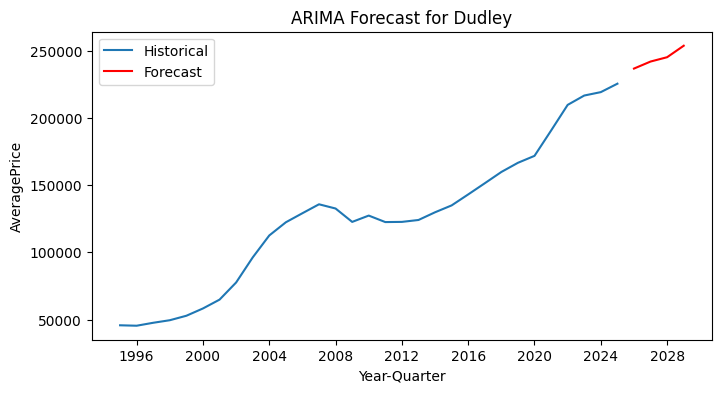

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


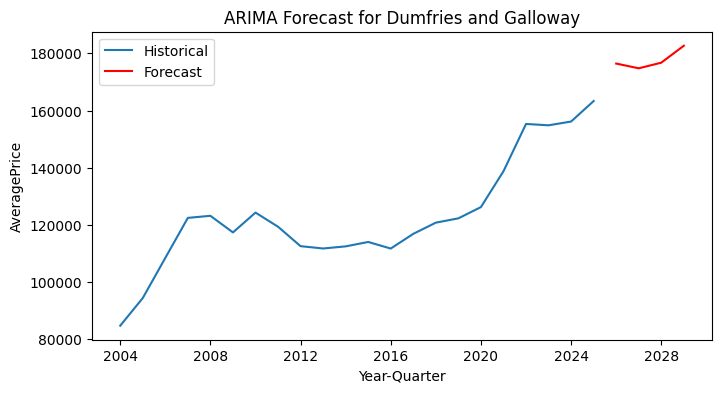

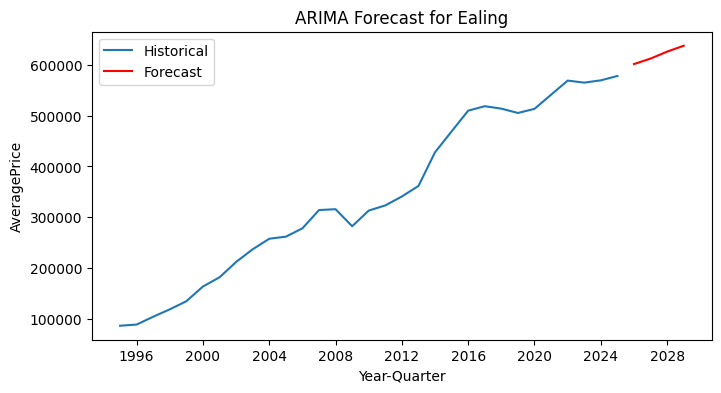

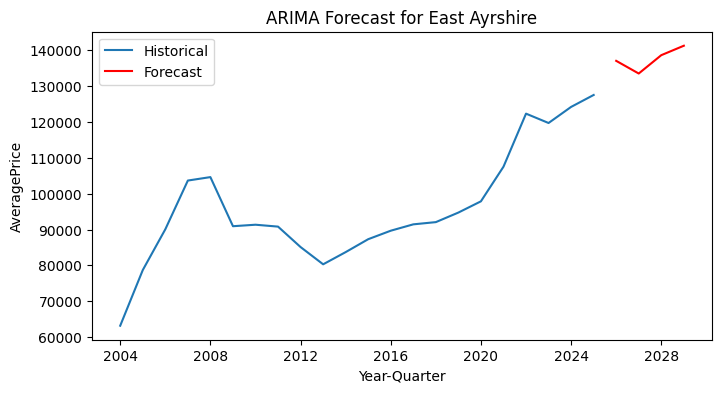

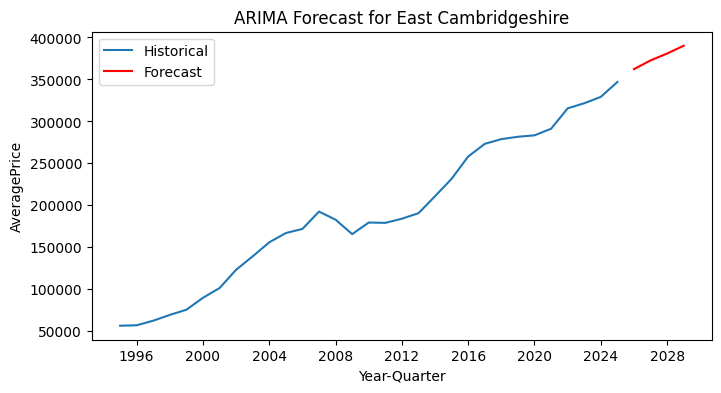

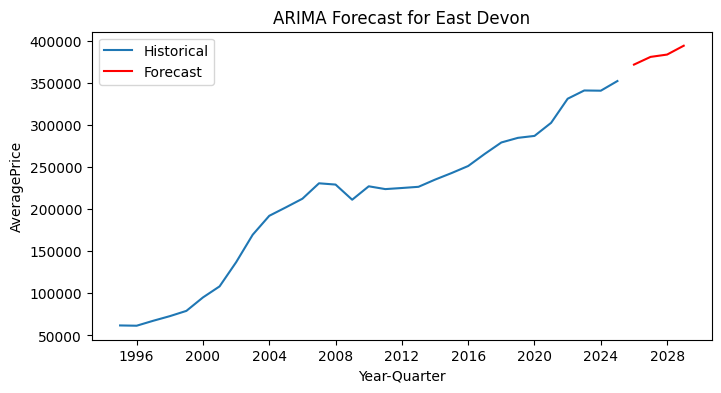

...

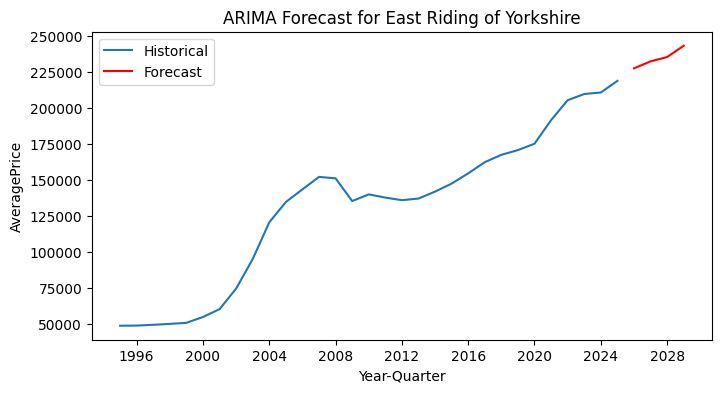

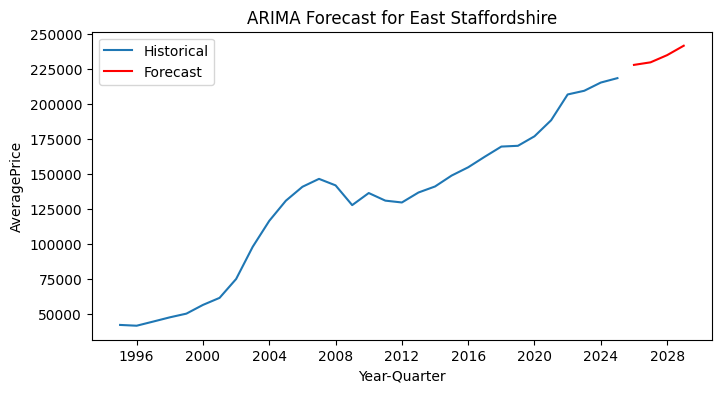

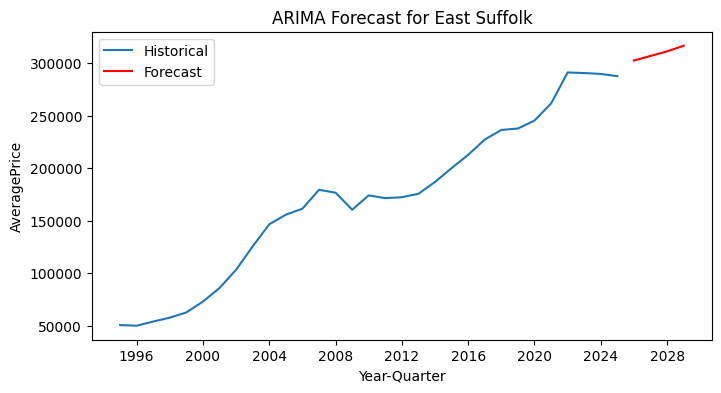

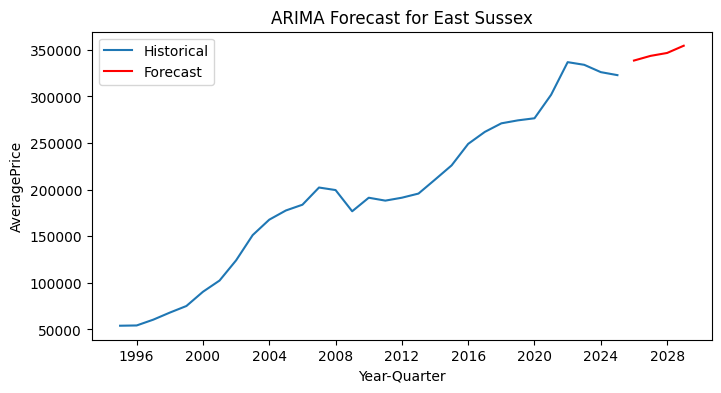

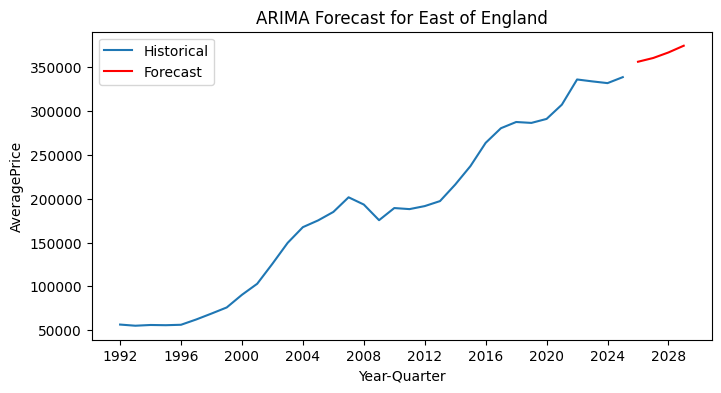

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


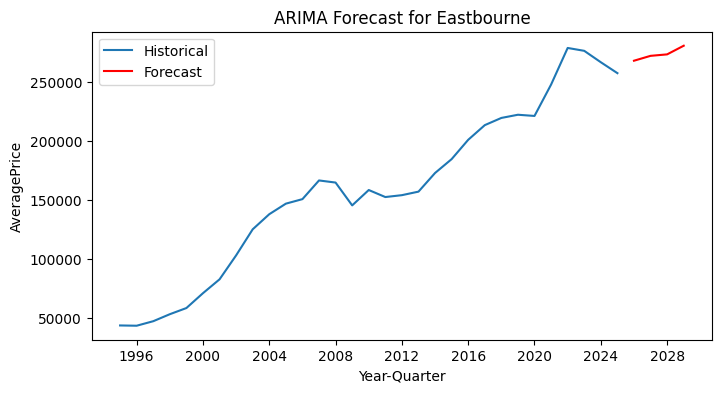

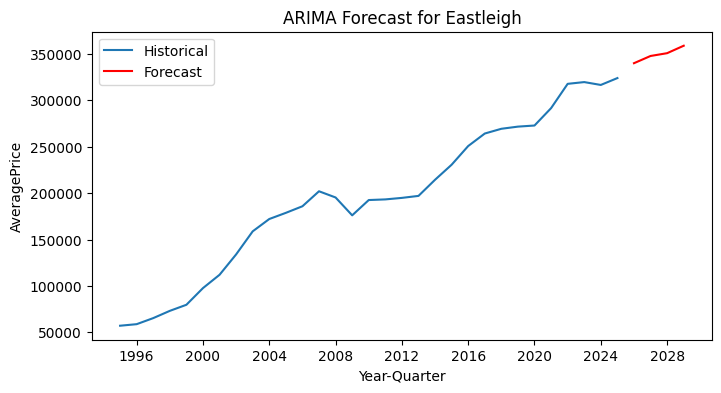

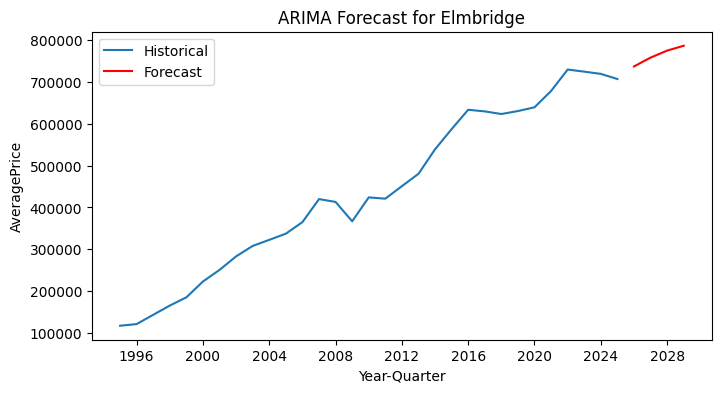

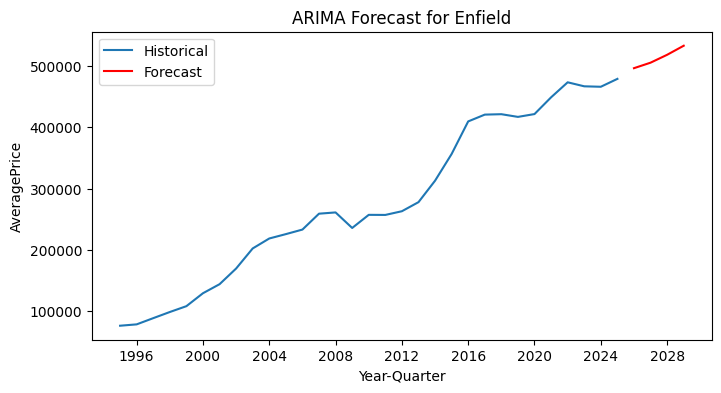

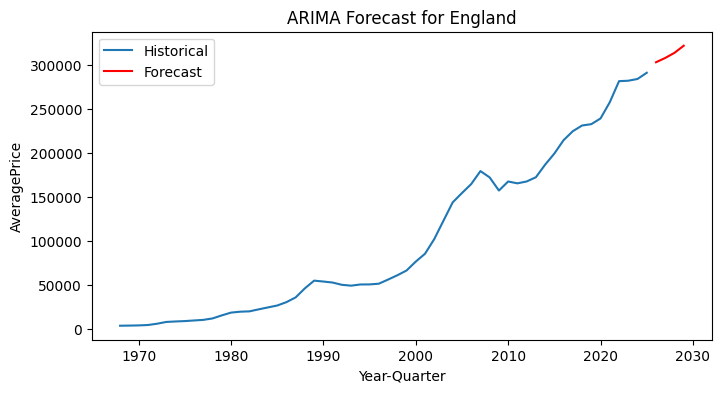

...

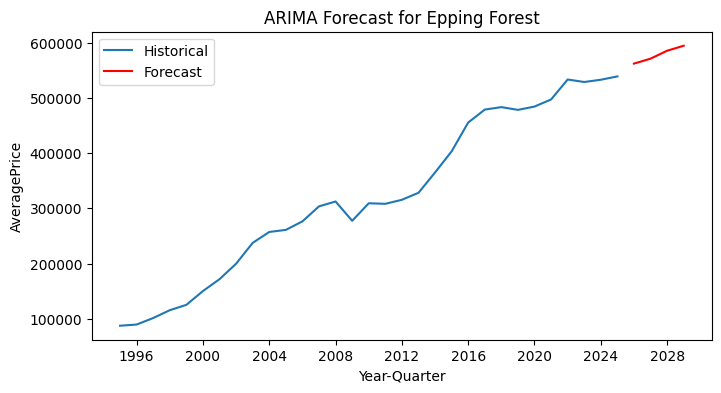

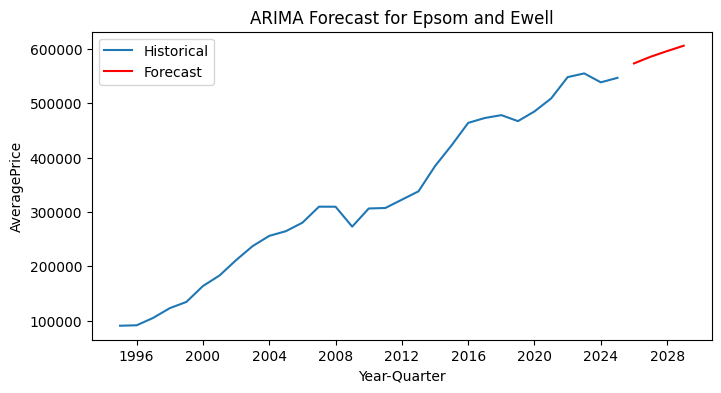

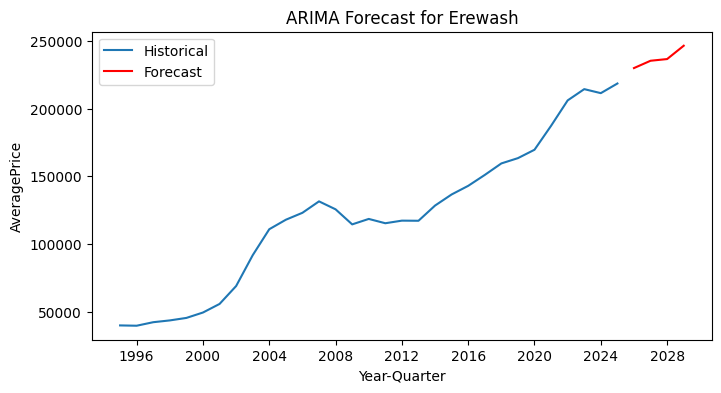

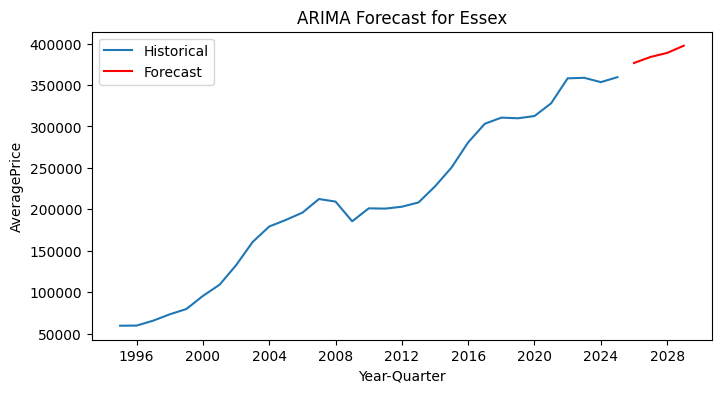

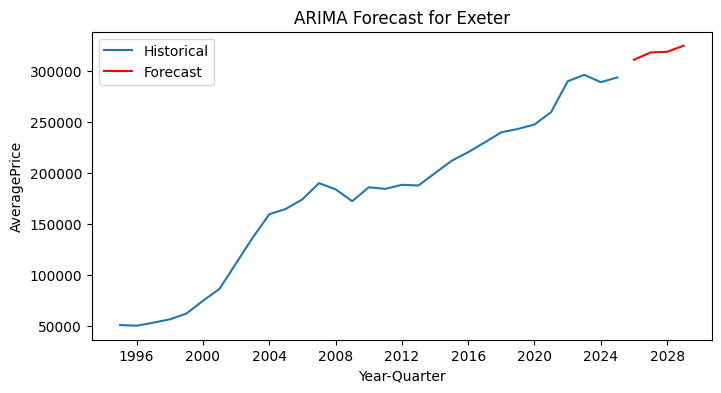

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


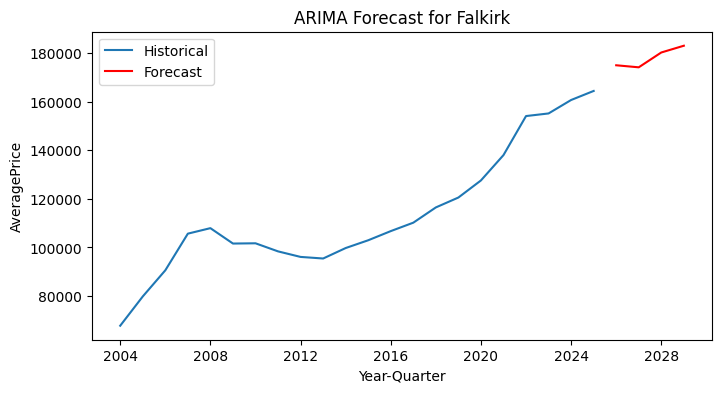

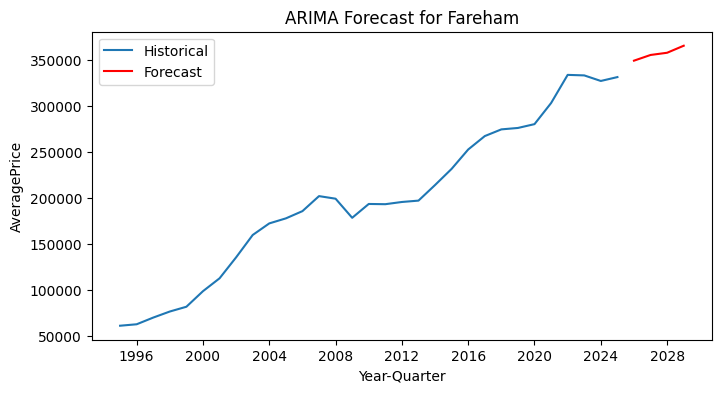

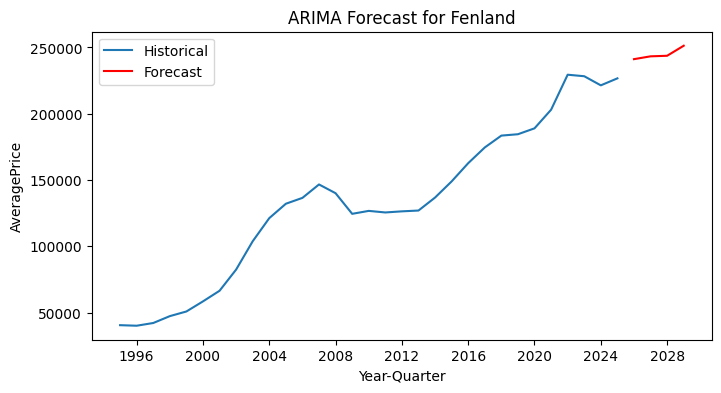

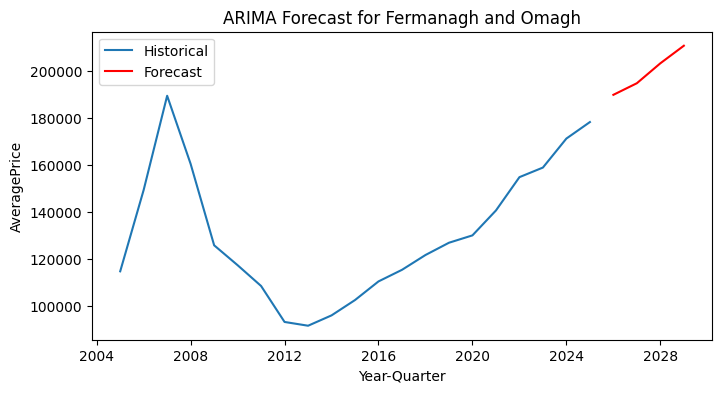

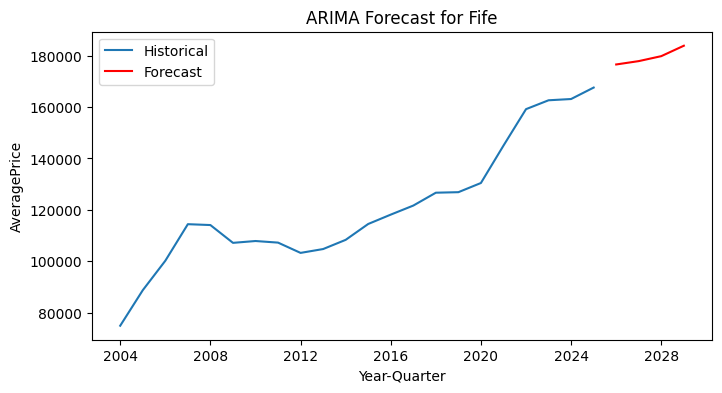

...

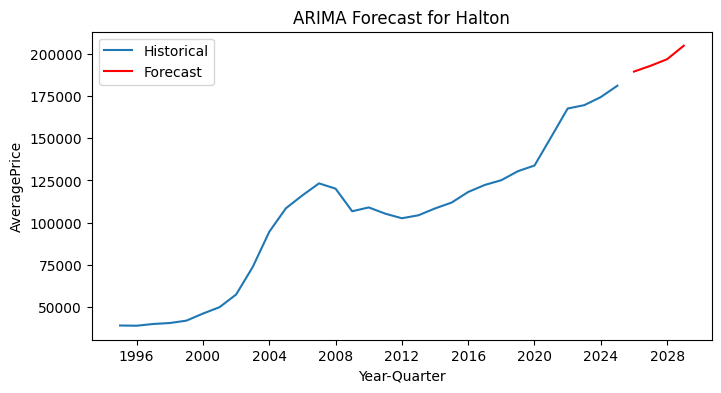

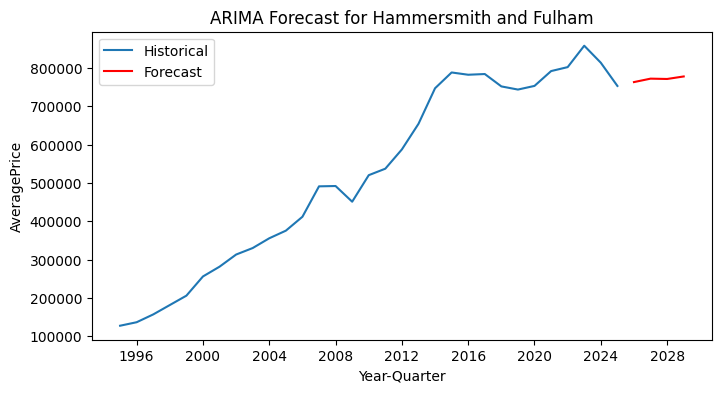

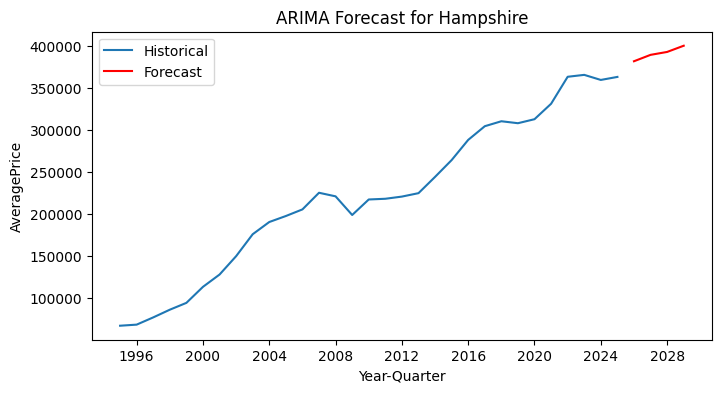

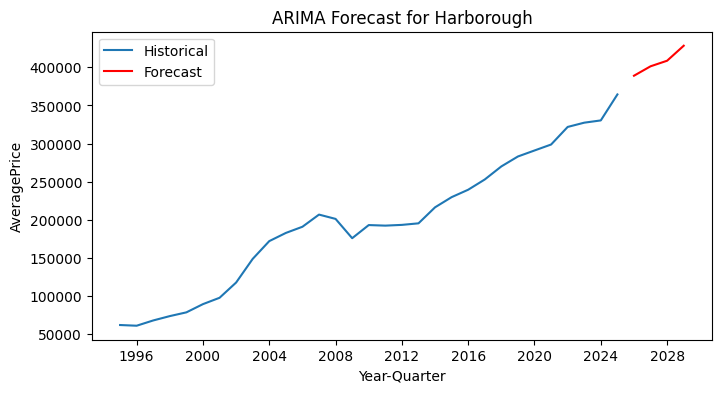

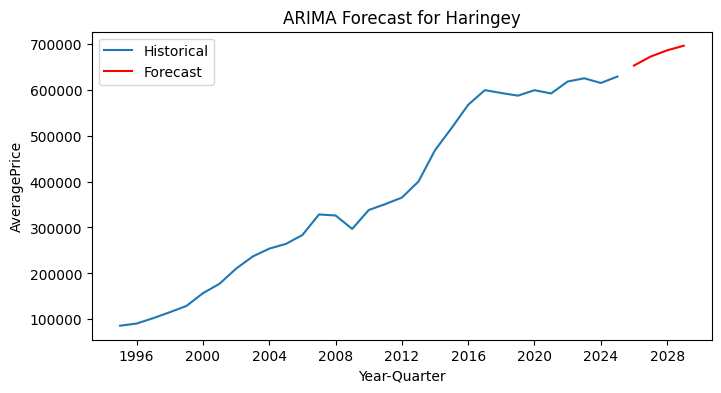

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


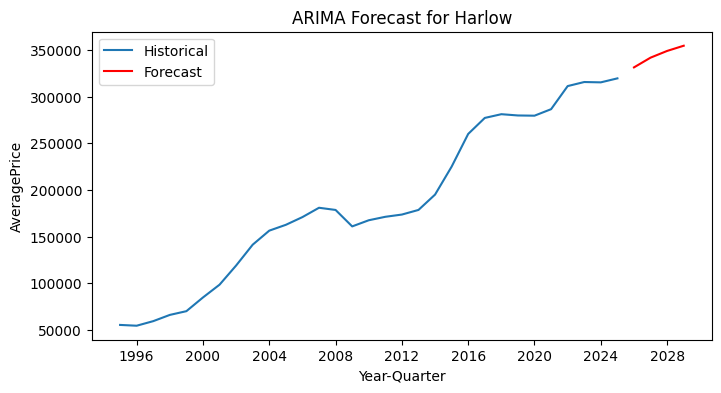

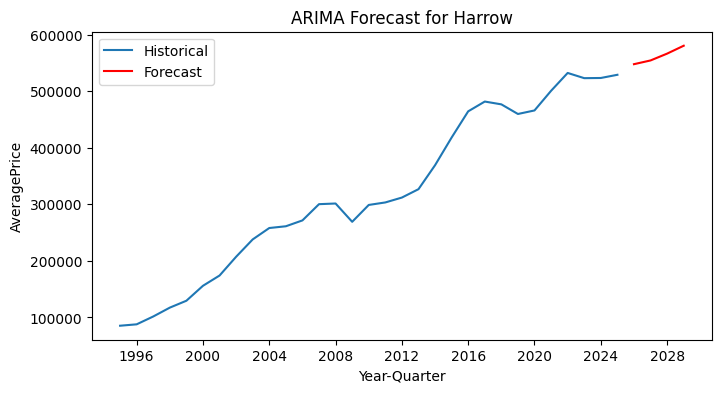

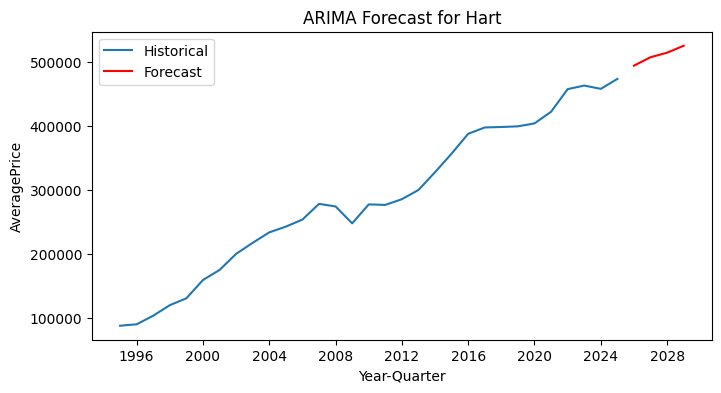

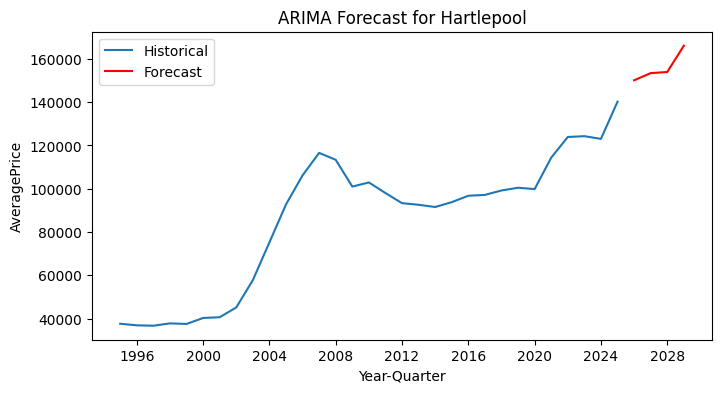

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


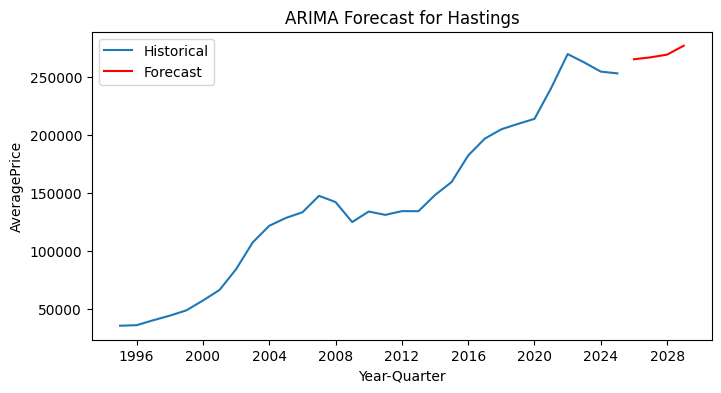

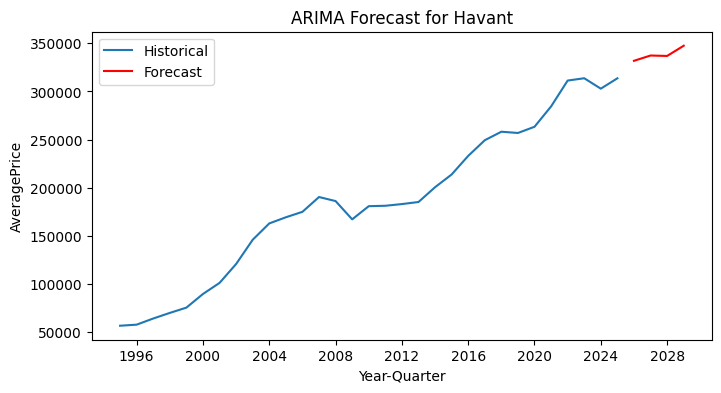

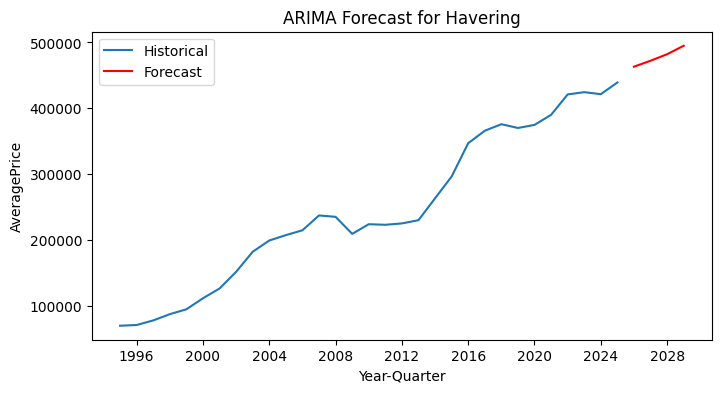

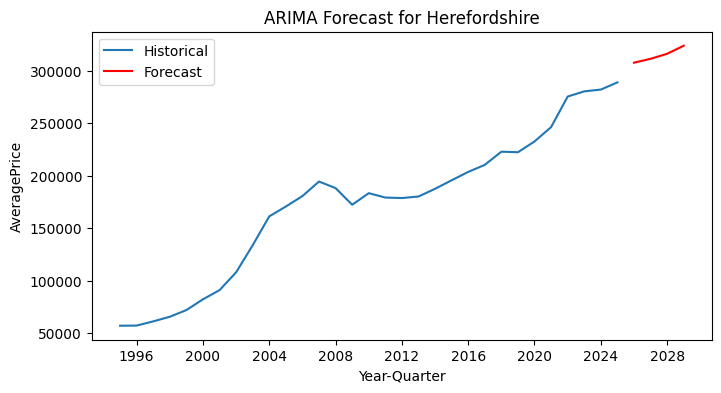

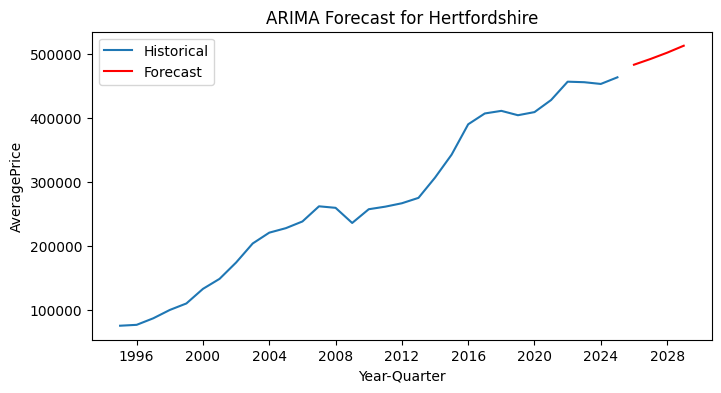

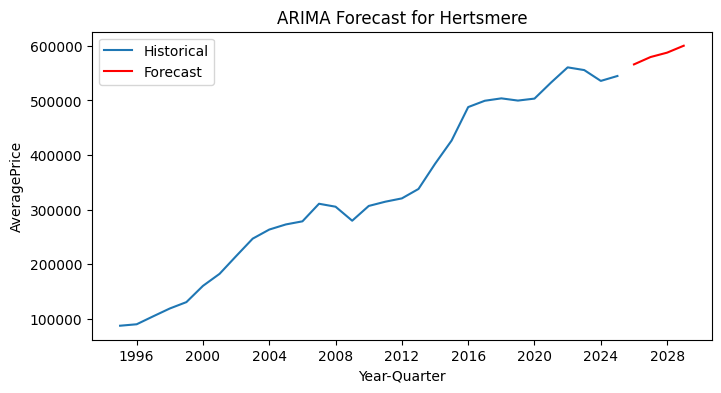

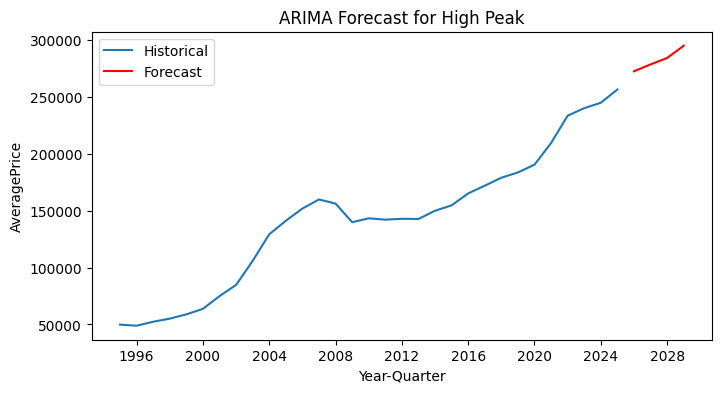

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


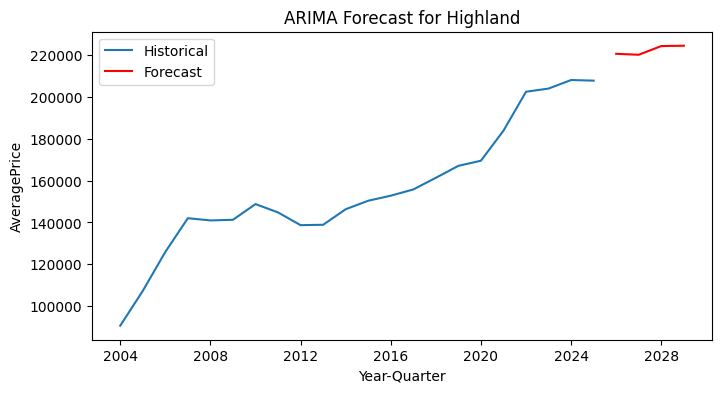

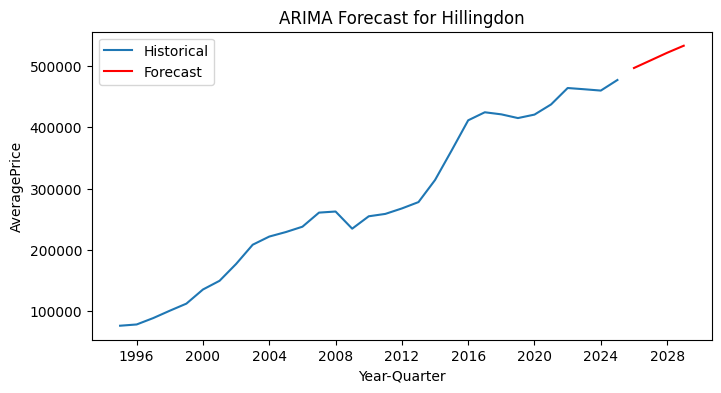

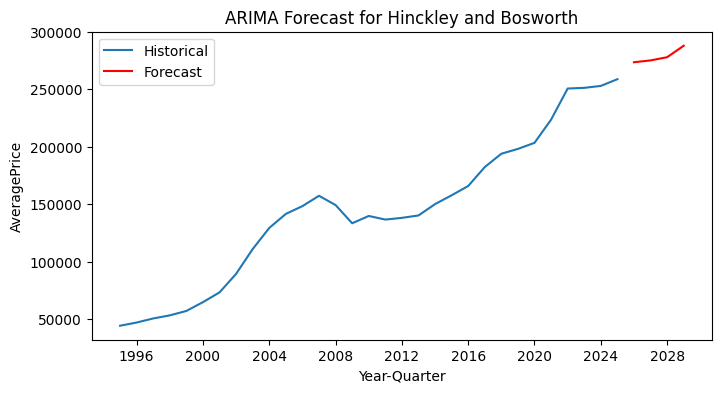

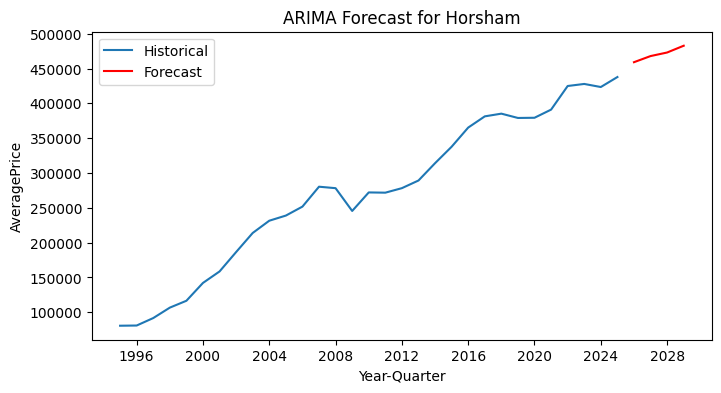

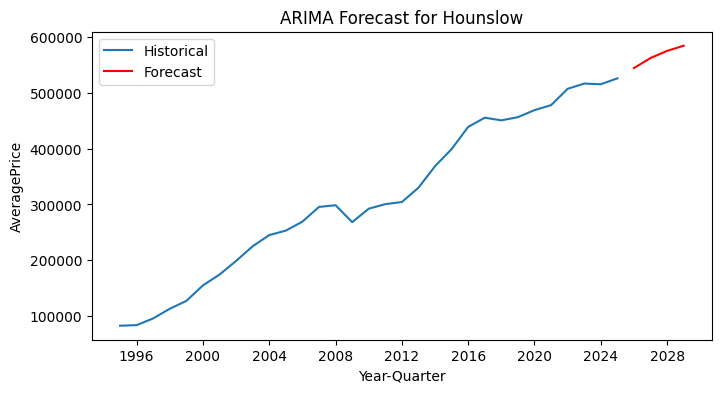

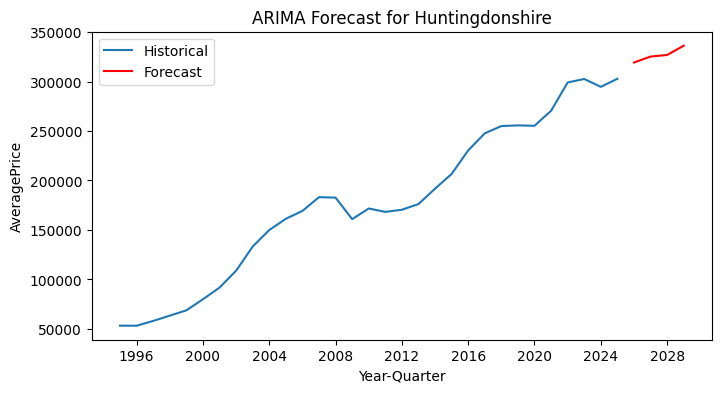

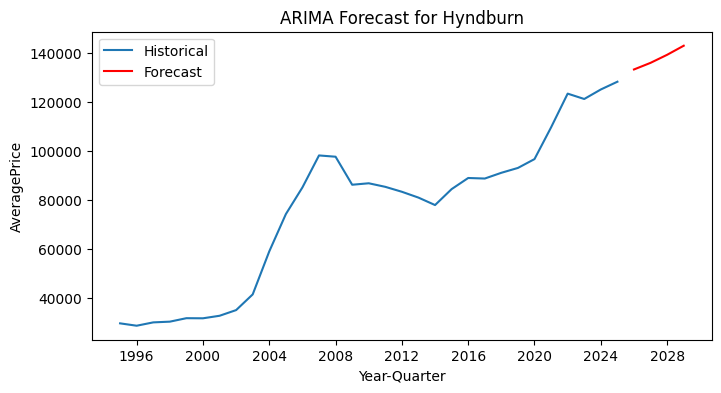

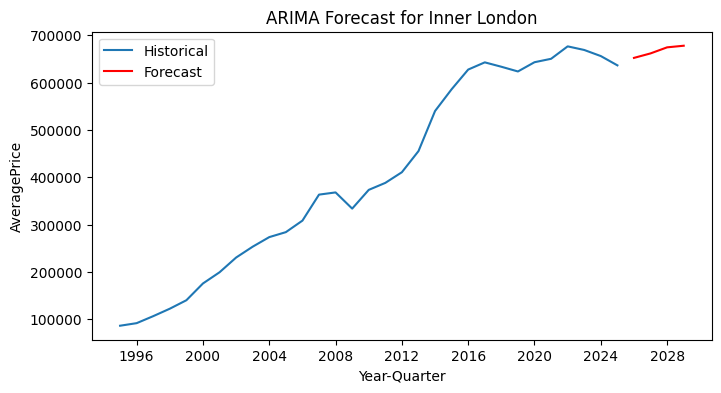

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


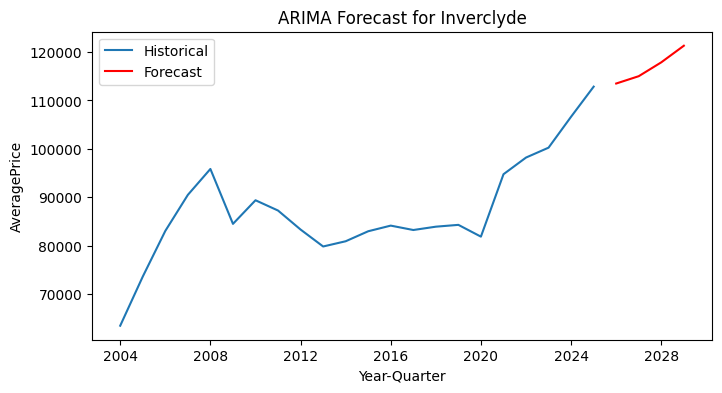

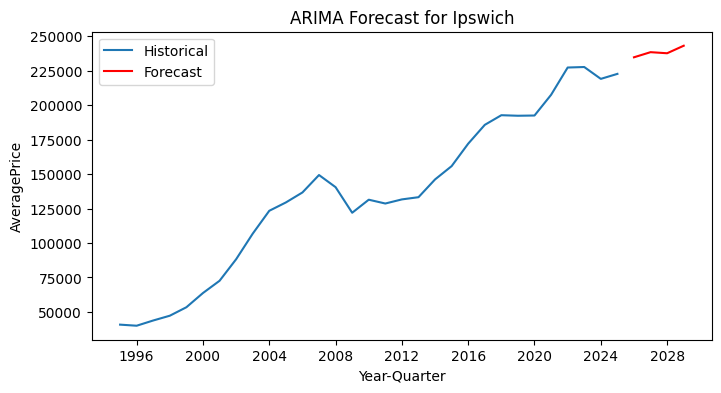

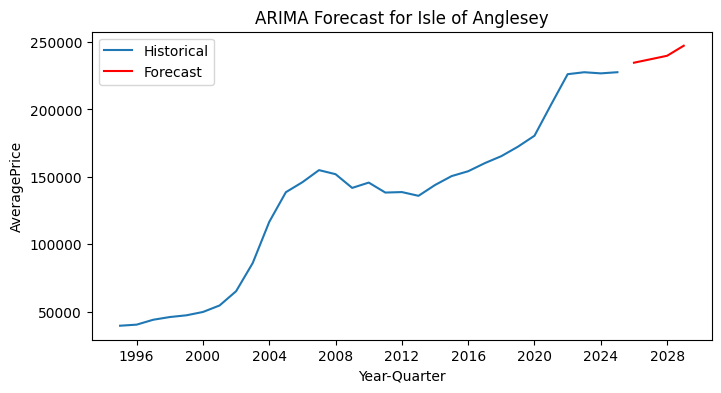

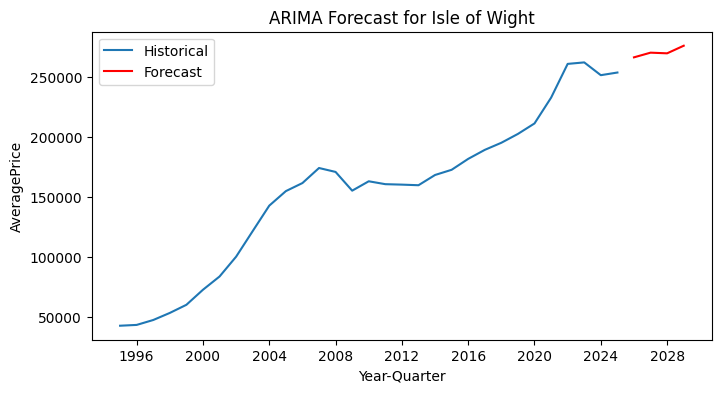

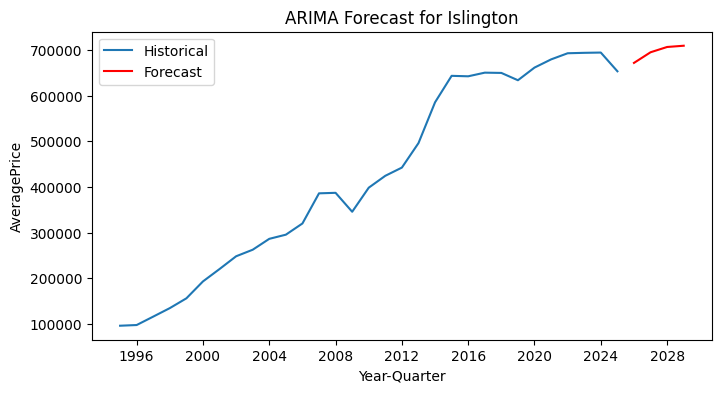

...

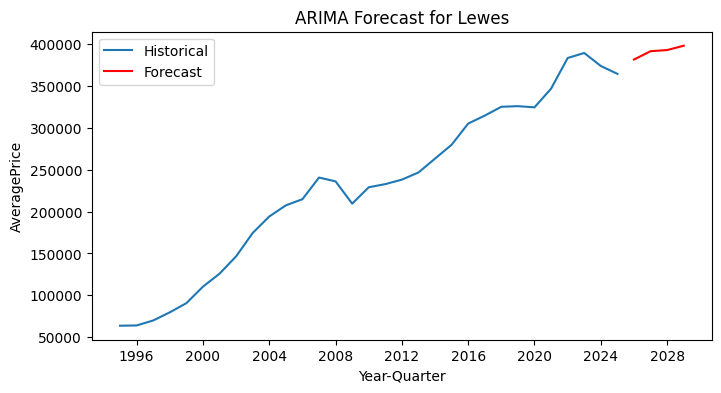

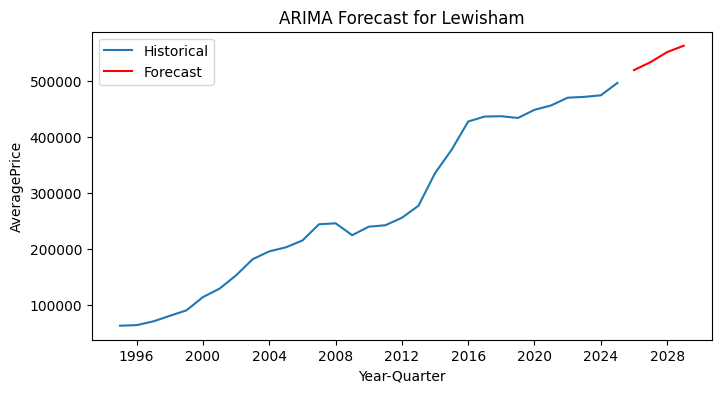

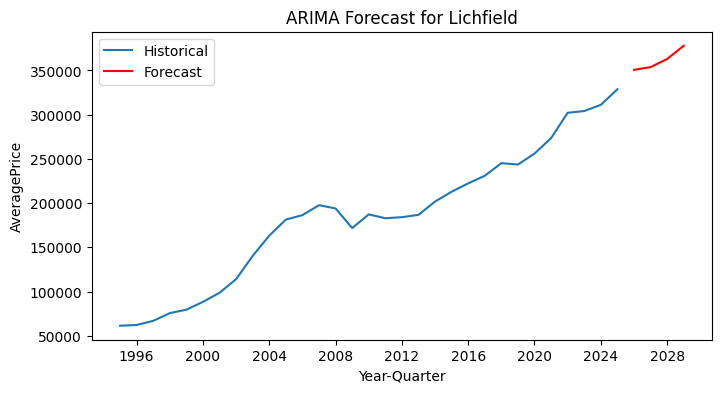

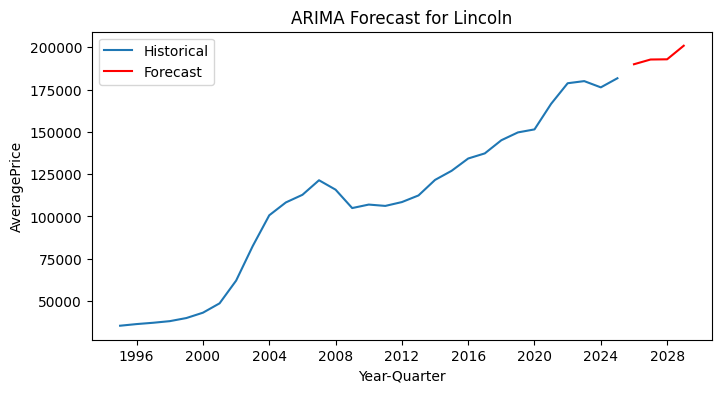

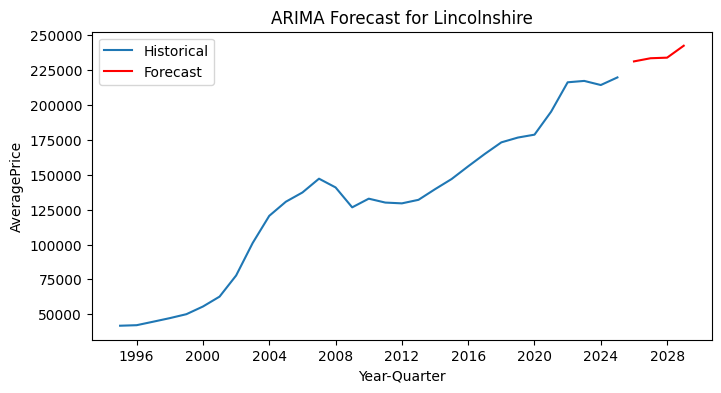

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


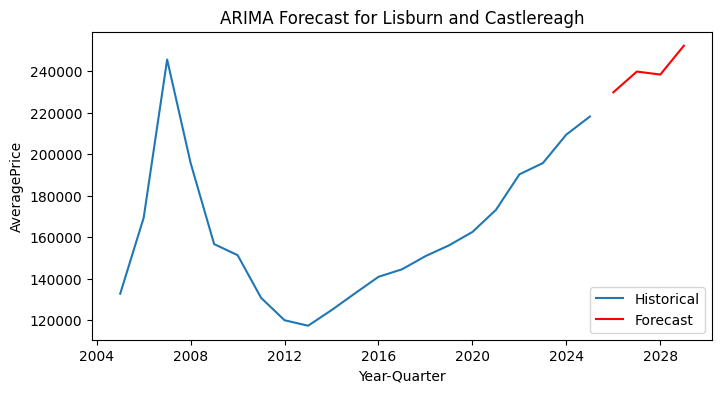

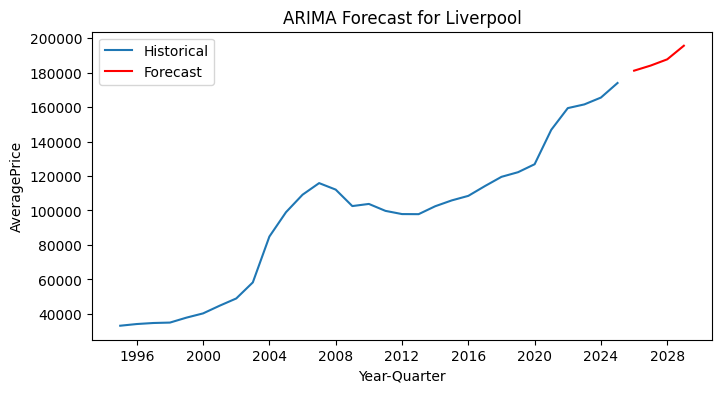

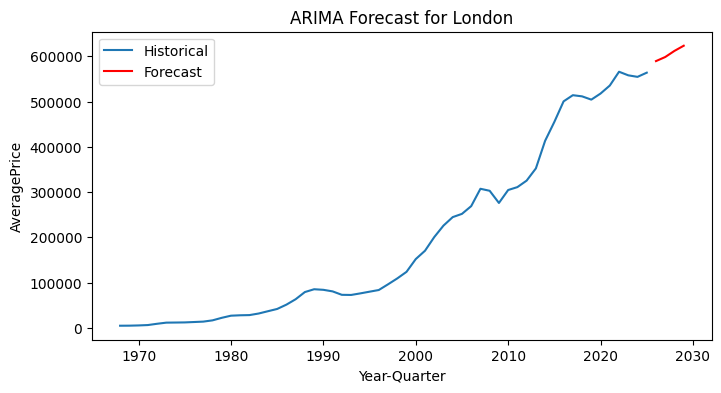

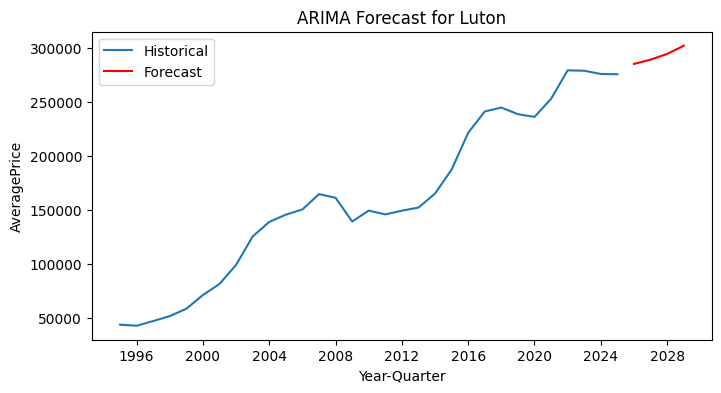

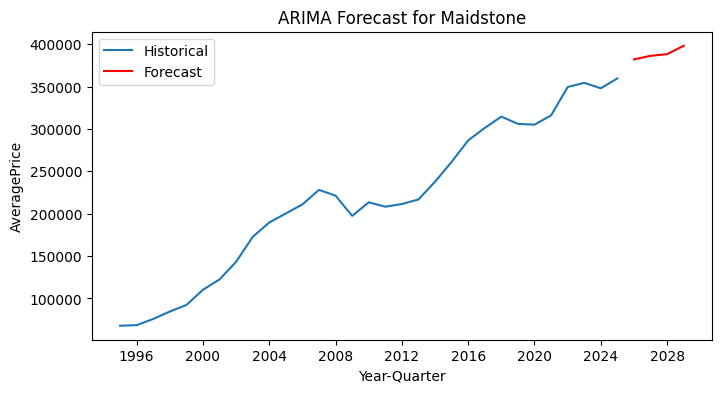

...

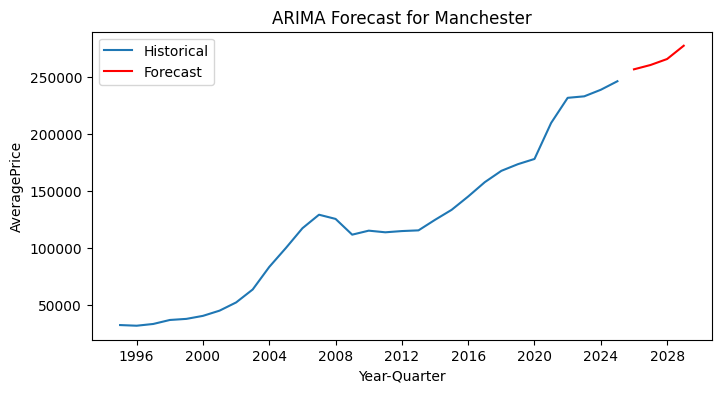

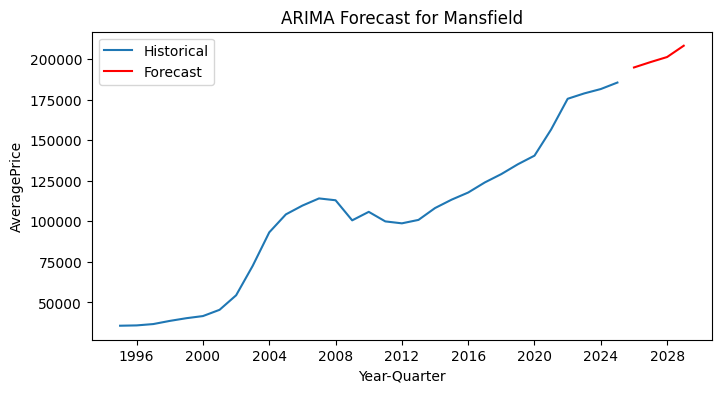

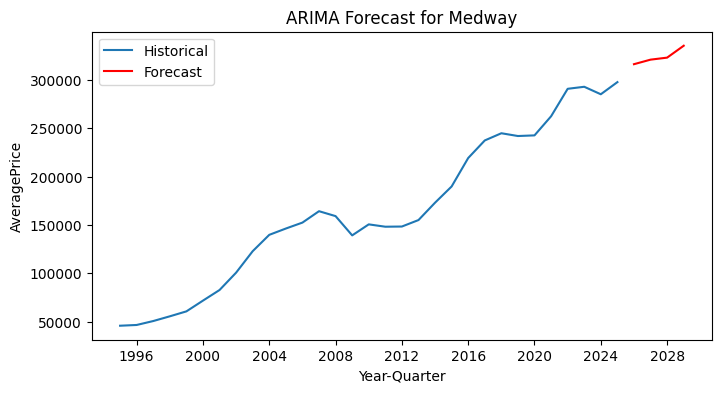

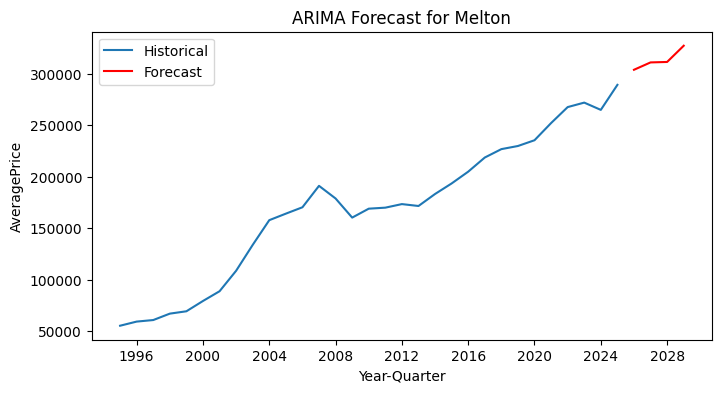

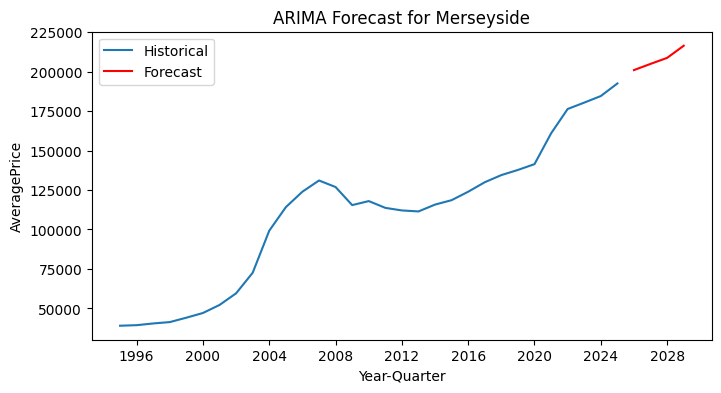

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


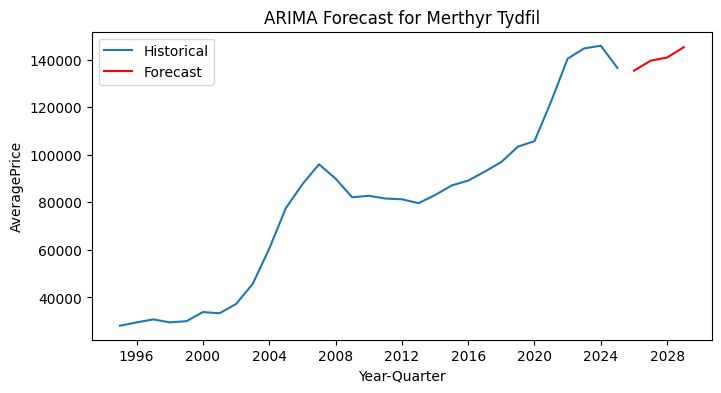

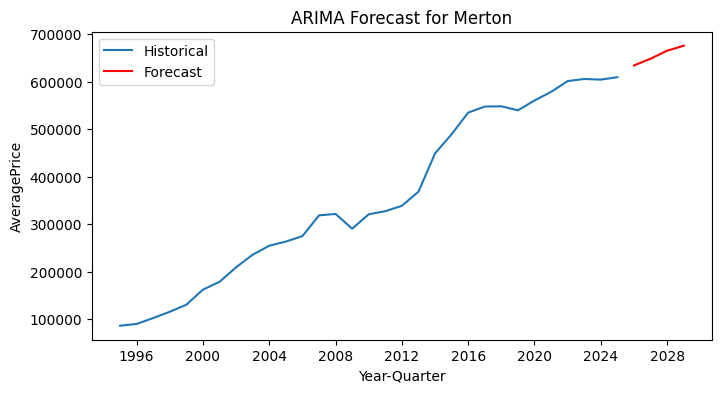

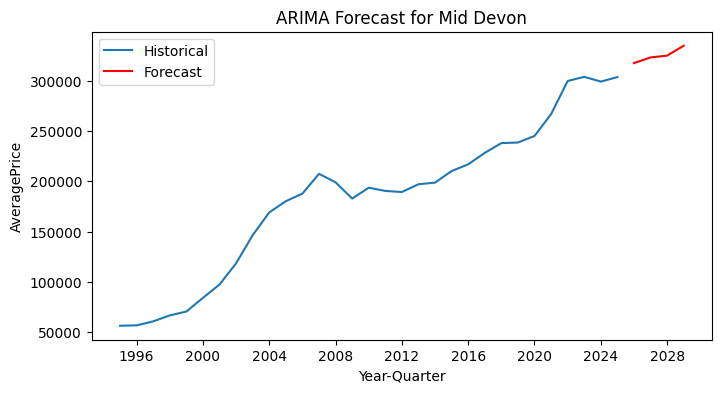

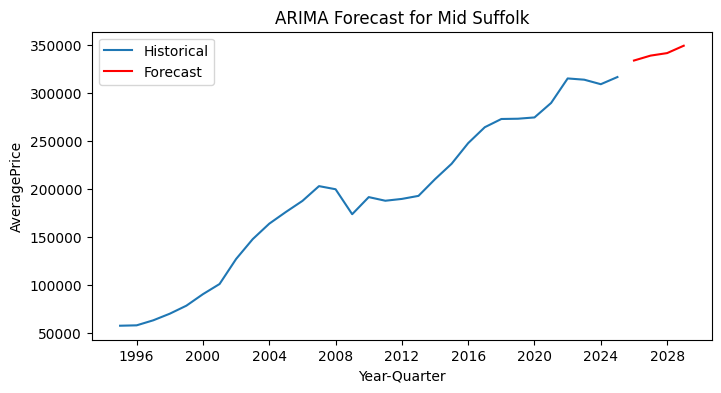

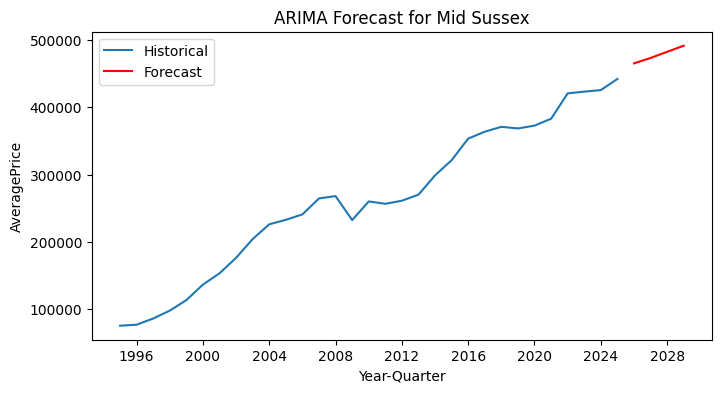

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


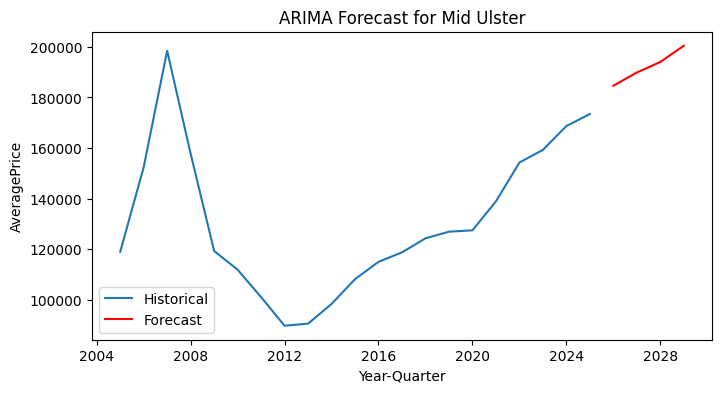

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


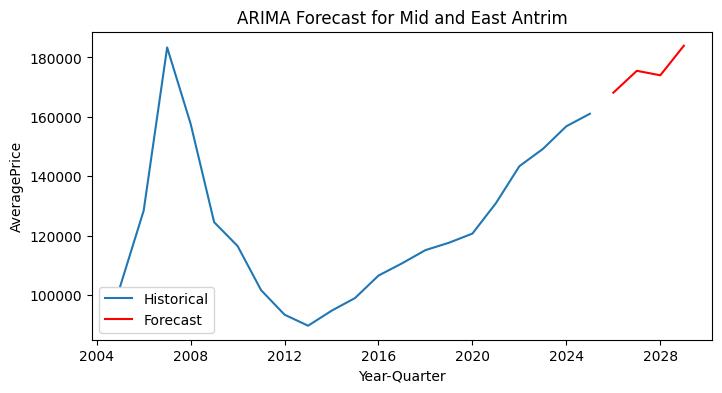

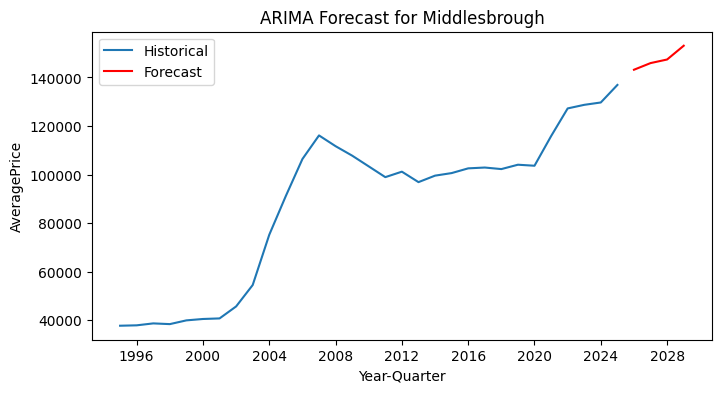

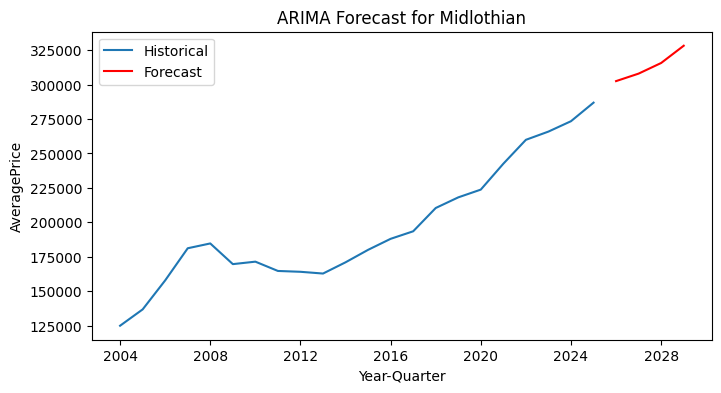

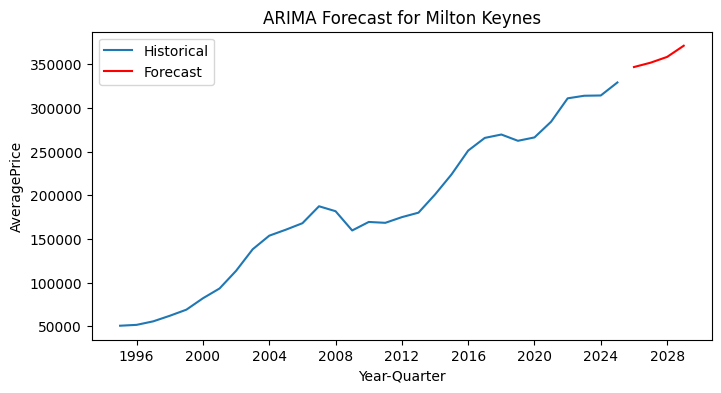

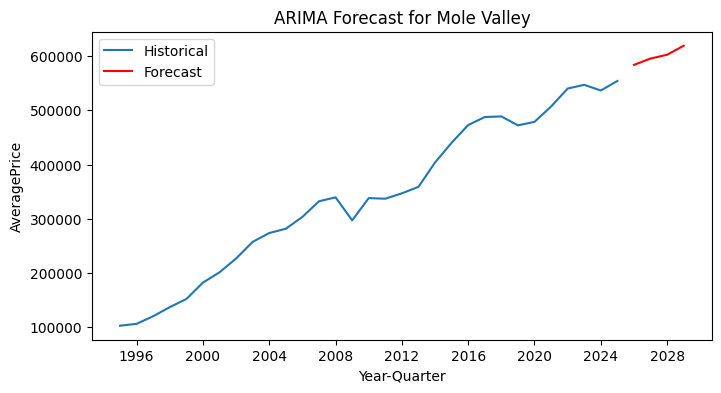

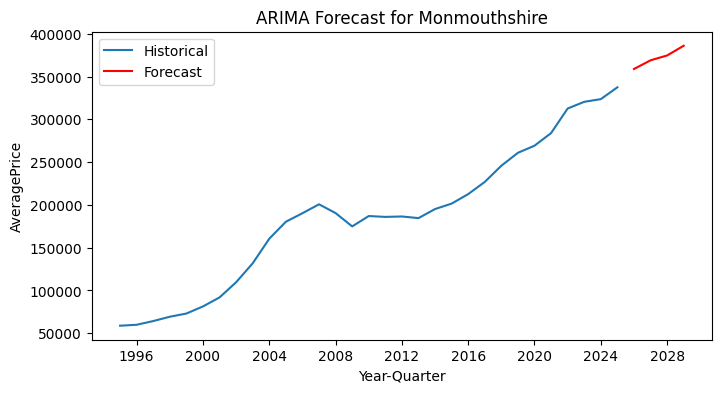

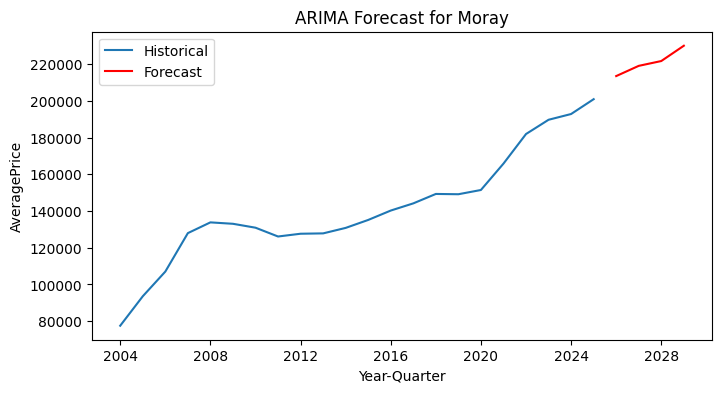

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


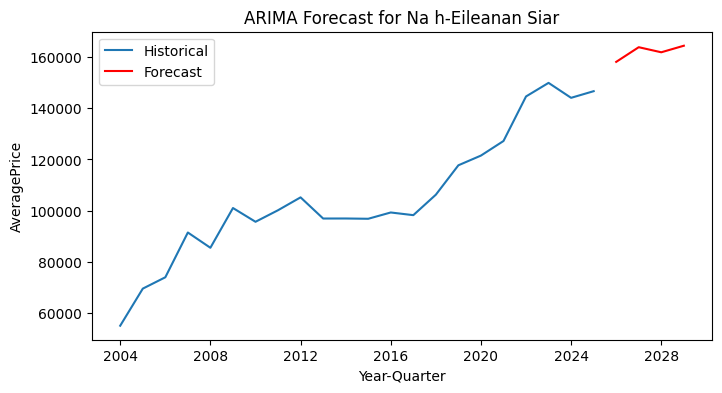

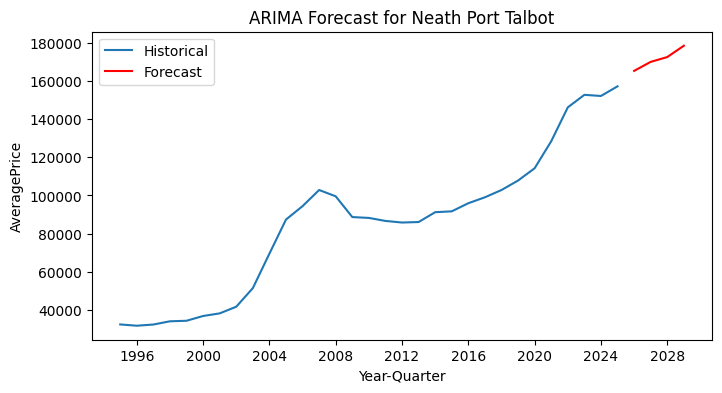

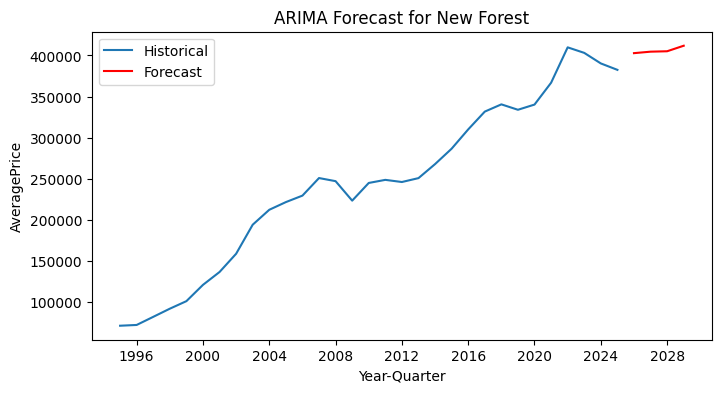

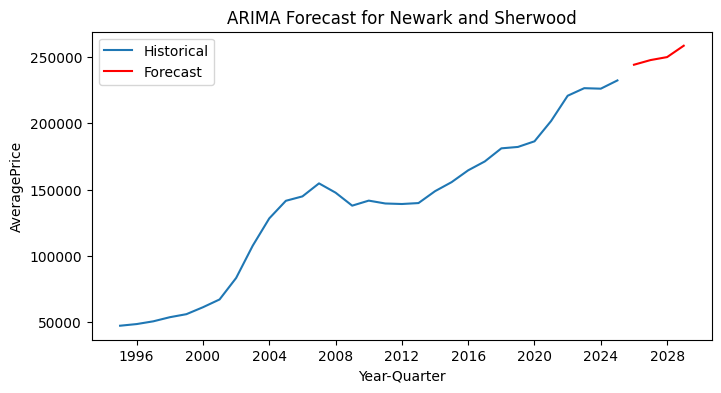

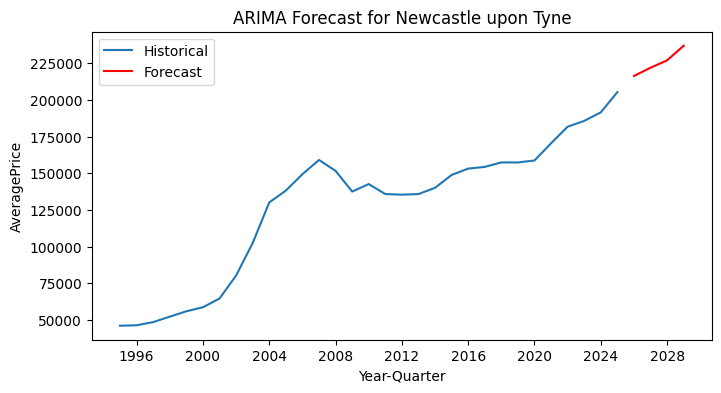

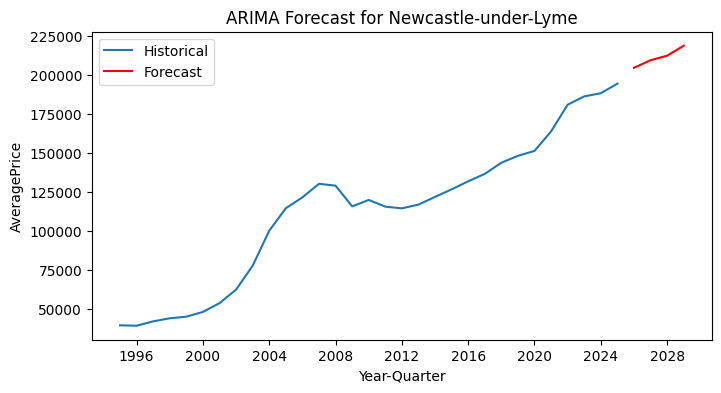

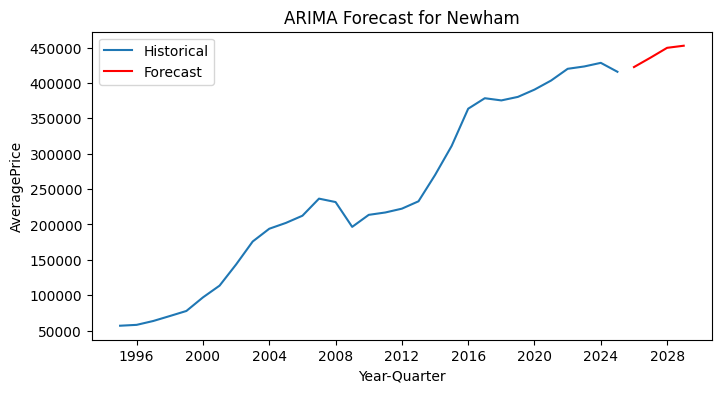

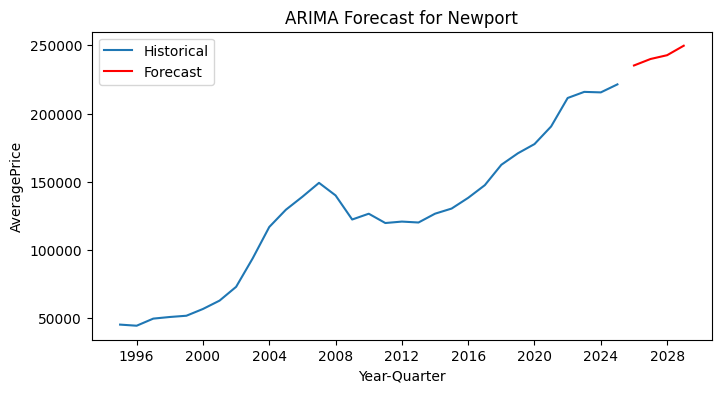

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


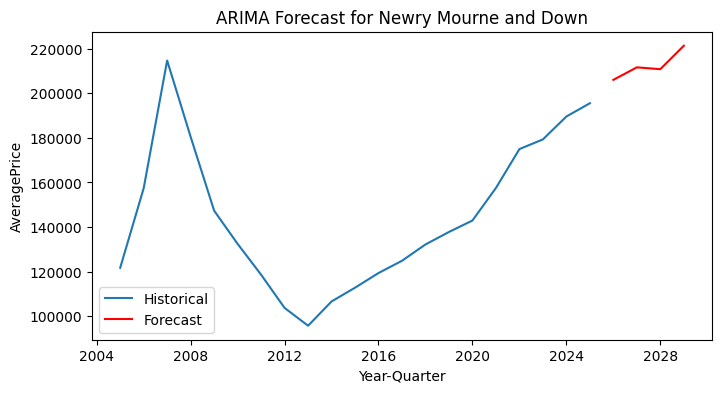

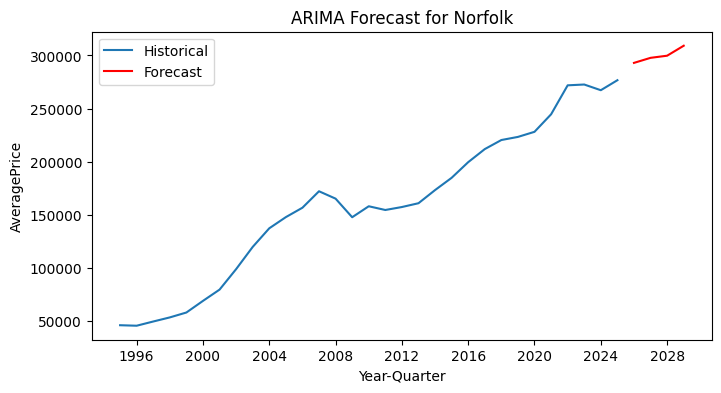

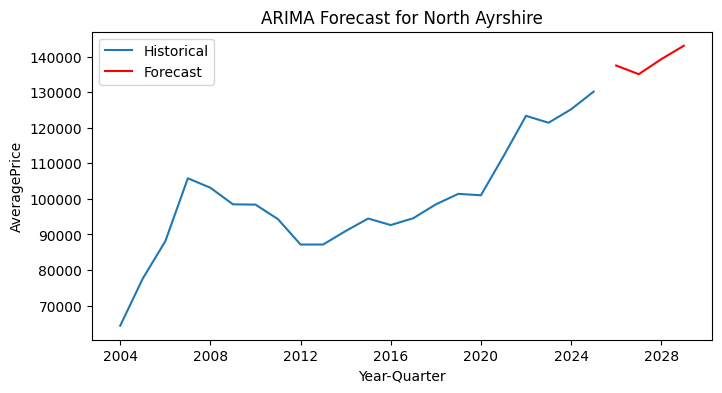

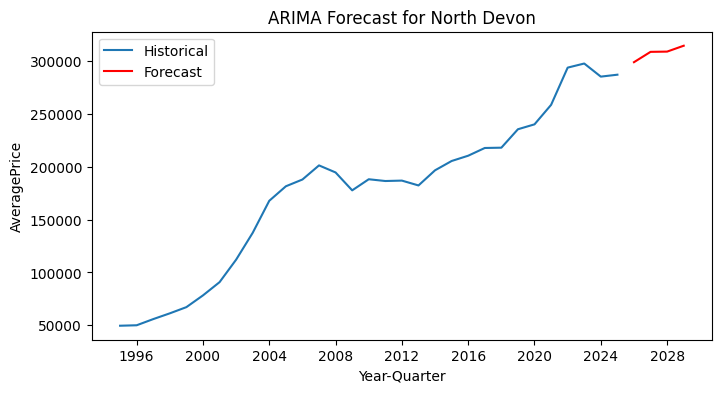

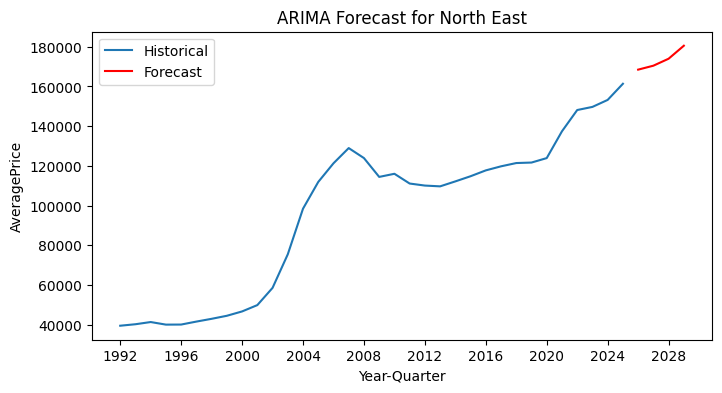

...

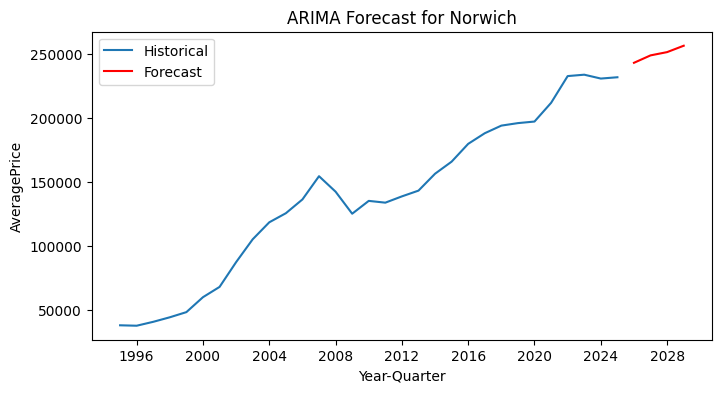

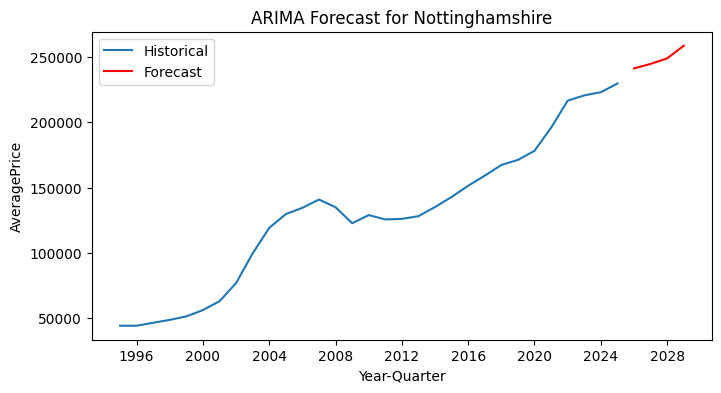

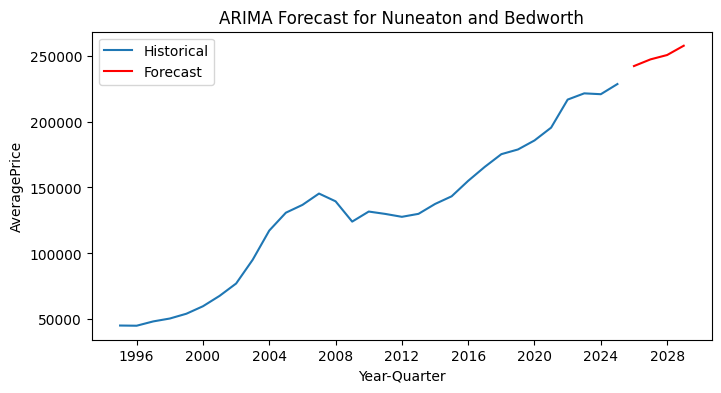

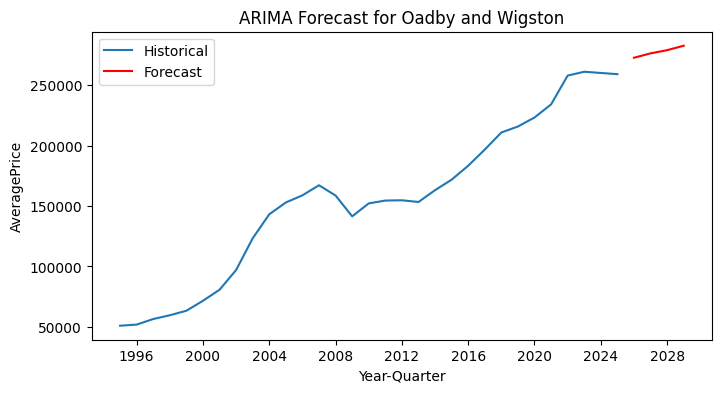

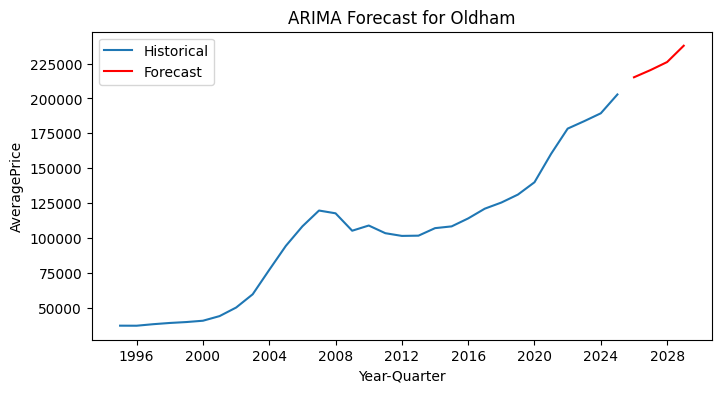

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


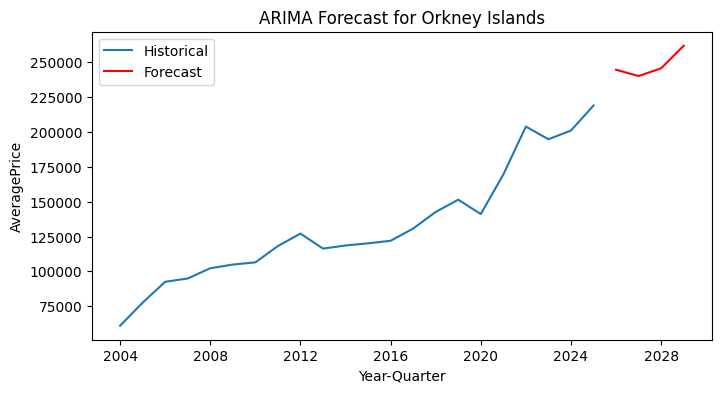

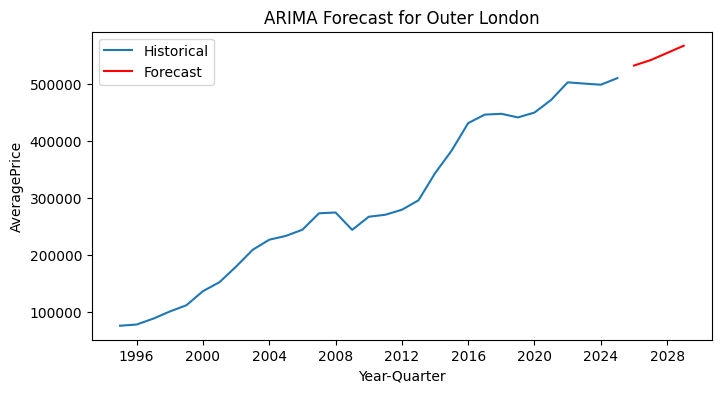

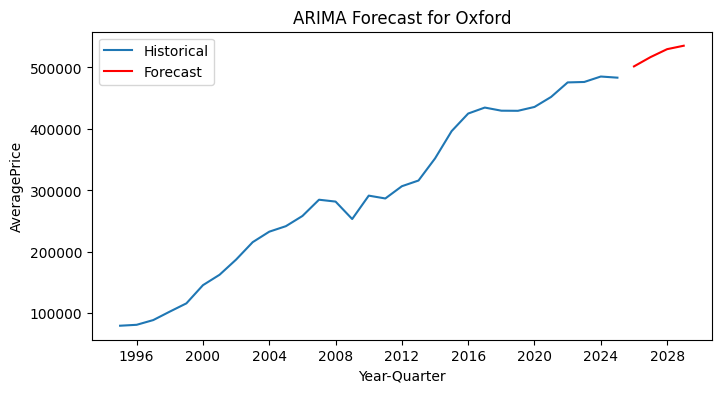

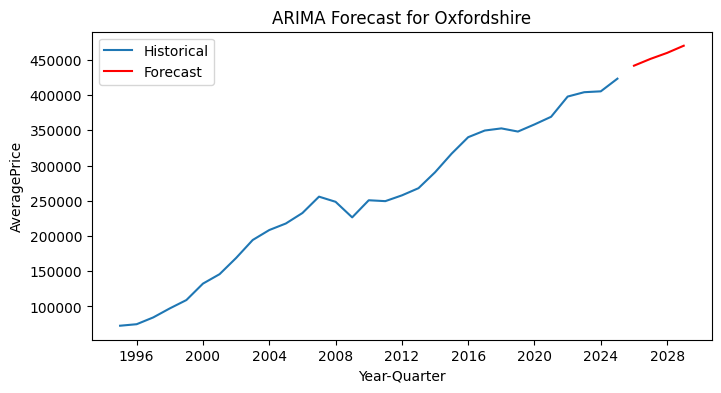

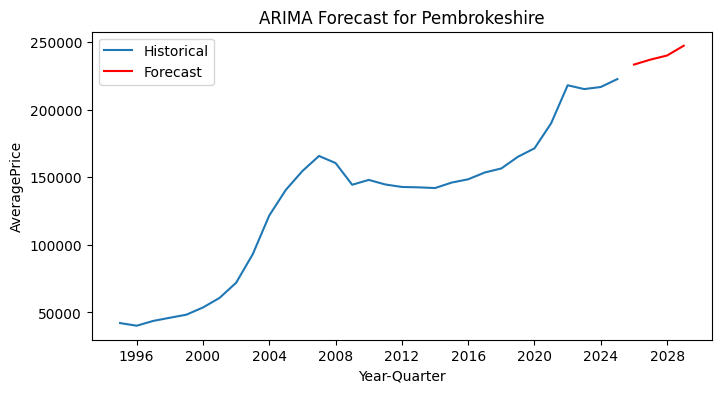

...

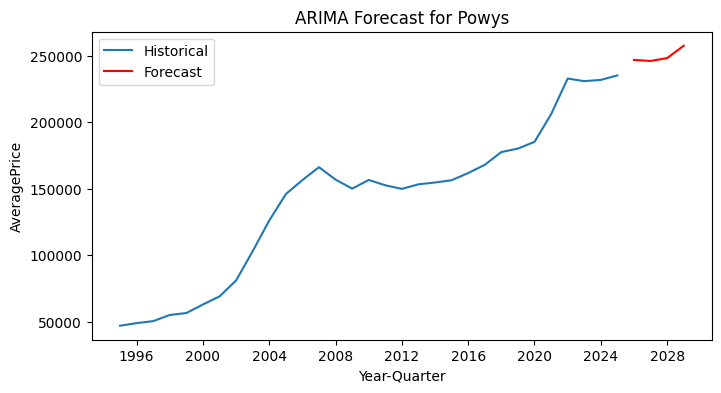

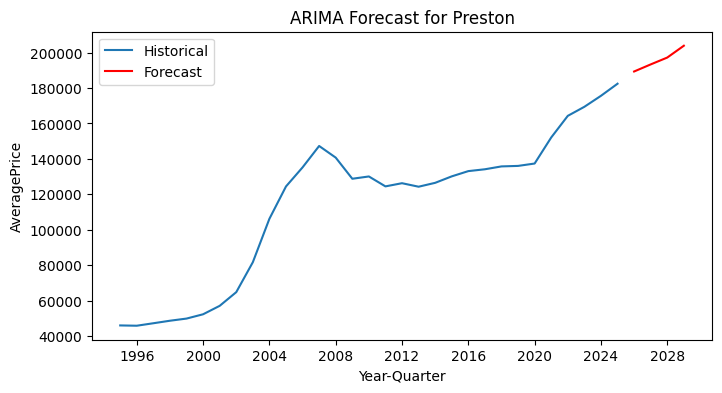

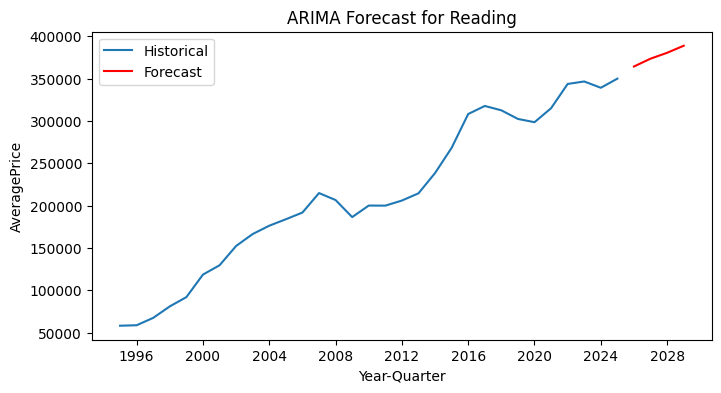

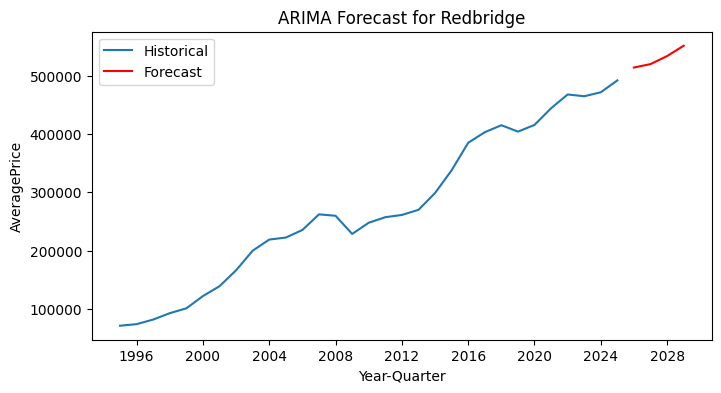

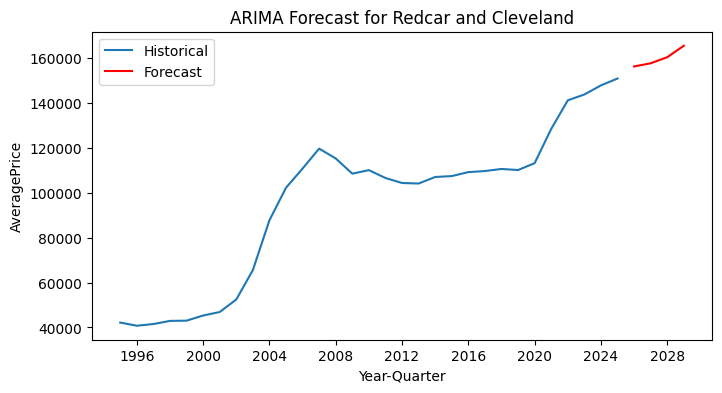

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


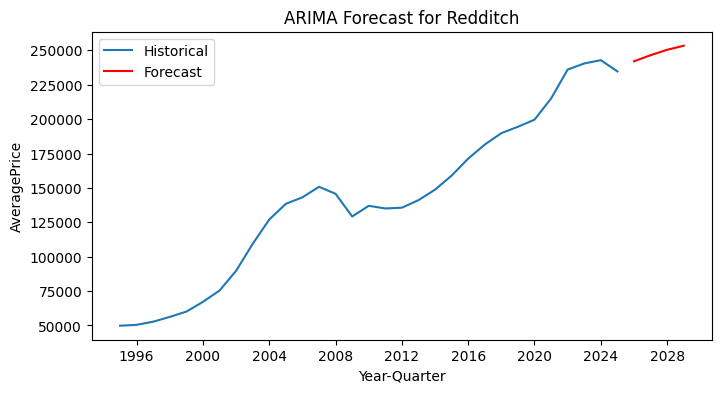

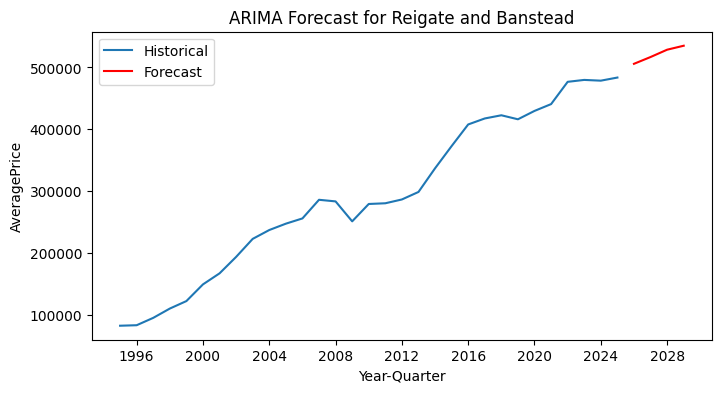

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


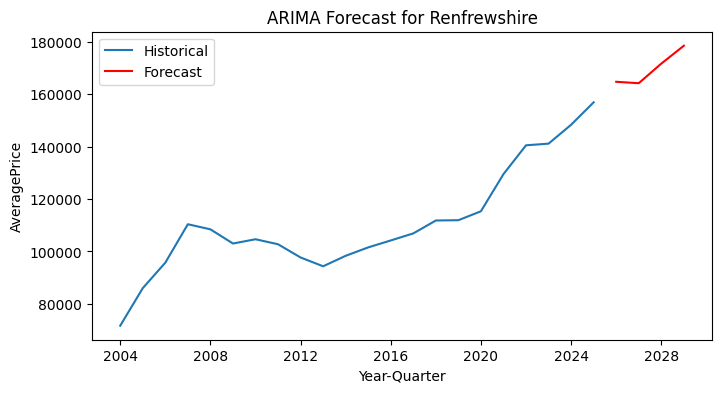

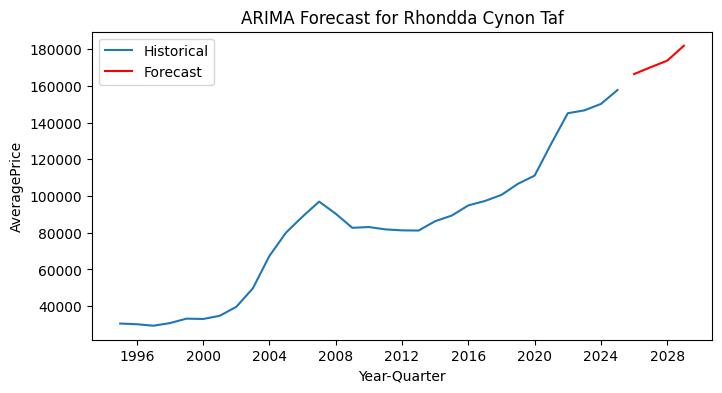

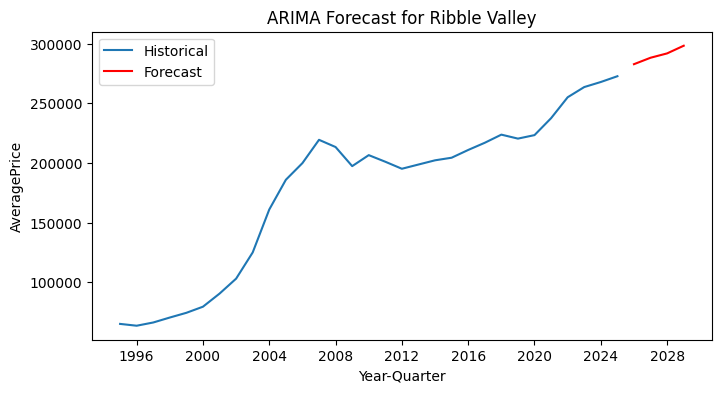

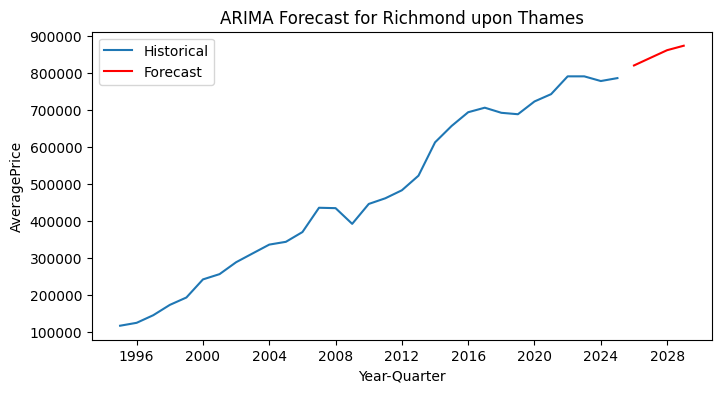

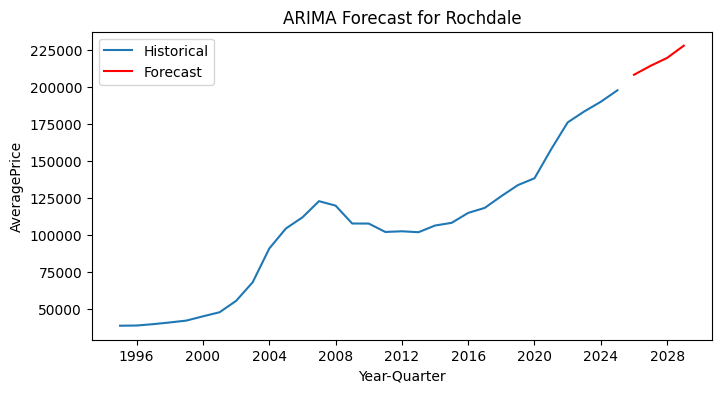

...

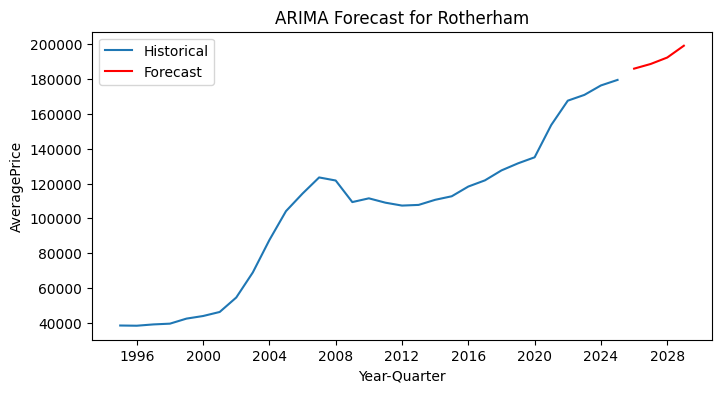

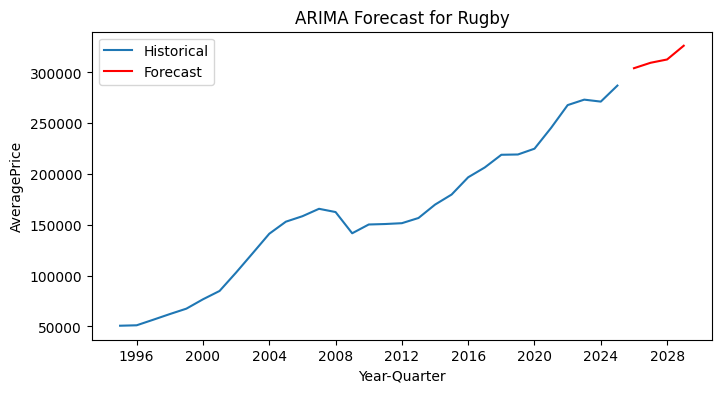

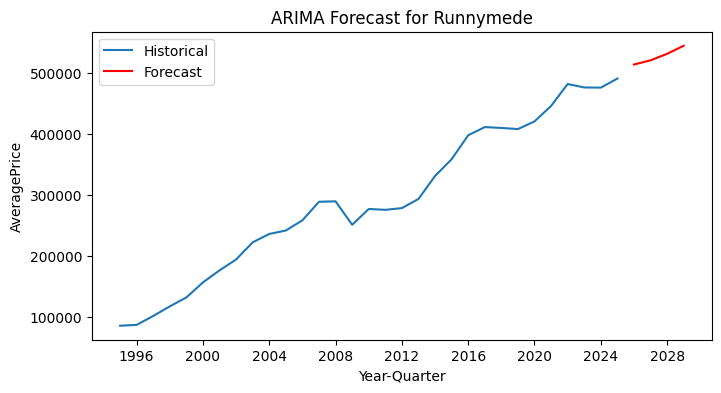

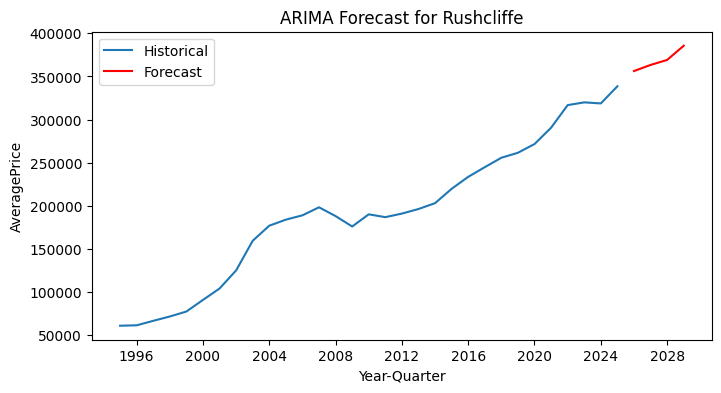

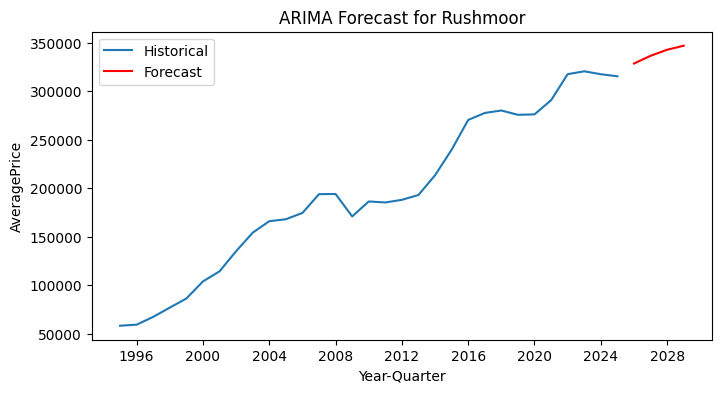

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


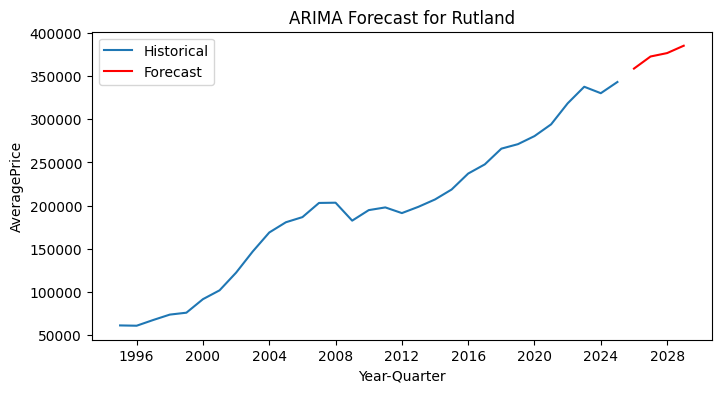

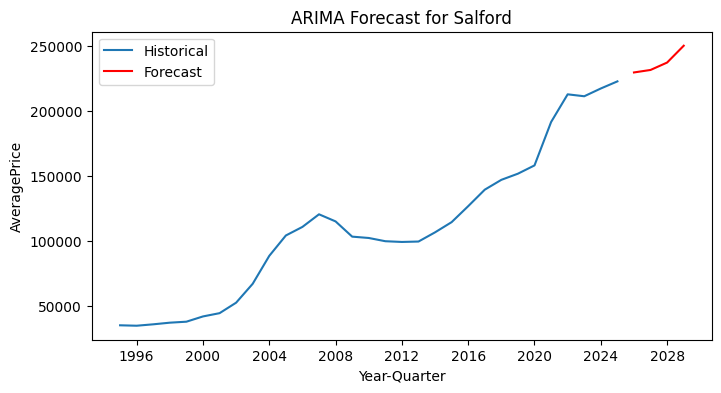

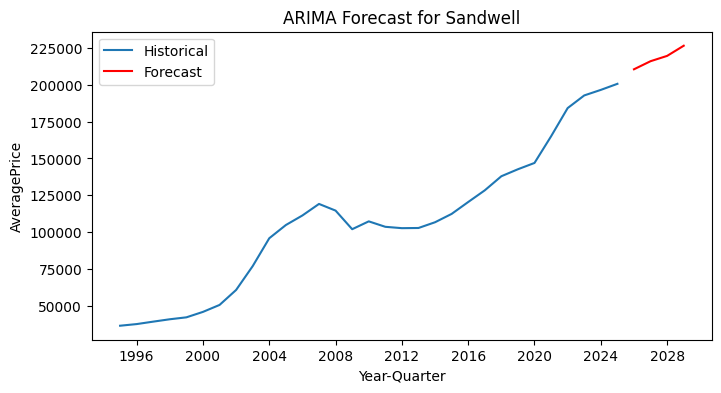

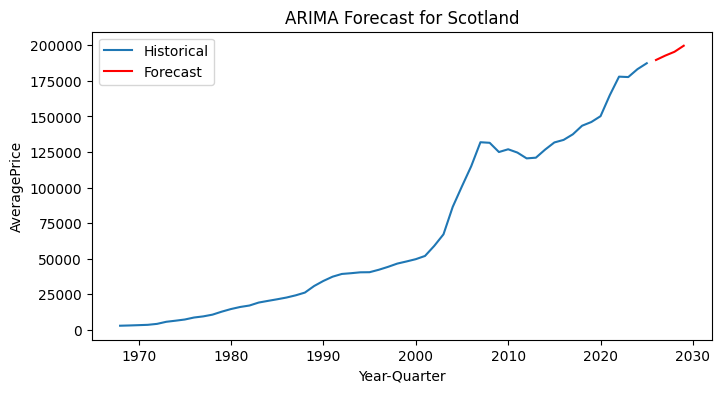

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


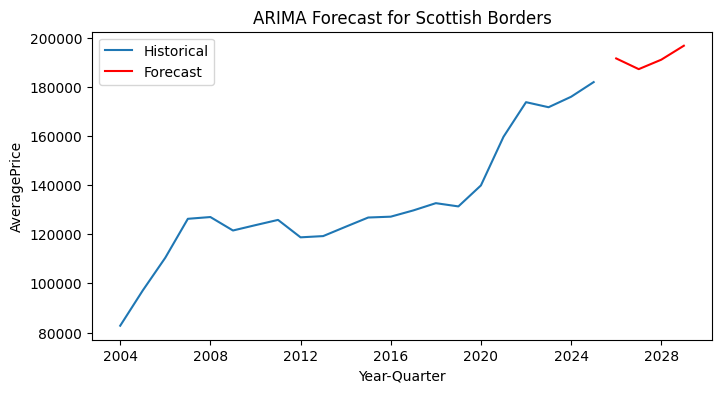

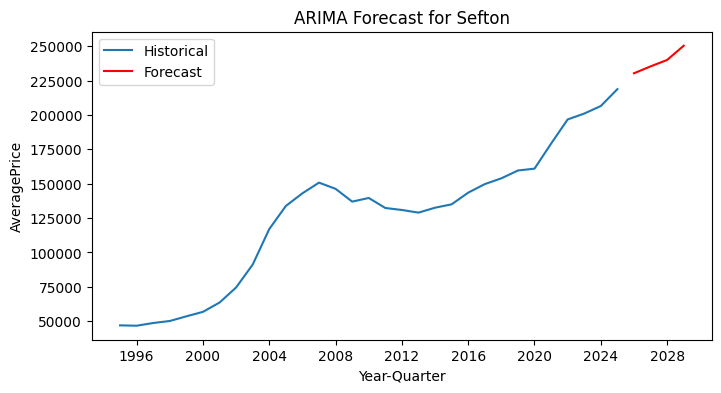

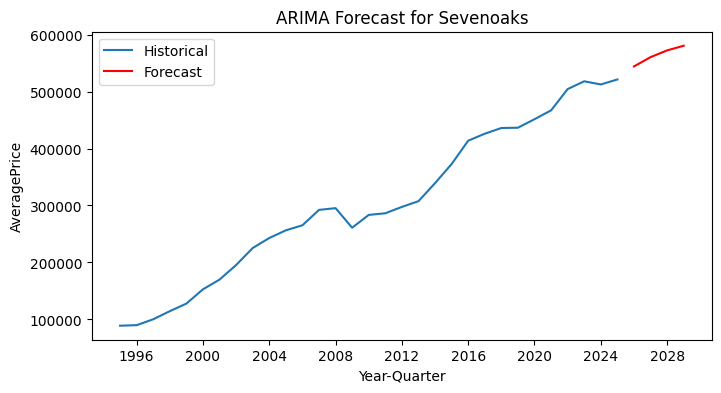

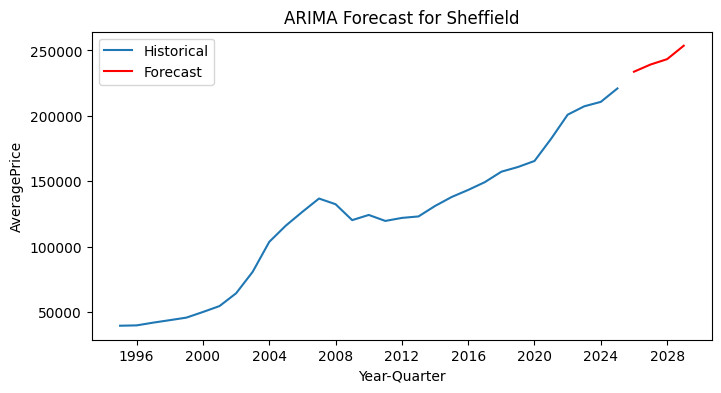

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


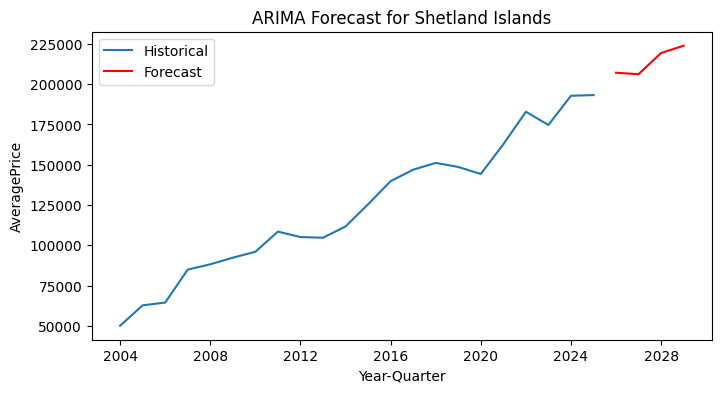

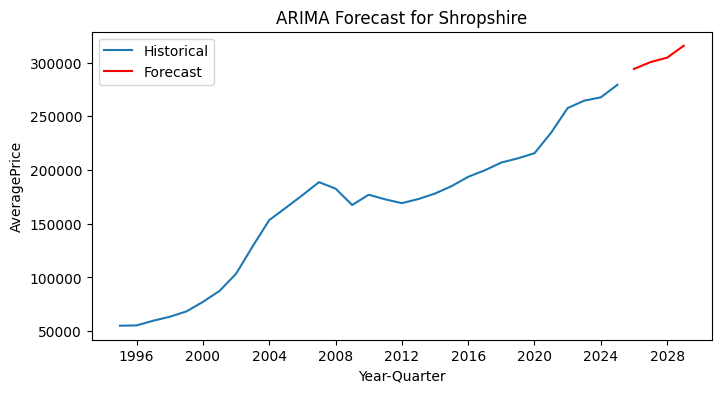

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


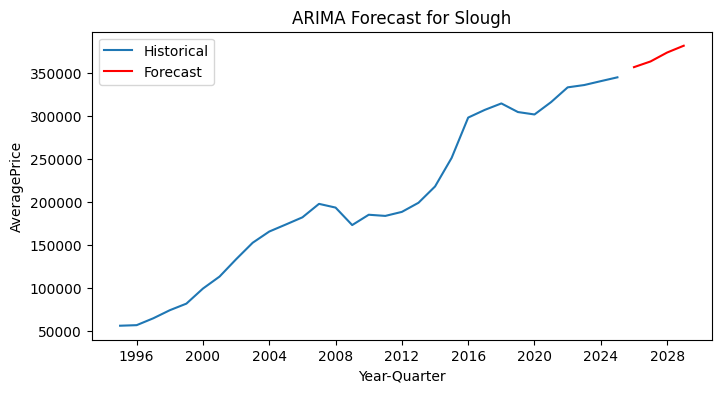

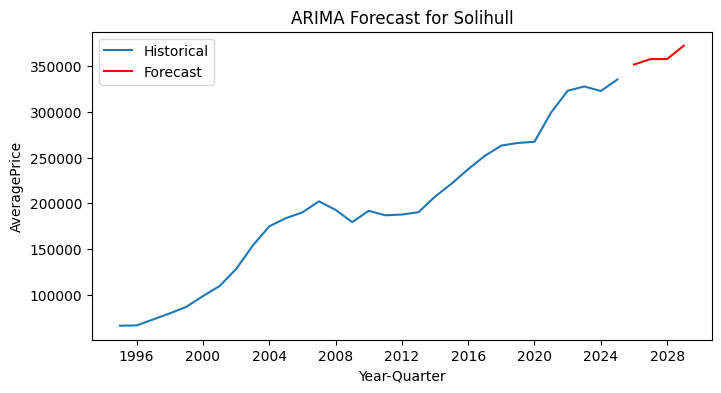

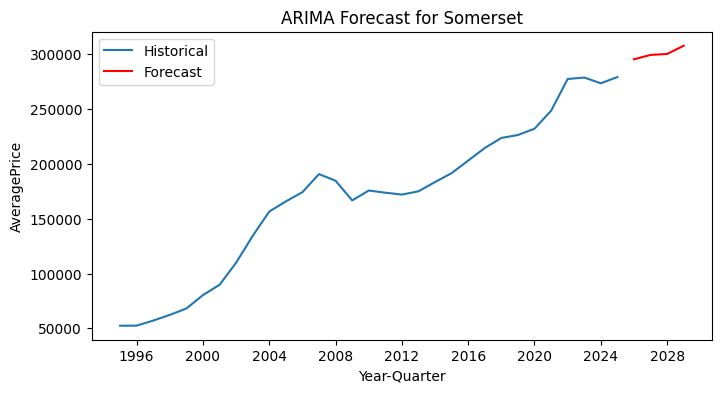

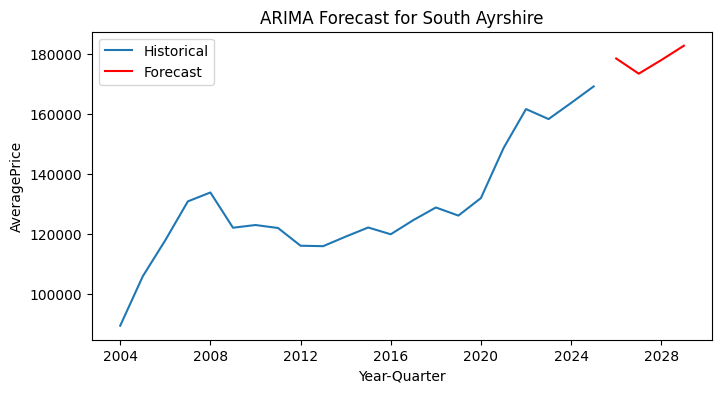

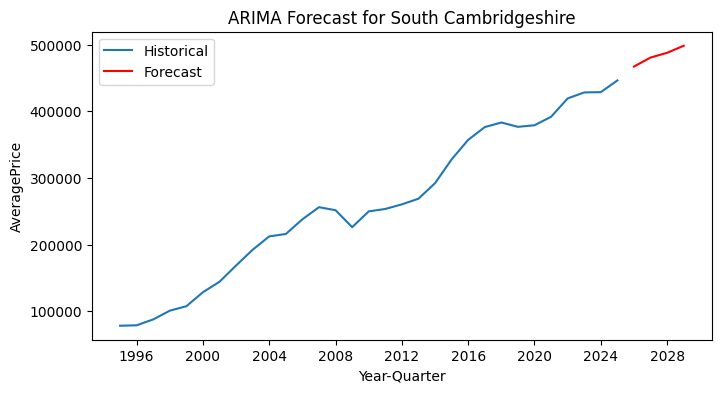

...

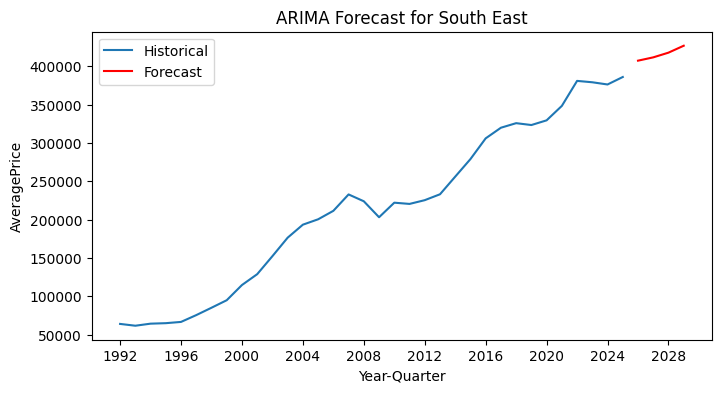

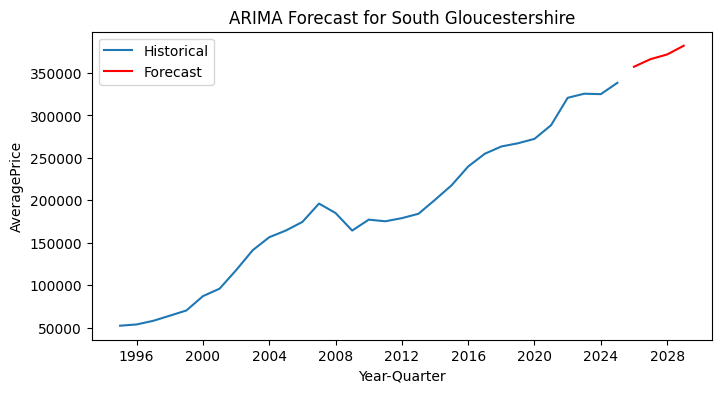

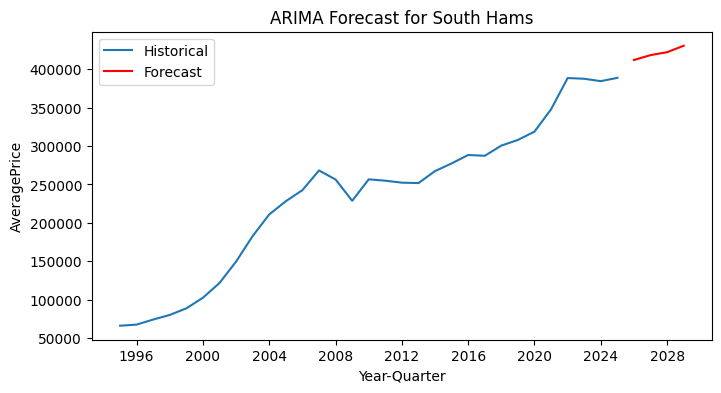

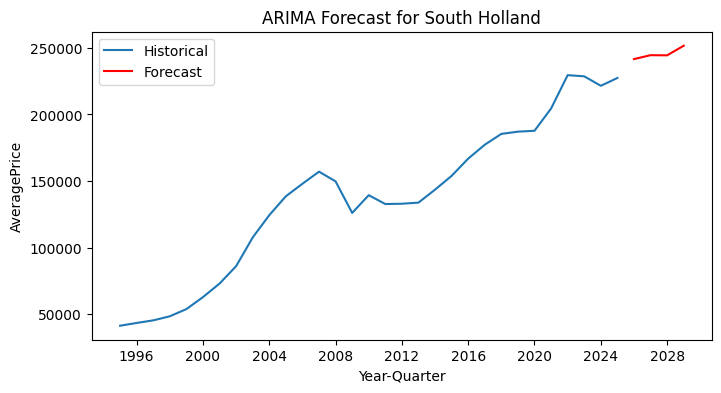

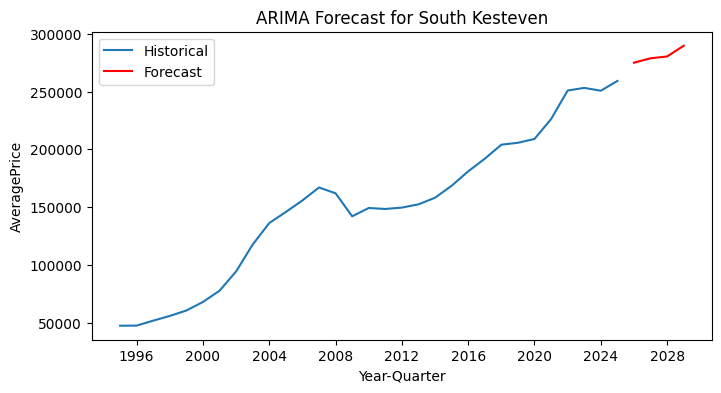

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


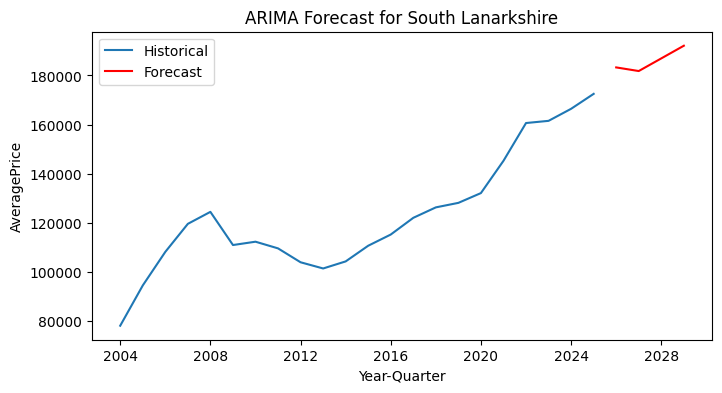

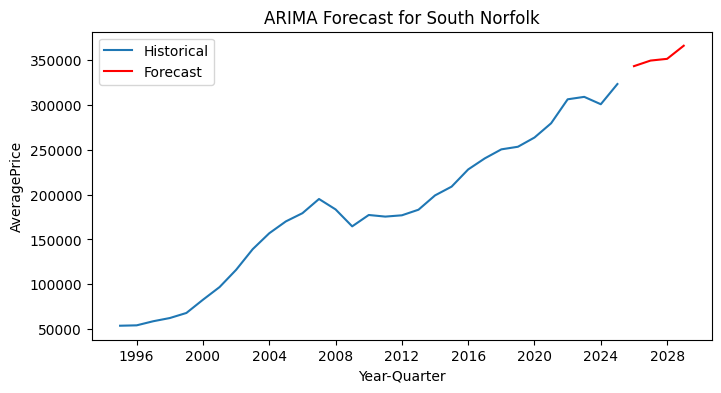

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


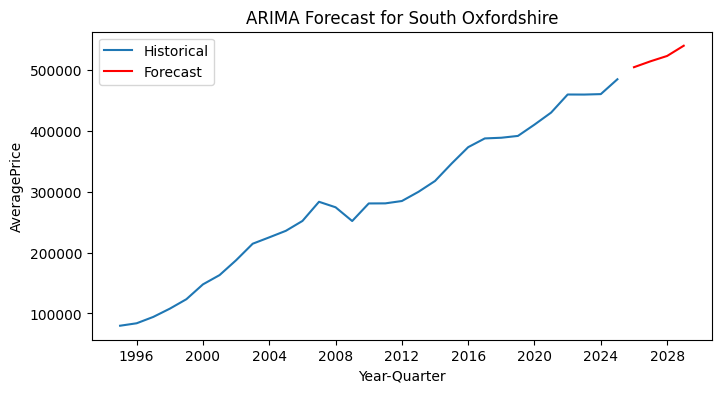

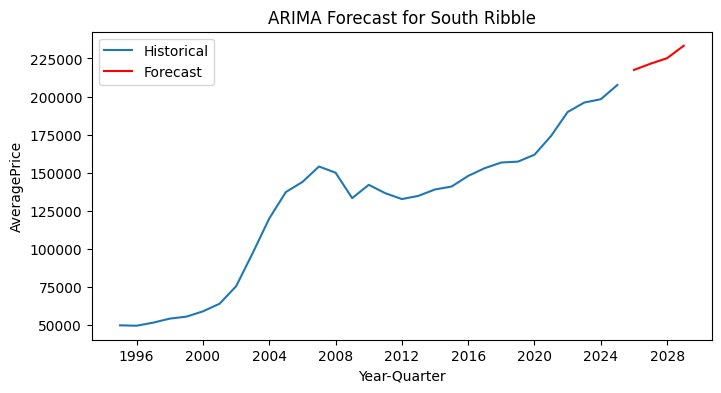

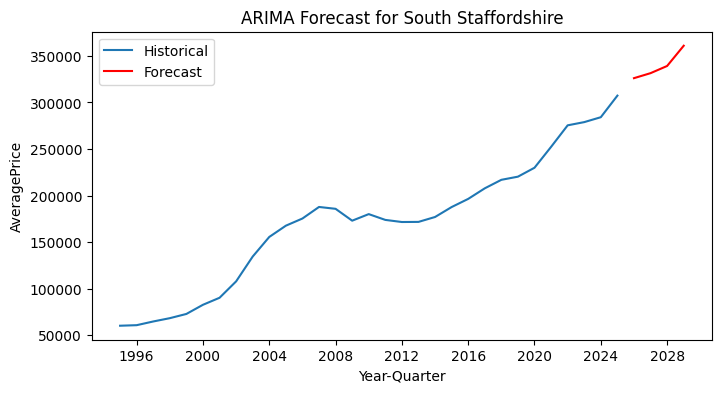

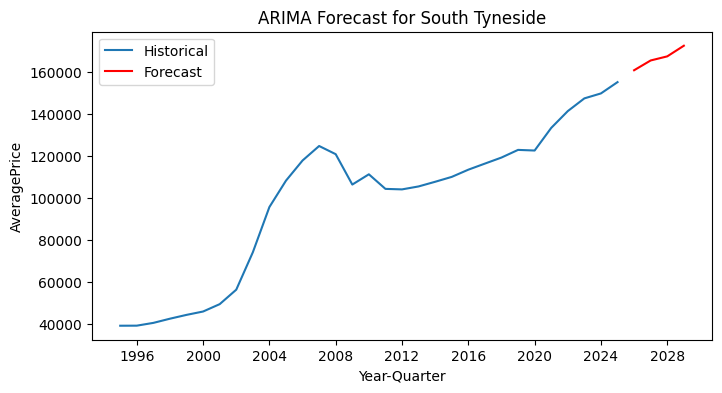

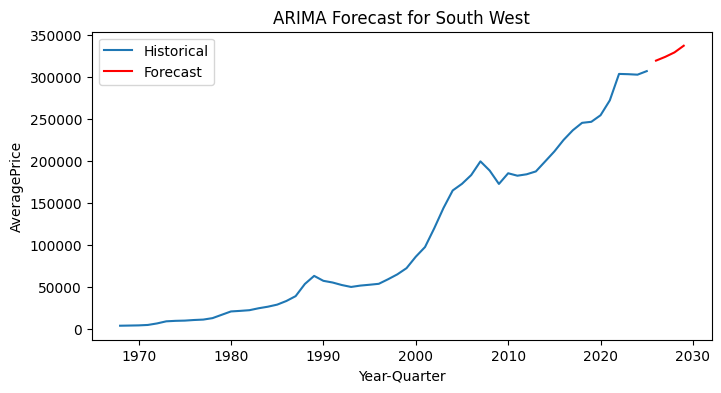

...

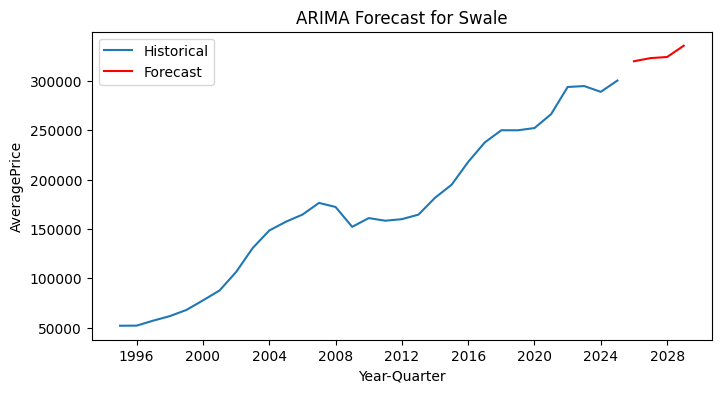

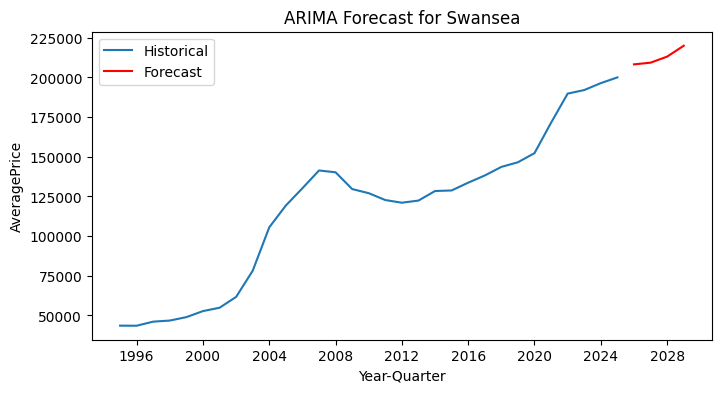

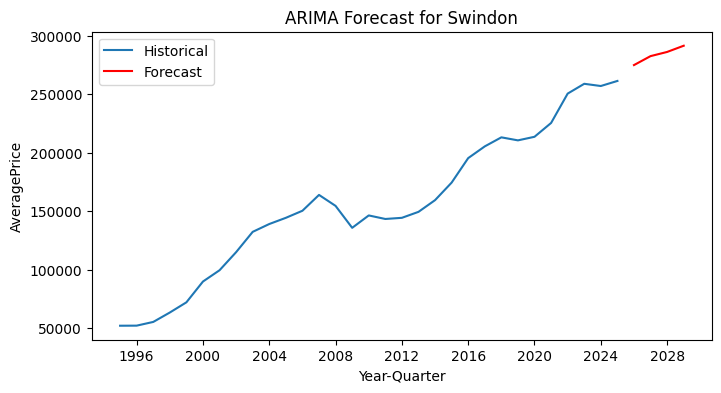

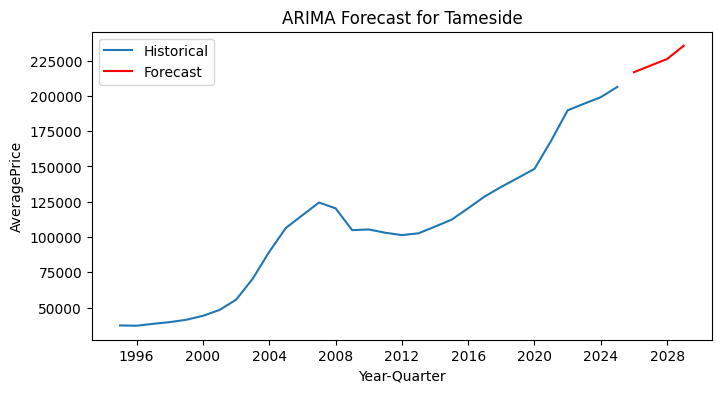

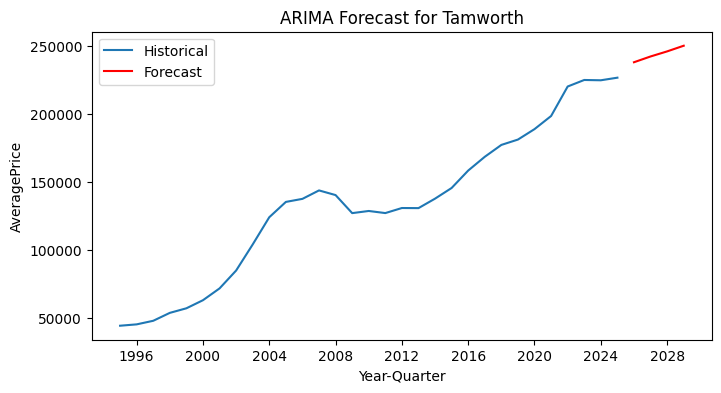

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


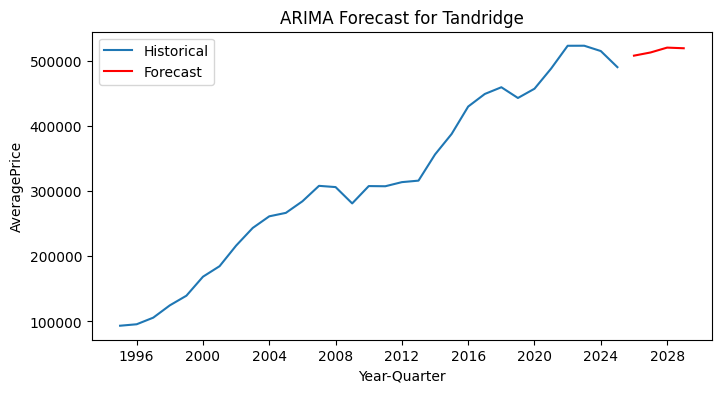

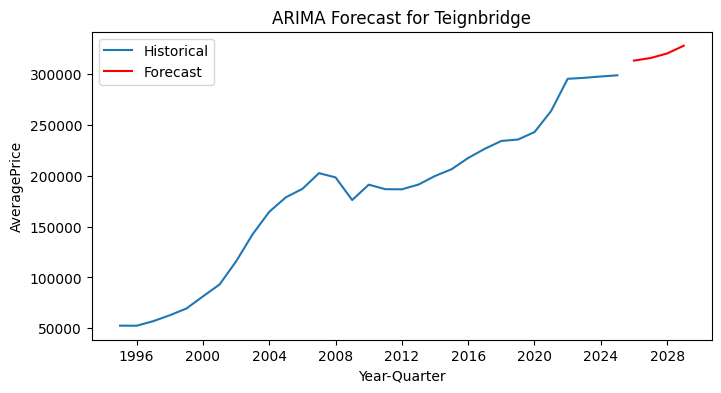

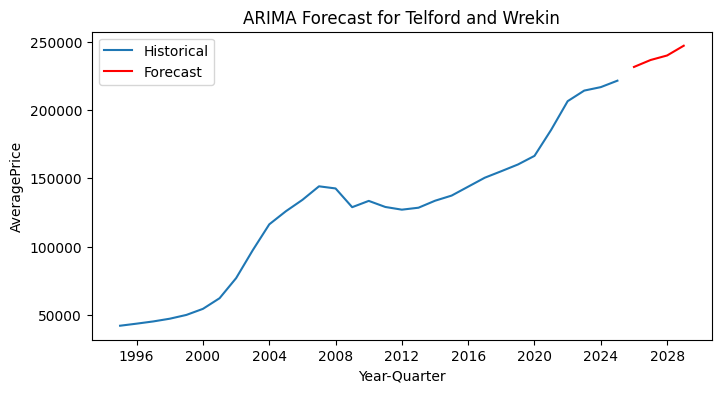

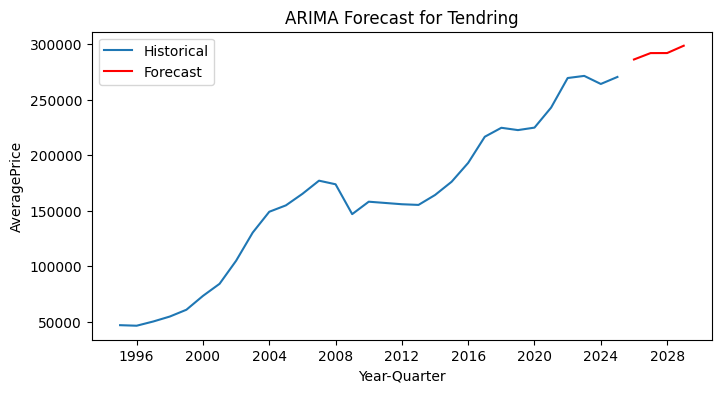

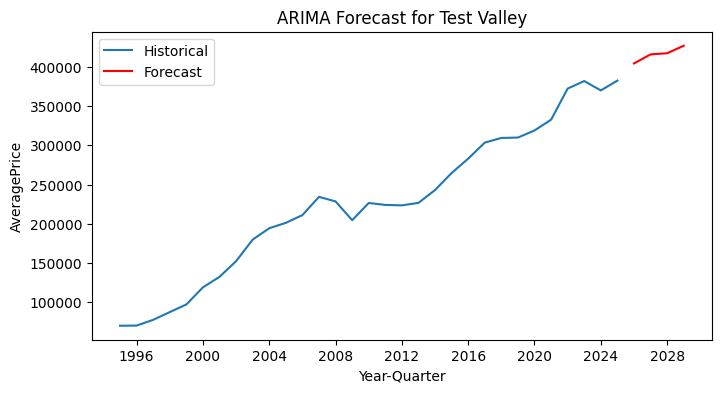

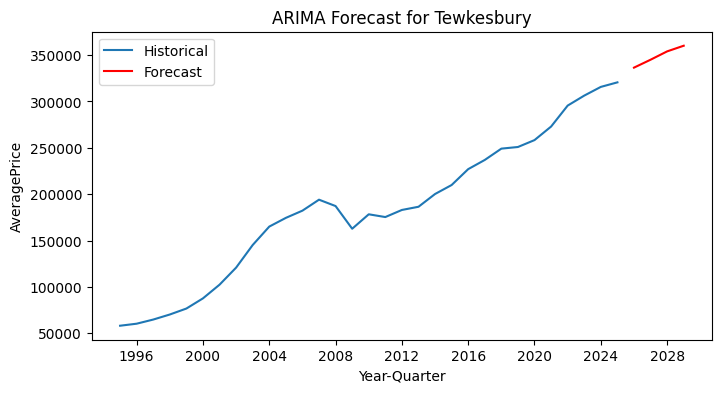

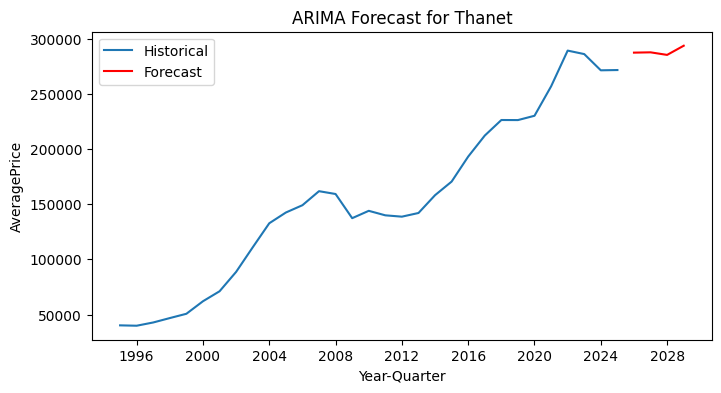

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


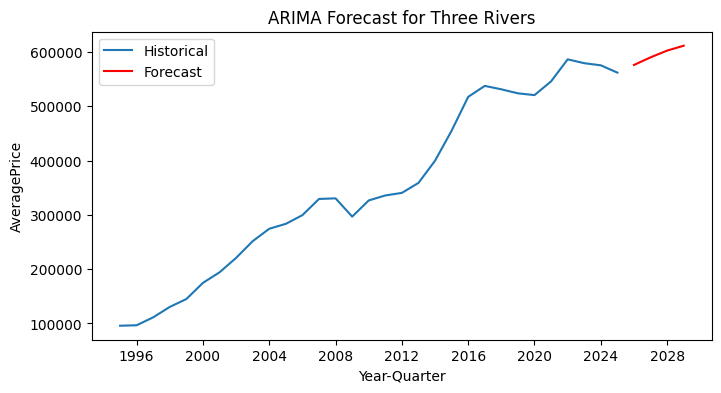

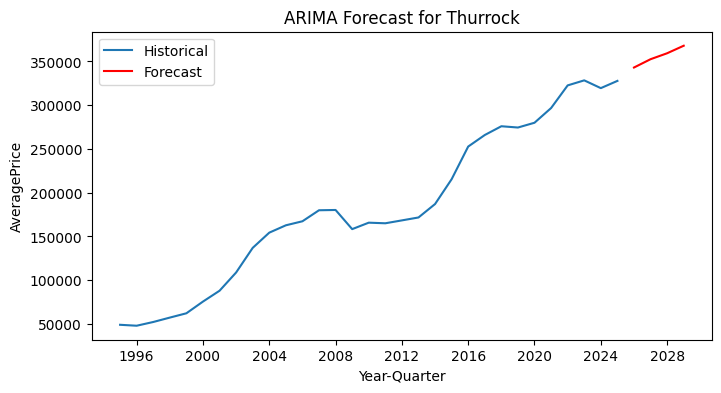

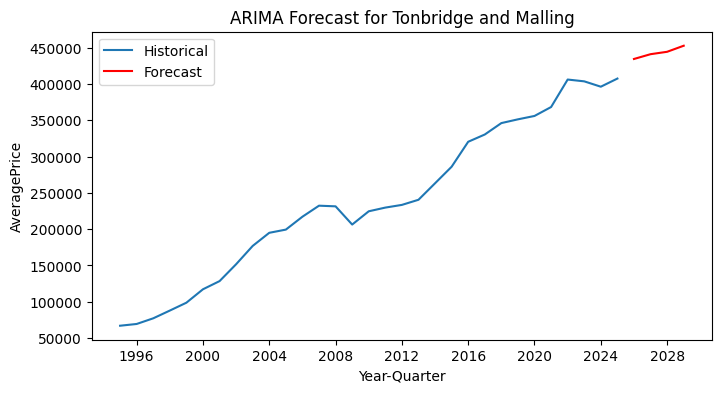

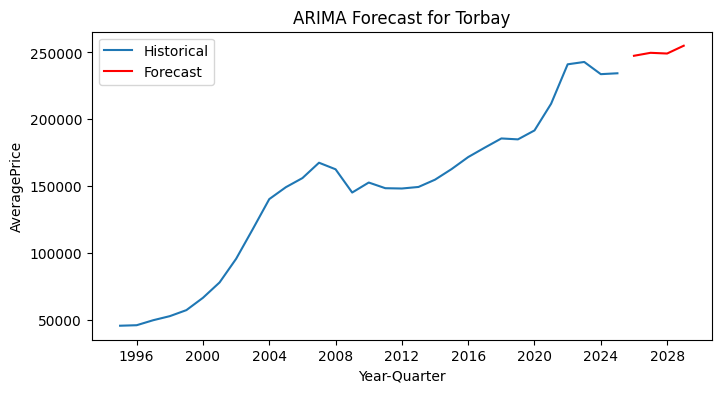

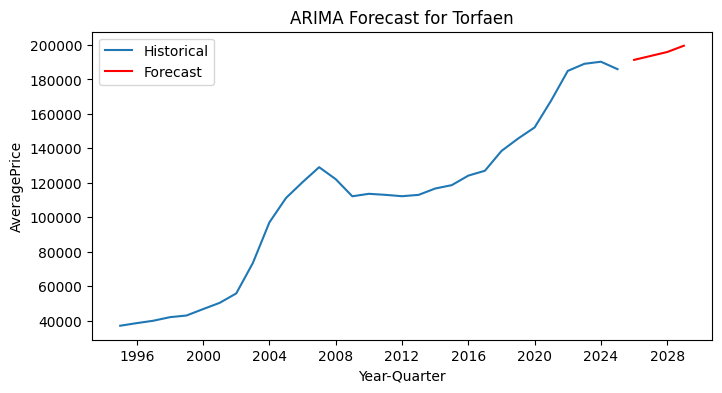

...

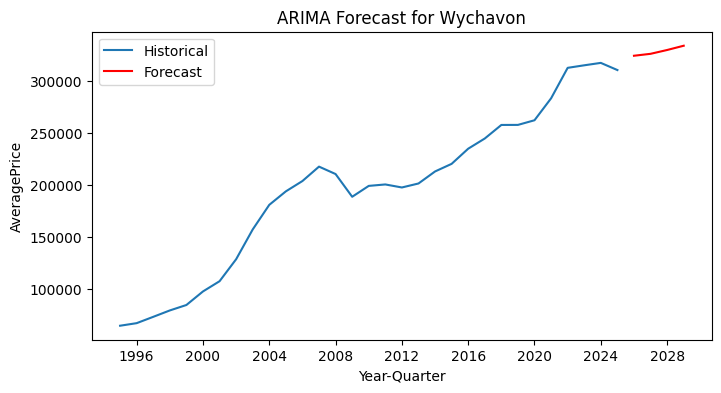

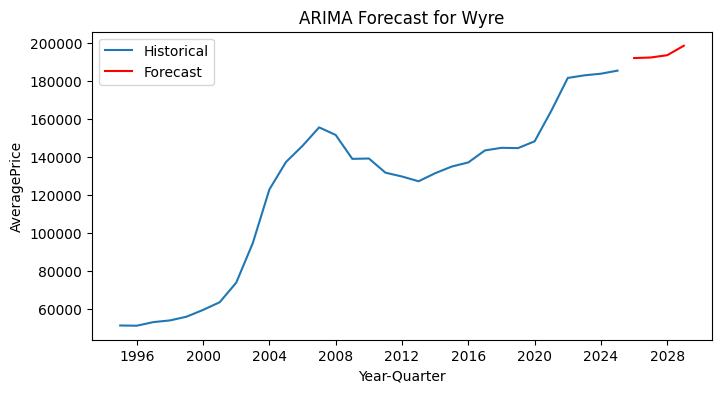

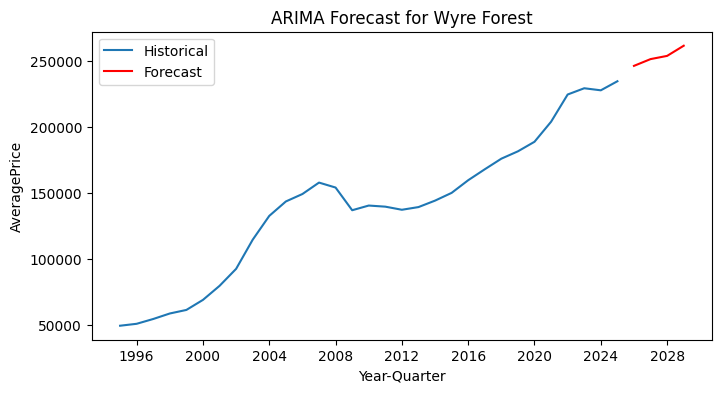

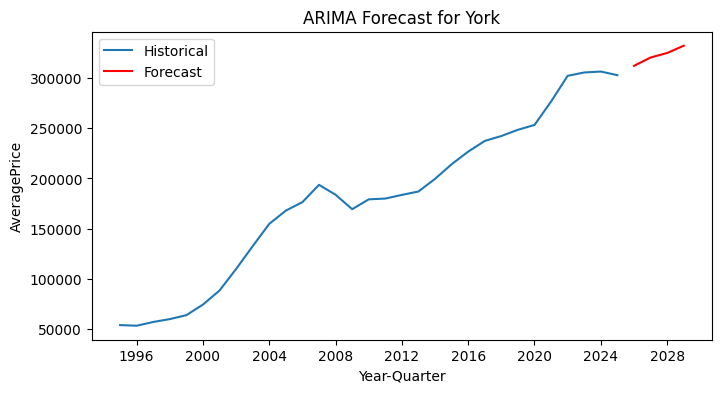

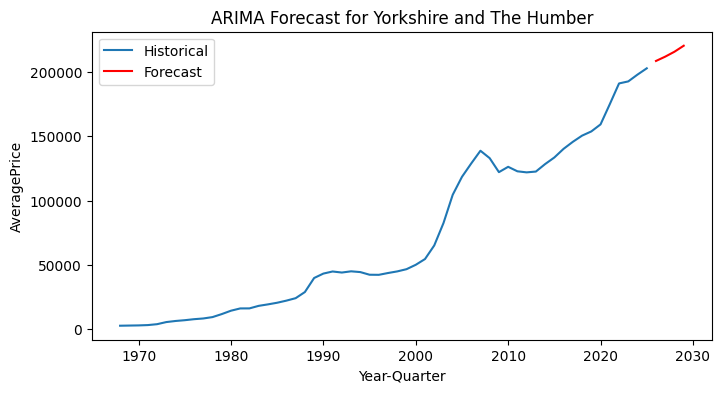

In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Use the new recommended method for PeriodIndex
df['Year_Quarter'] = pd.PeriodIndex.from_fields(year=df['Year'], quarter=df['Quarter'])

# Dictionary to store forecasts
forecasts = {}
arima_models = {}

target_col = 'AveragePrice'  # <-- replace with your actual target column name

# Loop over each region
for region in df['RegionName'].unique():
    # Aggregate target per quarter for this region
    ts = df[df['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()  # Convert to Timestamp for ARIMA

    # Fit ARIMA manually (tune order if needed)
    model = ARIMA(ts, order=(1,1,1), seasonal_order=(1,1,1,4))
    fit = model.fit()

    arima_models[region] = fit
    forecasts[region] = fit.forecast(steps=4)  # Forecast next 4 quarters

    # Plot historical + forecast
    plt.figure(figsize=(8,4))
    plt.plot(ts.index, ts.values, label='Historical')
    plt.plot(forecasts[region].index, forecasts[region].values, label='Forecast', color='red')
    plt.title(f'ARIMA Forecast for {region}')
    plt.xlabel('Year-Quarter')
    plt.ylabel(target_col)
    plt.legend()
    plt.show()


In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed

target_col = 'AveragePrice'  # Replace with your target column

# Ensure quarterly PeriodIndex
df['Year_Quarter'] = pd.PeriodIndex.from_fields(year=df['Year'], quarter=df['Quarter'])

def arima_region(region, df, target_col='Price', train_ratio=0.8, plot=False):
    # Aggregate target per quarter
    ts = df[df['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()

    # Train-test split
    train_size = int(len(ts) * train_ratio)
    train, test = ts[:train_size], ts[train_size:]

    # Fit ARIMA
    model = ARIMA(train, order=(1,1,1), seasonal_order=(1,1,1,4))
    fit = model.fit()

    # Forecast test period
    n_test = len(test)
    pred = fit.forecast(steps=n_test)

    # Compute metrics
    rmse = np.sqrt(mean_squared_error(test, pred))
    mae = mean_absolute_error(test, pred)
    mape = np.mean(np.abs((test - pred) / test)) * 100

    # Optional plot
    if plot:
        plt.figure(figsize=(8,4))
        plt.plot(train.index, train.values, label='Train')
        plt.plot(test.index, test.values, label='Test')
        plt.plot(pred.index, pred.values, label='Forecast', color='red')
        plt.title(f'ARIMA Forecast for {region}')
        plt.xlabel('Year-Quarter')
        plt.ylabel(target_col)
        plt.legend()
        plt.show()

    return {'RegionName': region, 'model': fit, 'forecast': pred,
            'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

# Get all unique regions
regions = df['RegionName'].unique()

# Parallel processing for all regions
results = Parallel(n_jobs=-1)(
    delayed(arima_region)(region, df, target_col, train_ratio=0.8, plot=False)
    for region in regions
)

# Convert results to DataFrame
scores_df = pd.DataFrame(results).drop(columns=['model','forecast'])
print(scores_df.head(15))

# Optional: Access individual ARIMA models or forecasts
region_model = results[0]['model']
region_forecast = results[0]['forecast']

                             RegionName          RMSE           MAE       MAPE
0                         Aberdeenshire  36704.234644  35518.262734  17.490460
1                                  Adur  23645.839961  20609.587720   5.956787
2                          Amber Valley  20628.105312  17298.050691   8.021575
3                                 Angus  14254.215295  14051.011958   8.800293
4               Antrim and Newtownabbey   9751.649421   7796.897247   4.432363
5                   Ards and North Down  15673.904442  14244.053499   7.273718
6                       Argyll and Bute  26593.139304  25995.470872  15.253436
7   Armagh City Banbridge and Craigavon   9178.379475   7215.115418   4.531890
8                                  Arun  16233.392132  14436.597957   4.712134
9                              Ashfield  20996.484585  17636.219936   9.757075
10                              Ashford  16686.647511  14706.916812   4.580364
11                              Babergh  22267.76647

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Combine all region forecasts into one series
all_preds = []
all_actuals = []

for res in results:
    pred = res['forecast']
    region = res['RegionName']
    ts = df[df['RegionName'] == region].groupby('Year_Quarter')[target_col].mean()
    ts.index = ts.index.to_timestamp()
    train_size = int(len(ts) * 0.8)
    test = ts[train_size:]

    all_preds.append(pred)
    all_actuals.append(test)

# Concatenate all regions
y_pred = pd.concat(all_preds)
y_true = pd.concat(all_actuals)

# Compute metrics
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
accuracy_percent = 100 - mape  # optional "score-like" percentage

print("Global ARIMA Performance:")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"MAPE: {mape:.2f}%")
print(f"ARIMA Accuracy Score: {accuracy_percent:.2f}%")

Global ARIMA Performance:
RMSE: 39074.951
MAE: 23398.415
MAPE: 7.85%
ARIMA Accuracy Score: 92.15%


In [ ]:
UKHPI.info()

<class 'pandas.core.frame.DataFrame'>
Index: 141390 entries, 8 to 144629
Data columns (total 44 columns):
 #   Column                  Non-Null Count   Dtype
---  ------                  --------------   -----
 0   AveragePrice            141390 non-null  int64
 1   Index                   141390 non-null  int64
 2   1m%Change               141390 non-null  int64
 3   12m%Change              141390 non-null  int64
 4   SalesVolume             141390 non-null  int64
 5   DetachedPrice           141390 non-null  int64
 6   DetachedIndex           141390 non-null  int64
 7   Detached1m%Change       141390 non-null  int64
 8   Detached12m%Change      141390 non-null  int64
 9   SemiDetachedPrice       141390 non-null  int64
 10  SemiDetachedIndex       141390 non-null  int64
 11  SemiDetached1m%Change   141390 non-null  int64
 12  SemiDetached12m%Change  141390 non-null  int64
 13  TerracedPrice           141390 non-null  int64
 14  TerracedIndex           141390 non-null  int64
 15  Terra

In [ ]:
# Select features (Year_Quarter_Numeric only for now)
features = ['Year_Quarter_Numeric']
target = 'AveragePrice'

scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(df[features])
y_scaled = scaler_y.fit_transform(df[[target]])



In [ ]:
# ==========================
# 2. Sequence Creation
# ==========================
def create_sequences(X, y, seq_length=4):
    Xs, ys = [], []
    for i in range(len(X) - seq_length):
        Xs.append(X[i:(i+seq_length)])
        ys.append(y[i+seq_length])
    return np.array(Xs), np.array(ys)

SEQ_LENGTH = 4
X_seq, y_seq = create_sequences(X_scaled, y_scaled, SEQ_LENGTH)

# Train-test split (80-20 split)
split_idx = int(len(X_seq) * 0.8)
X_train, X_test = X_seq[:split_idx], X_seq[split_idx:]
y_train, y_test = y_seq[:split_idx], y_seq[split_idx:]

In [ ]:
#Convert to tensors
X_train_t = torch.tensor(X_train, dtype=torch.float32)
y_train_t = torch.tensor(y_train, dtype=torch.float32)
X_test_t = torch.tensor(X_test, dtype=torch.float32)
y_test_t = torch.tensor(y_test, dtype=torch.float32)

# DataLoader
train_loader = DataLoader(TensorDataset(X_train_t, y_train_t), batch_size=16, shuffle=True)
test_loader = DataLoader(TensorDataset(X_test_t, y_test_t), batch_size=16, shuffle=False)


In [ ]:
# ==========================
# 3. Define LSTM Model
# ==========================
class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_size=20, num_layers=1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]  # Take last output
        out = self.fc(out)
        return out

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LSTMModel(input_size=len(features), hidden_size=20, num_layers=1).to(device)

# ==========================
# 4. Train Model
# ==========================
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

EPOCHS = 15  # keeps training fast
for epoch in range(EPOCHS):
    model.train()
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        outputs = model(xb).squeeze()
        loss = criterion(outputs, yb.squeeze())
        loss.backward()
        optimizer.step()

    if (epoch+1) % 5 == 0:
        print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {loss.item():.6f}")

# ==========================
# 5. Evaluate Model
# -------------------------
from sklearn.metrics import r2_score

model.eval()
y_pred_scaled = []
y_true_scaled = []

with torch.no_grad():
    for xb, yb in test_loader:
        xb = xb.to(device)
        preds = model(xb).cpu().numpy()
        y_pred_scaled.append(preds)
        y_true_scaled.append(yb.numpy())

y_pred_scaled = np.vstack(y_pred_scaled)
y_true_scaled = np.vstack(y_true_scaled)

# Inverse scale
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_true = scaler_y.inverse_transform(y_true_scaled)

# Scores
r2 = r2_score(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

print(f"\nLSTM R² Score: {r2:.4f} ({r2*100:.2f}%)")
print(f"LSTM RMSE: {rmse:.2f}")

Epoch 5/15, Loss: 0.001899
Epoch 10/15, Loss: 0.001566
Epoch 15/15, Loss: 0.001632

LSTM R² Score: 0.4744 (47.44%)
LSTM RMSE: 85202.70


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import xgboost as xgb

# Features and target
y = UKHPI['AveragePrice']
X = UKHPI.drop(columns=['AveragePrice'])

# Train/test split (time-aware split is recommended for time series)
# Here we assume your data is sorted by date
split_index = int(len(X) * 0.8)
X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

# Convert to XGBoost DMatrix
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# XGBoost parameters
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'eta': 0.1,
    'max_depth': 6,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'seed': 42
}

# Train
num_round = 200
bst = xgb.train(params, dtrain, num_round)

# Predict
y_pred = bst.predict(dtest)

# Scores
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"XGBoost R² Score: {r2:.4f} ({r2*100:.2f}%)")
print(f"XGBoost RMSE: {rmse:,.2f}")


XGBoost R² Score: 0.9993 (99.93%)
XGBoost RMSE: 3,033.66


In [ ]:
UKHPI.corr()

,AveragePrice,Index,1m%Change,12m%Change,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,Detached12m%Change,SemiDetachedPrice,...,Quarter,Year_Quarter_Numeric,AveragePrice_Lag1,AveragePrice_Lag4,AveragePrice_Lag2,AveragePrice_Lag8,RollingMean_4,RollingMean_8,RollingStd_4,RollingStd_8
AveragePrice,1.000000,0.597072,-0.080766,-0.135367,-0.011250,0.901200,0.548121,-0.043190,-0.121358,0.886668,...,NaN,0.569751,0.999496,0.997468,0.998791,0.995356,0.998802,0.998088,0.629235,0.673551
Index,0.597072,1.000000,-0.125442,-0.240430,0.004663,0.405464,0.935518,-0.082691,-0.240913,0.394519,...,NaN,0.925525,0.597544,0.598335,0.597788,0.599944,0.598116,0.599088,0.263616,0.277479
1m%Change,-0.080766,-0.125442,1.000000,0.403022,0.001138,-0.040040,-0.078880,0.761673,0.285547,-0.038629,...,NaN,-0.171024,-0.100052,-0.104166,-0.104875,-0.108168,-0.104452,-0.105702,-0.030937,-0.035856
12m%Change,-0.135367,-0.240430,0.403022,1.000000,0.012989,-0.086026,-0.220867,0.310398,0.921486,-0.085818,...,NaN,-0.304245,-0.142572,-0.165692,-0.150358,-0.194239,-0.154358,-0.168994,0.009226,0.068330
SalesVolume,-0.011250,0.004663,0.001138,0.012989,1.000000,-0.017642,0.002409,0.006856,0.012604,-0.020196,...,NaN,0.005604,-0.011531,-0.012207,-0.011750,-0.012764,-0.011856,-0.012232,-0.034265,-0.030818
DetachedPrice,0.901200,0.405464,-0.040040,-0.086026,-0.017642,1.000000,0.397487,-0.030443,-0.076825,0.982532,...,NaN,0.366018,0.900890,0.899230,0.900399,0.897246,0.900391,0.899740,0.607679,0.647753
DetachedIndex,0.548121,0.935518,-0.078880,-0.220867,0.002409,0.397487,1.000000,-0.092904,-0.249616,0.384565,...,NaN,0.828721,0.548803,0.550100,0.549247,0.552327,0.549623,0.550878,0.216121,0.220991
Detached1m%Change,-0.043190,-0.082691,0.761673,0.310398,0.006856,-0.030443,-0.092904,1.000000,0.339214,-0.029730,...,NaN,-0.080179,-0.063075,-0.066982,-0.067767,-0.070230,-0.067375,-0.068410,-0.009095,-0.018490
Detached12m%Change,-0.121358,-0.240913,0.285547,0.921486,0.012604,-0.076825,-0.249616,0.339214,1.000000,-0.076827,...,NaN,-0.264013,-0.128335,-0.150833,-0.135914,-0.178986,-0.139806,-0.154136,0.009326,0.071399
SemiDetachedPrice,0.886668,0.394519,-0.038629,-0.085818,-0.020196,0.982532,0.384565,-0.029730,-0.076827,1.000000,...,NaN,0.355472,0.886366,0.884788,0.885891,0.882949,0.885897,0.885313,0.620904,0.658225


#..

In [ ]:
ddf_label_encoded = df_label_encoded.drop(columns=['RegionName', 'AreaCode', 'YearQuarter', 'RegionName_enc'], errors='ignore')


In [ ]:
UkHPI_reduced= df_label_encoded.copy()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3627
[LightGBM] [Info] Number of data points in the train set: 11224, number of used features: 32
[LightGBM] [Info] Start training from score 172367.389166


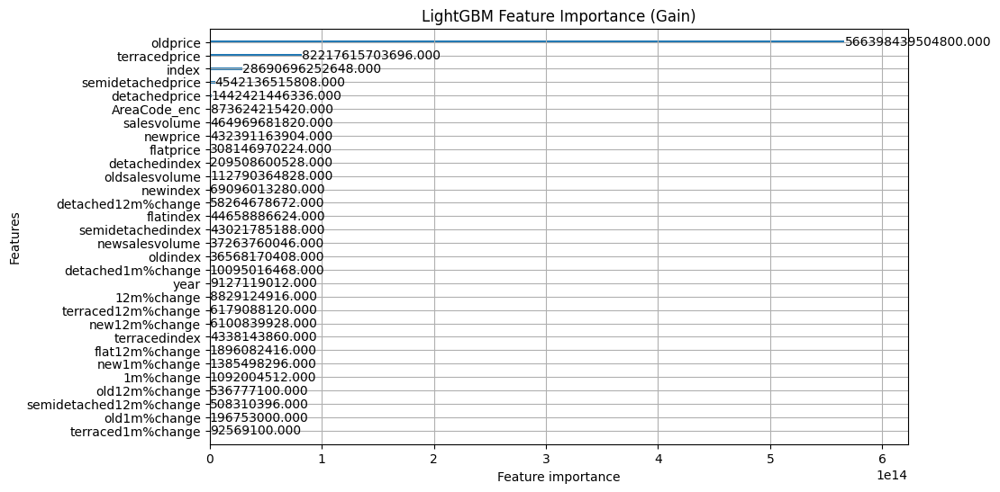

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Split features and target
X = UkHPI_reduced.drop("AveragePrice", axis=1)
y = UkHPI_reduced["AveragePrice"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train LightGBM
model = lgb.LGBMRegressor()
model.fit(X_train, y_train)

# Plot feature importance
lgb.plot_importance(model, figsize=(10, 6), importance_type='gain')
plt.title("LightGBM Feature Importance (Gain)")
plt.show()
